In [1]:
import pandas as pd
from venn import venn
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
import seaborn

## DEG number boxplots

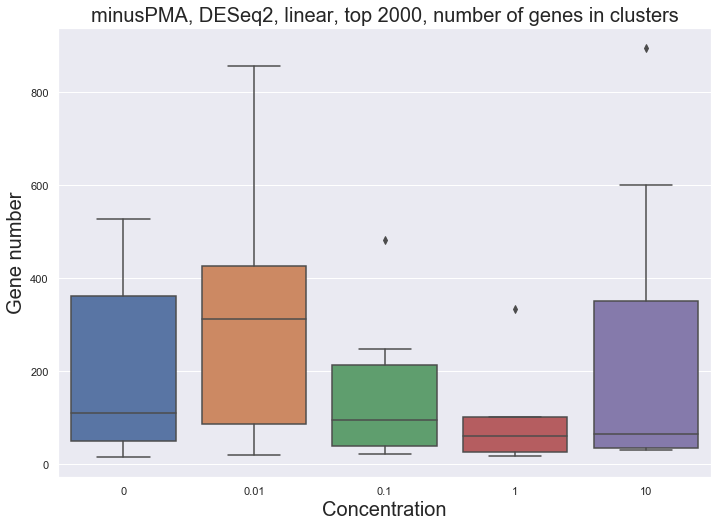

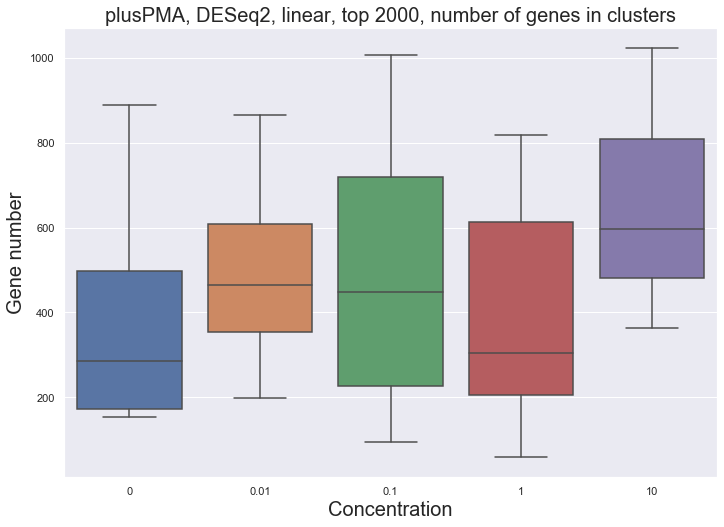

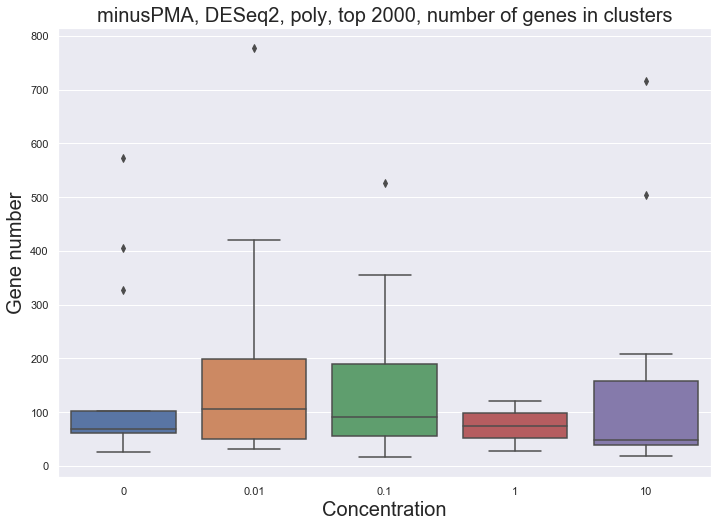

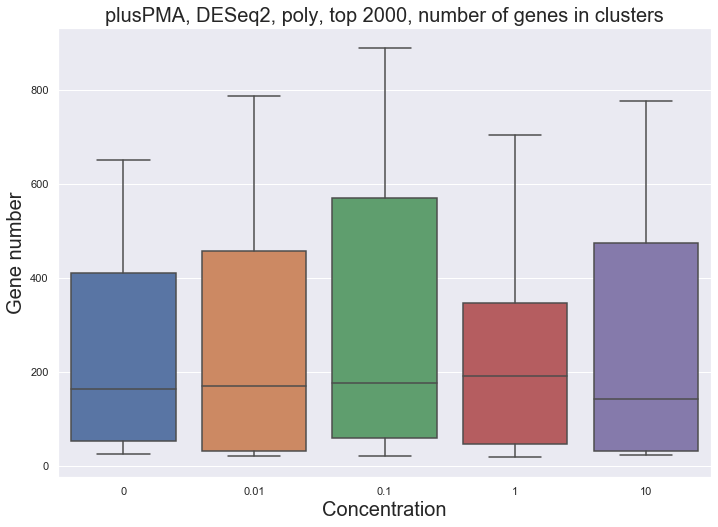

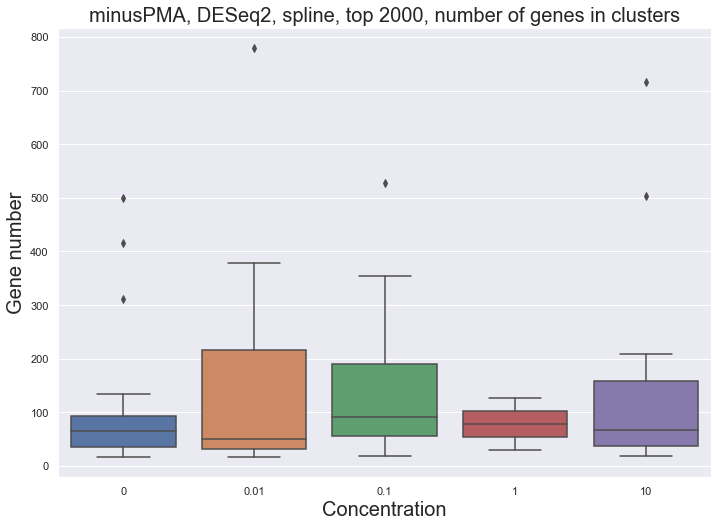

...

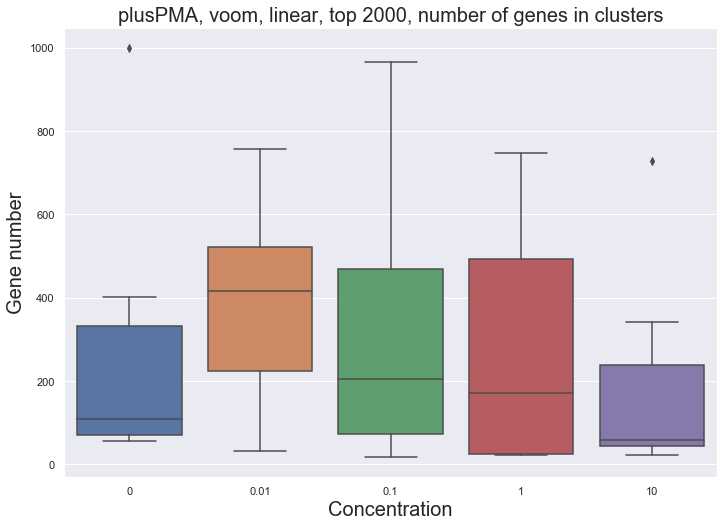

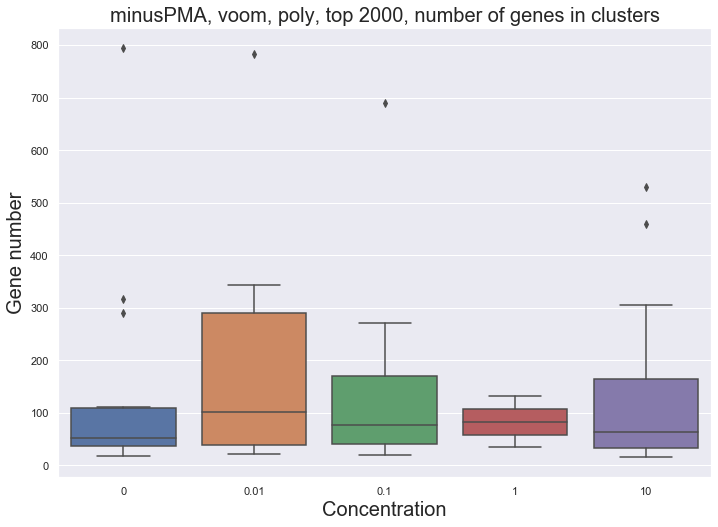

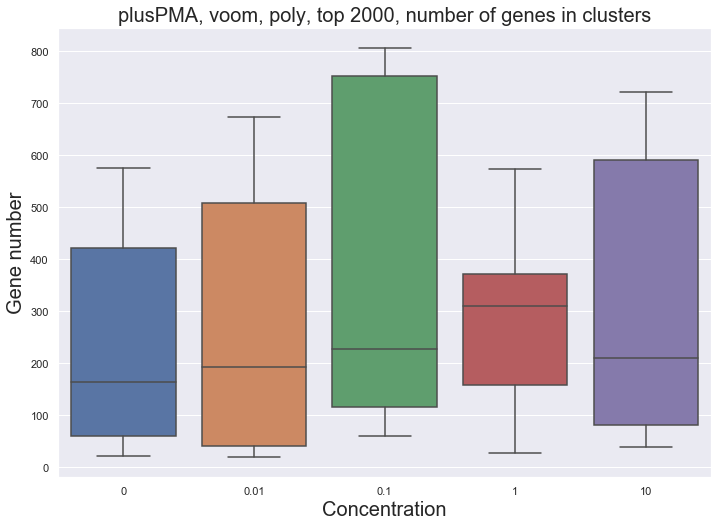

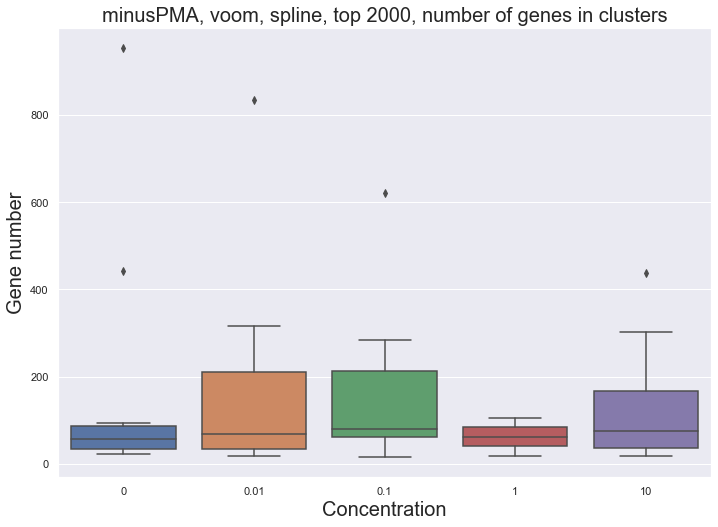

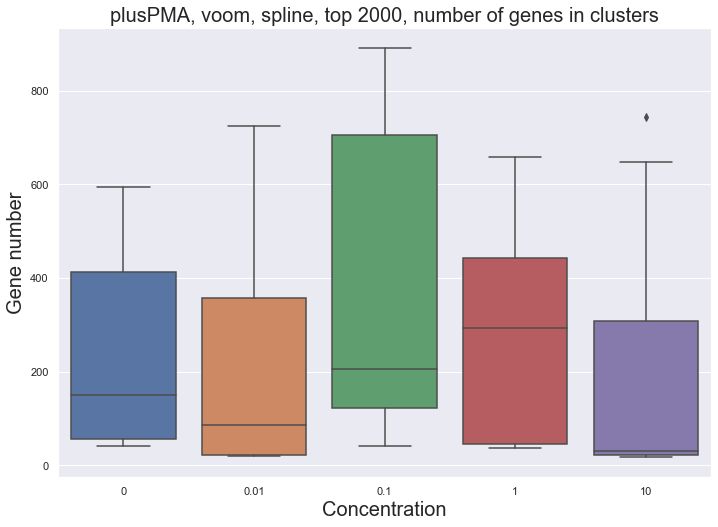

In [3]:
path = ""
output_path=""
methods = ['DESeq2', 'edgeR', 'voom']
pma_types = ['minus','plus']
regr_types = ['linear','poly','spline']
for method in methods:
    for regr_type in regr_types:
        for pma_type in pma_types:
            time_0 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_0_clusters_{regr_type}_2000.csv', sep = '\t')
            time_001 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_001_clusters_{regr_type}_2000.csv', sep = '\t')
            time_01 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_01_clusters_{regr_type}_2000.csv', sep = '\t')
            time_1 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_1_clusters_{regr_type}_2000.csv', sep = '\t')
            time_10 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_10_clusters_{regr_type}_2000.csv', sep = '\t')

            df = pd.DataFrame(columns = ['concentration','geneNum'])
            for geneNum in time_0.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series(['0',geneNum], index = df.columns), ignore_index=True)

            for geneNum in time_001.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series(['0.01',geneNum], index = df.columns), ignore_index=True)

            for geneNum in time_01.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series(['0.1',geneNum], index = df.columns), ignore_index=True)

            for geneNum in time_1.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series(['1',geneNum], index = df.columns), ignore_index=True)

            for geneNum in time_10.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series(['10',geneNum], index = df.columns), ignore_index=True)

            seaborn.set(rc={'figure.figsize':(11.7,8.27)})
            plt.figure().clf()  
            ax = seaborn.boxplot(x="concentration", y="geneNum", data=df)
            ax.axes.set_title(f"{pma_type}PMA, {method}, {regr_type}, top 2000, number of genes in clusters",fontsize=20)
            ax.set_xlabel("Concentration",fontsize=20)
            ax.set_ylabel("Gene number",fontsize=20)
            plt.savefig(f"{output_path}//{pma_type}PMA_{method}_{regr_type}_time_cluster_gene_num_2000.png")


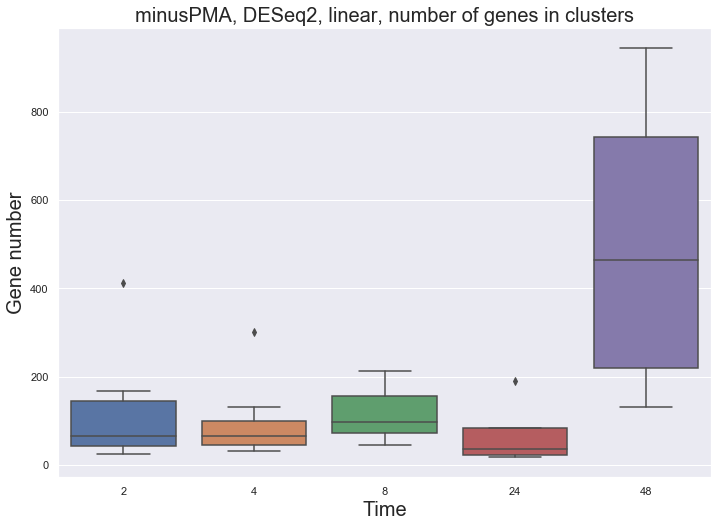

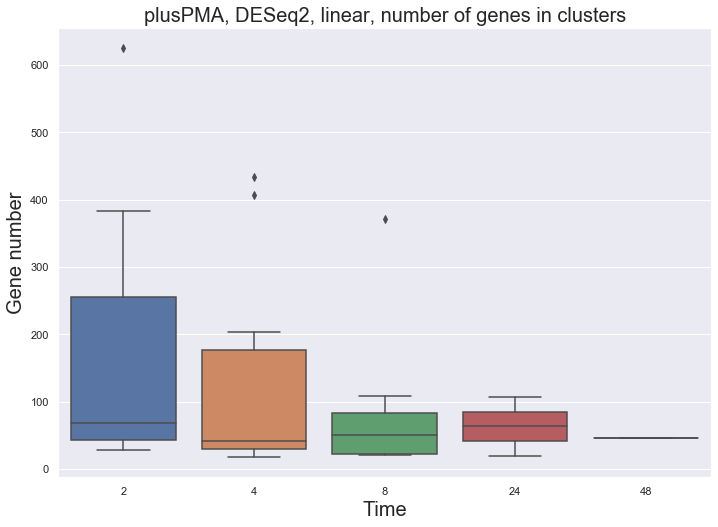

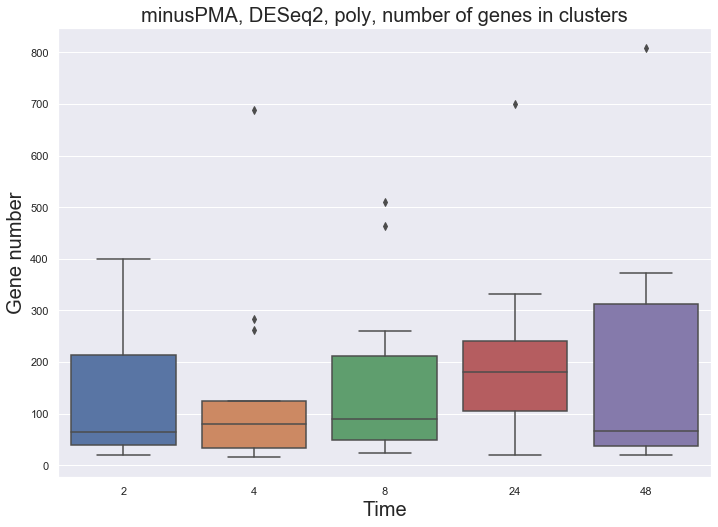

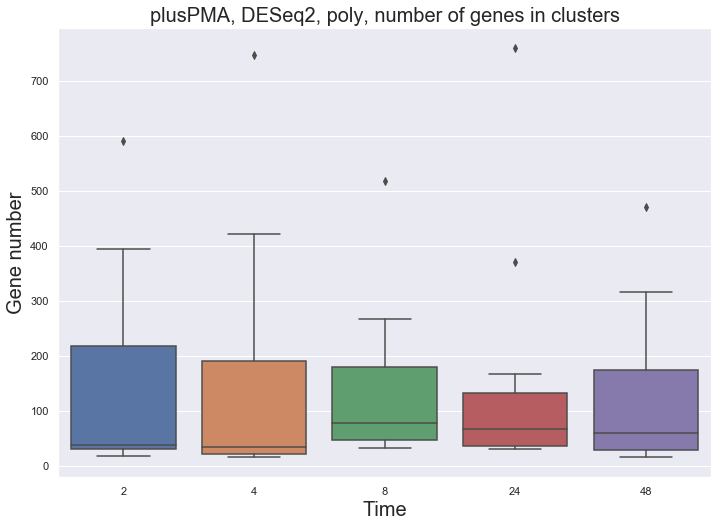

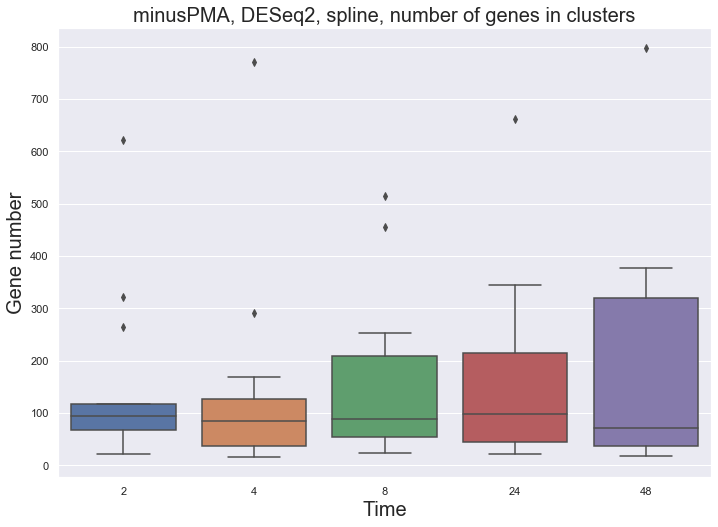

...

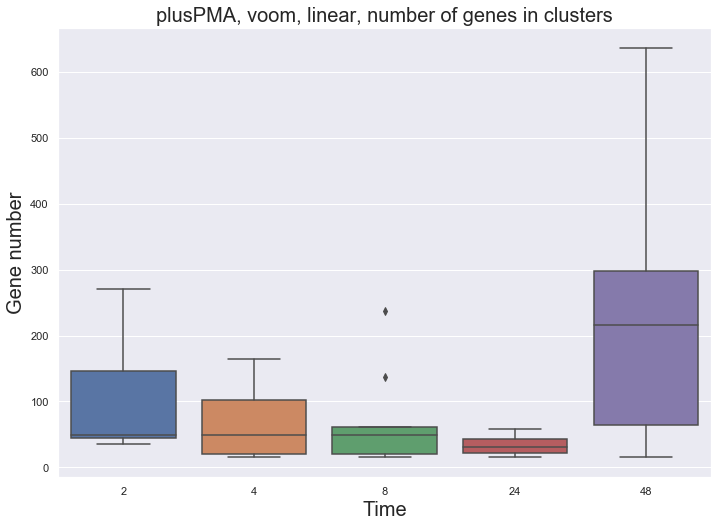

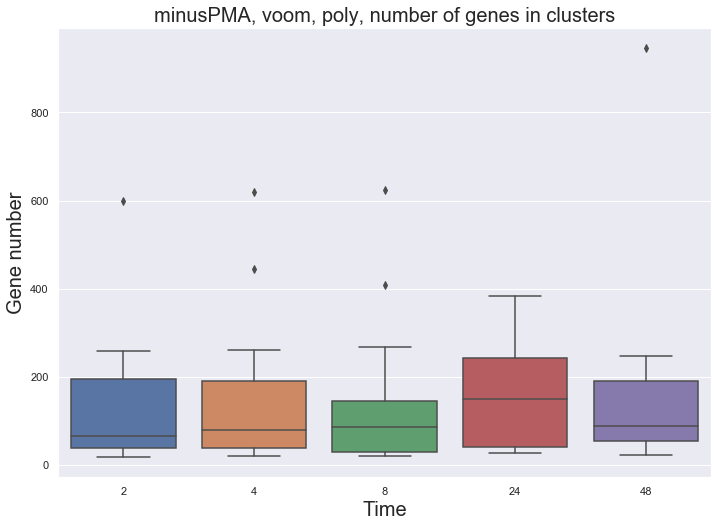

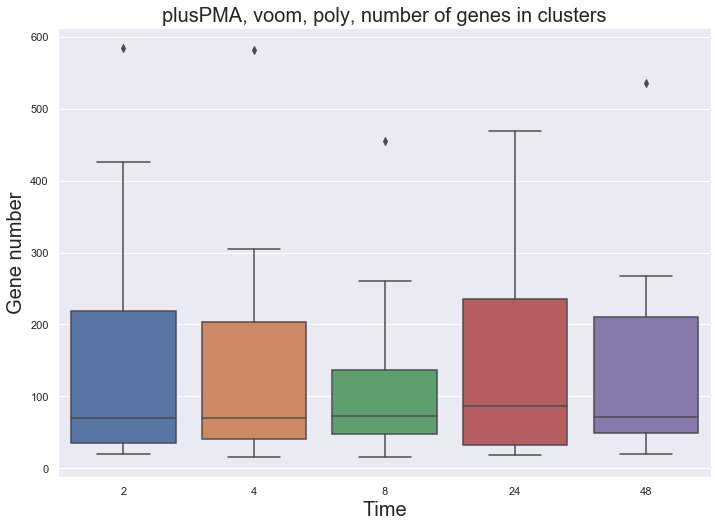

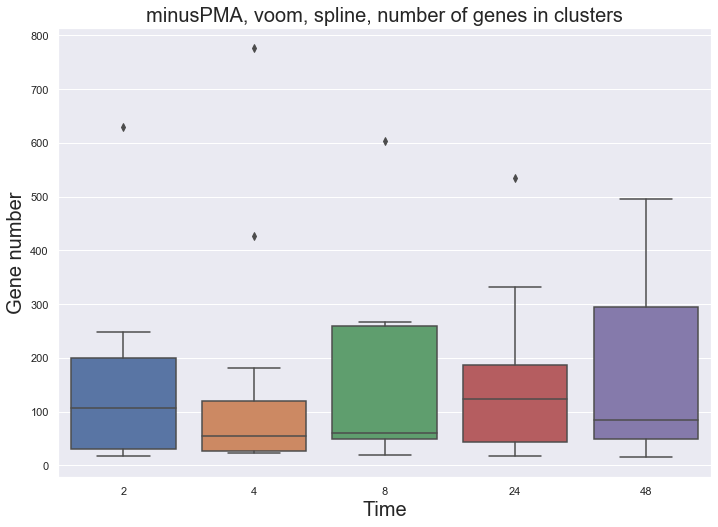

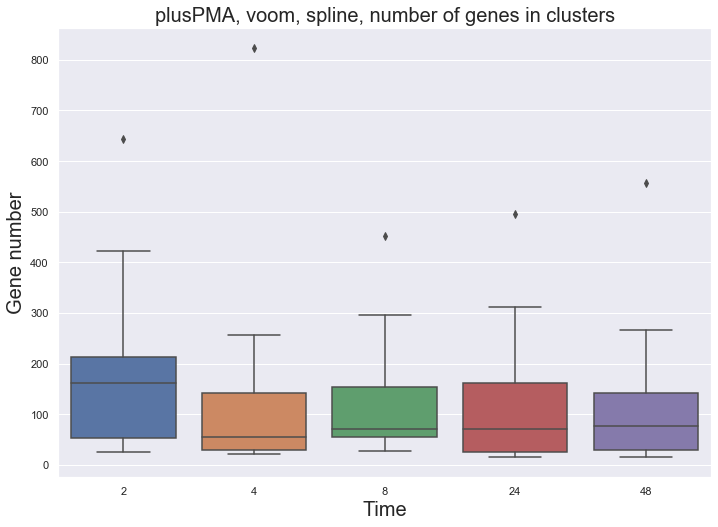

In [2]:
path = ""
output_path=""
methods = ['DESeq2', 'edgeR', 'voom']
pma_types = ['minus','plus']
regr_types = ['linear','poly','spline']
for method in methods:
    for regr_type in regr_types:
        for pma_type in pma_types:
            time_0 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_2_clusters_{regr_type}_2000.csv', sep = '\t')
            time_001 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_4_clusters_{regr_type}_2000.csv', sep = '\t')
            time_01 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_8_clusters_{regr_type}_2000.csv', sep = '\t')
            time_1 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_24_clusters_{regr_type}_2000.csv', sep = '\t')
            time_10 = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_48_clusters_{regr_type}_2000.csv', sep = '\t')

            df = pd.DataFrame(columns = ['concentration','geneNum'])
            for geneNum in time_0.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series([2,geneNum], index = df.columns), ignore_index=True)

            for geneNum in time_001.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series([4,geneNum], index = df.columns), ignore_index=True)

            for geneNum in time_01.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series([8,geneNum], index = df.columns), ignore_index=True)

            for geneNum in time_1.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series([24,geneNum], index = df.columns), ignore_index=True)

            for geneNum in time_10.groupby('cluster').count()['geneID']:
                df = df.append(pd.Series([48,geneNum], index = df.columns), ignore_index=True)

            seaborn.set(rc={'figure.figsize':(11.7,8.27)})
            plt.figure().clf()  

            ax = seaborn.boxplot(x="concentration", y="geneNum", data=df)
            ax.axes.set_title(f"{pma_type}PMA, {method}, {regr_type}, number of genes in clusters",fontsize=20)
            ax.set_xlabel("Time",fontsize=20)
            ax.set_ylabel("Gene number",fontsize=20)
            plt.savefig(f"{output_path}//{pma_type}PMA_{method}_{regr_type}_conc_cluster_gene_num_2000.png")


In [78]:
pma_type = "minus"
method = "DESeq2"
time_0 = pd.read_csv(f'{pma_type}PMA_{method}_time_0_clusters.csv', sep = '\t')
time_0 = time_0.set_index('geneID')
time_001 = pd.read_csv(f'{pma_type}PMA_{method}_time_001_clusters.csv', sep = '\t')
time_001 = time_001.set_index('geneID')

time_01 = pd.read_csv(f'{pma_type}PMA_{method}_time_0_clusters.csv', sep = '\t')
time_01 = time_01.set_index('geneID')

time_1 = pd.read_csv(f'{pma_type}PMA_{method}_time_1_clusters.csv', sep = '\t')
time_1 = time_1.set_index('geneID')

time_10 = pd.read_csv(f'{pma_type}PMA_{method}_time_10_clusters.csv', sep = '\t')
time_10 = time_10.set_index('geneID')

all_genes = set(time_0.index) | set(time_001.index) | set(time_01.index) | set(time_1.index) | set(time_10.index)
gene_stat = pd.DataFrame(columns = ['geneID','conc0','conc001','conc01','conc1','conc10'])
for gene in all_genes:
    if gene in time_0.index:
        time_0_cluster = time_0.loc[gene,][cluster]
    else:
        time_0_cluster = np.nan
    
    if gene in time_001.index:
        time_001_cluster = time_001.loc[gene,][cluster]
    else:
        time_001_cluster = np.nan
    
    if gene in time_01.index:
        time_01_cluster = time_01.loc[gene,][cluster]
    else:
        time_01_cluster = np.nan
    
    if gene in time_1.index:
        time_1_cluster = time_1.loc[gene,][cluster]
    else:
        time_1_cluster = np.nan
        
    if gene in time_10.index:
        time_10_cluster = time_10.loc[gene,][cluster]
    else:
        time_10_cluster = np.nan
        
    row = {'geneID':gene,
           'conc0':time_0_cluster,
           'conc001':time_001_cluster,
           'conc01':time_01_cluster,
           'conc1':time_1_cluster,
           'conc10':time_10_cluster}

    gene_stat = gene_stat.append(row,ignore_index=True)

gene_stat['to_sort']= gene_stat.isnull().sum(axis=1)
gene_stat = gene_stat.sort_values(by=['to_sort'])
gene_stat = gene_stat.drop('to_sort', 1)
gene_stat.to_csv(f'{pma_type}PMA_{method}_time_clusters_stat.csv', sep='\t')


In [ ]:
pma_type = "minus"
method = "DESeq2"

conc_2 = pd.read_csv(f'{pma_type}PMA_{method}_conc_2_clusters.csv', sep = '\t')
conc_2 = conc_2.set_index('geneID')

conc_4 = pd.read_csv(f'{pma_type}PMA_{method}_conc_4_clusters.csv', sep = '\t')
conc_4 = conc_4.set_index('geneID')

conc_8 = pd.read_csv(f'{pma_type}PMA_{method}_conc_8_clusters.csv', sep = '\t')
conc_8 = conc_8.set_index('geneID')

conc_24 = pd.read_csv(f'{pma_type}PMA_{method}_conc_24_clusters.csv', sep = '\t')
conc_24 = conc_24.set_index('geneID')

conc_48 = pd.read_csv(f'{pma_type}PMA_{method}_conc_48_clusters.csv', sep = '\t')
conc_48 = conc_48.set_index('geneID')

all_genes = set(conc_2['geneID']) | set(conc_4['geneID']) | set(conc_8['geneID']) | set(conc_24['geneID']) | set(conc_48['geneID'])
gene_stat = pd.DataFrame(columns = ['conc0','conc001','conc01','conc1','conc10'])
for gene in all_genes:
    if gene in time_0.index:
        time_0_cluster = time_0.loc[gene,][cluster]
    else:
        time_0_cluster = -1
    
    if gene in time_001.index:
        time_001_cluster = time_001.loc[gene,][cluster]
    else:
        time_001_cluster = -1
    
    if gene in time_01.index:
        time_01_cluster = time_01.loc[gene,][cluster]
    else:
        time_01_cluster = -1
    
    if gene in time_1.index:
        time_1_cluster = time_1.loc[gene,][cluster]
    else:
        time_1_cluster = -1
        
    if gene in time_10.index:
        time_10_cluster = time_10.loc[gene,][cluster]
    else:
        time_10_cluster = -1
    row = [time_0_cluster,time_001_cluster,time_01_cluster,time_1_cluster,time_10_cluster]
    gene_stat.append(row)
    
gene_stat.to_csv(f'{pma_type}PMA_{method}_time_clusters_stat.csv', sep='\t')

## Draw graphs (genes)

In [2]:
def compute_jaccard(user1_vals, user2_vals):
    intersection = user1_vals.intersection(user2_vals)
    union = user1_vals.union(user2_vals)
    jaccard = len(intersection)/float(len(union))
    return jaccard

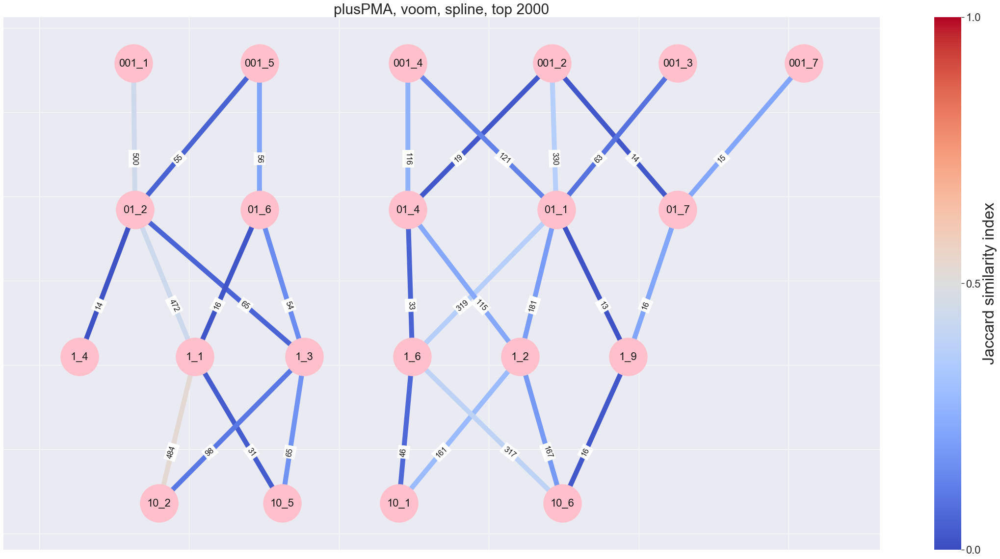

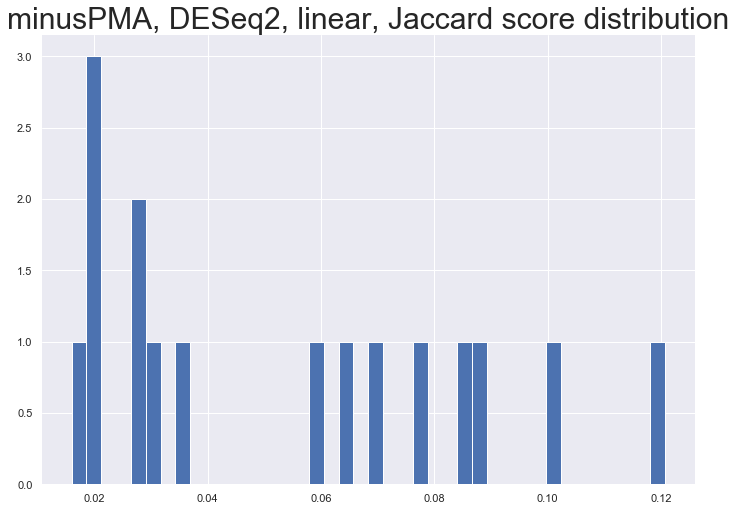

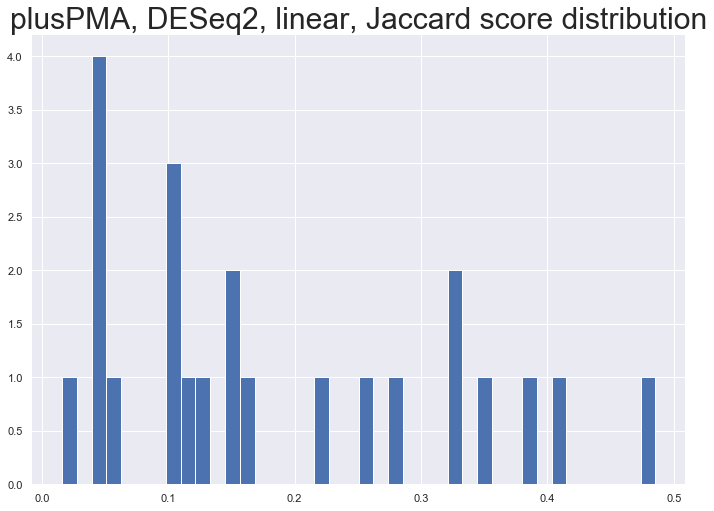

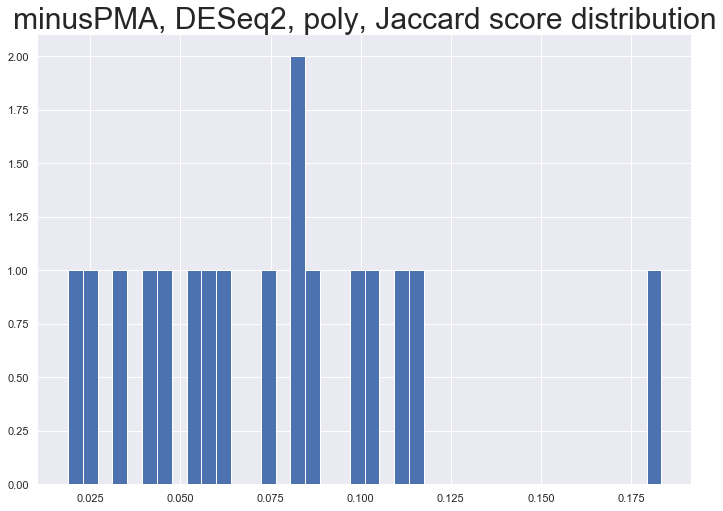

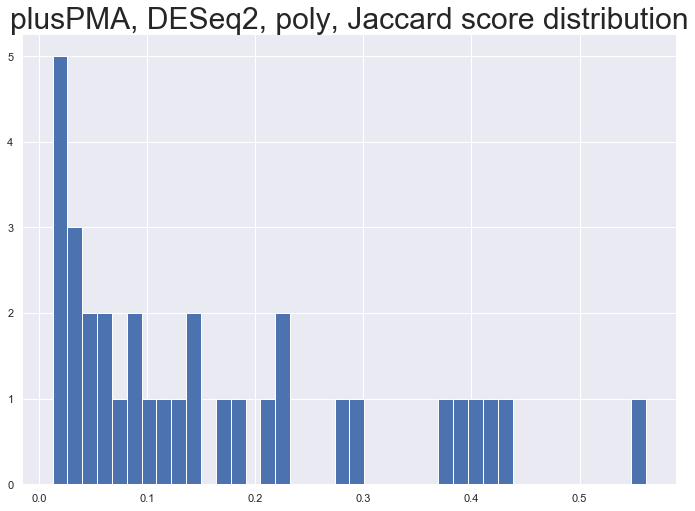

...

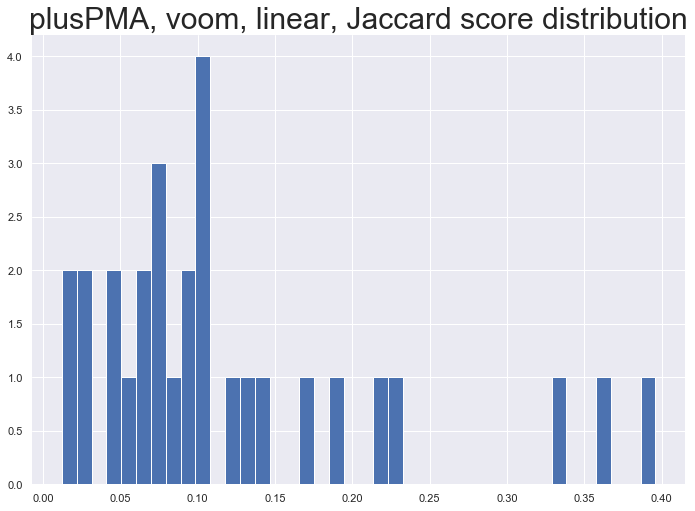

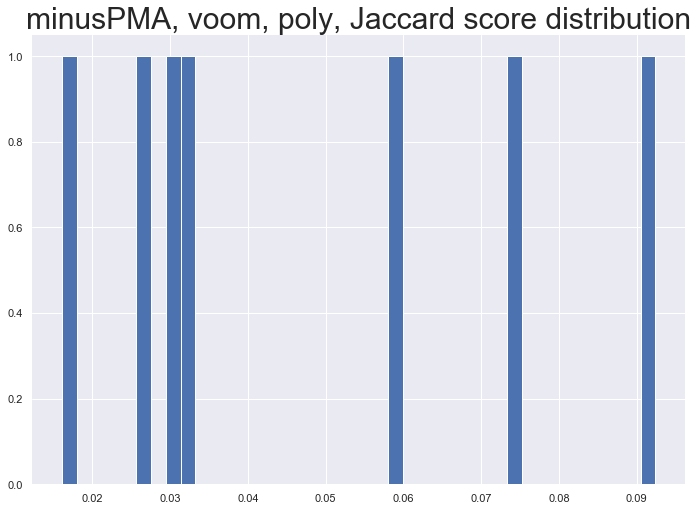

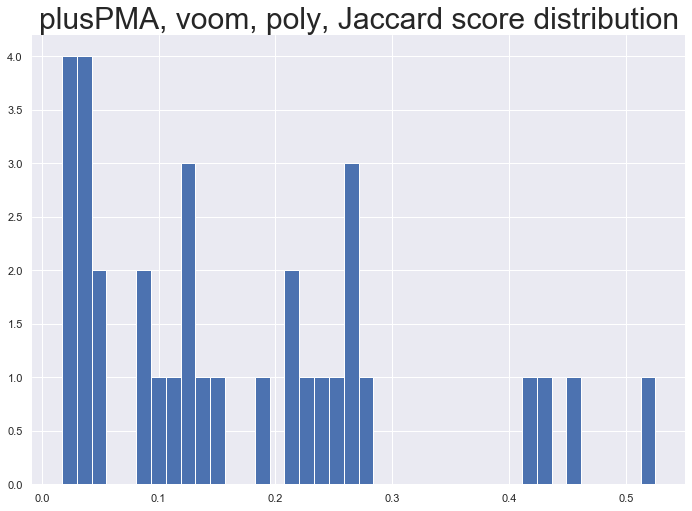

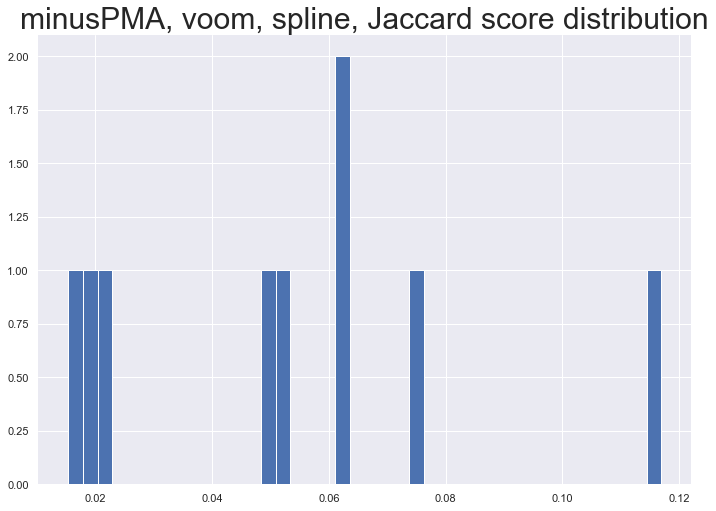

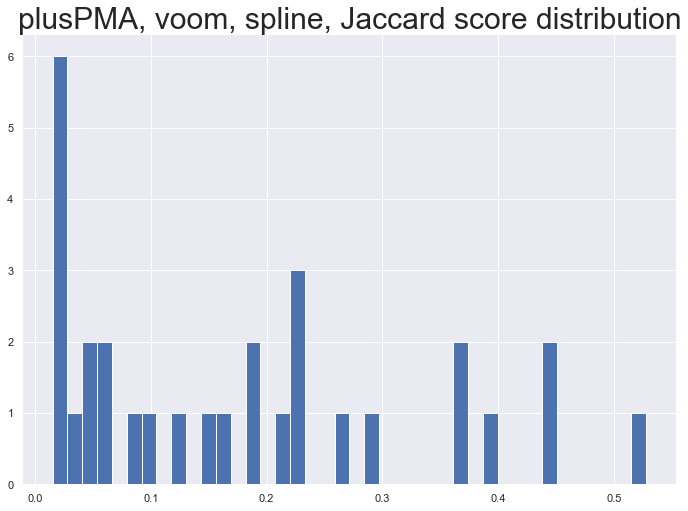

In [24]:
path = ""
output_path=""
output_path2 = ""

methods = ['DESeq2', 'edgeR', 'voom']
pma_types = ['minus','plus']
regr_types = ['linear','poly','spline']

import networkx as nx
from sklearn.metrics import jaccard_similarity_score

for method in methods:
    for regr_type in regr_types:
        for pma_type in pma_types:
            G = nx.DiGraph()
            concs = ["001","01","1","10"]
            graph = []
            weights = {}
            for i in range(len(concs))[1:]:
                prev_conc = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_{concs[i-1]}_clusters_{regr_type}_2000.csv', sep = '\t')
                current_conc = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_{concs[i]}_clusters_{regr_type}_2000.csv', sep = '\t')
                prev_conc_dict = {}
                for j,row in prev_conc.iterrows():
                    cluster = row['cluster']
                    if cluster not in prev_conc_dict:
                        prev_conc_dict[cluster] = []
                    prev_conc_dict[cluster].append(row['geneID'])
                current_conc_dict = {}
                for j,row in current_conc.iterrows():
                    cluster = row['cluster']
                    if cluster not in current_conc_dict:
                        current_conc_dict[cluster] = []   
                    current_conc_dict[cluster].append(row['geneID'])

                intersection_dict = {}
                intersection_len_dict = {}
                for prev_cluster in prev_conc_dict:
                    for current_cluster in current_conc_dict:
                        inter_cluster = str(prev_cluster)+"_"+str(current_cluster)
                        length = len(list(set(prev_conc_dict[prev_cluster]) & set(current_conc_dict[current_cluster])))
                        jaccard = compute_jaccard(set(prev_conc_dict[prev_cluster]), set(current_conc_dict[current_cluster]))
                        if length > 10:
                            intersection_dict[inter_cluster] = jaccard
                            intersection_len_dict[inter_cluster] = length
                            jaccard_str = f"{round(jaccard,2)}"
                            G.add_edge(f"{concs[i-1]}_{prev_cluster}", f"{concs[i]}_{current_cluster}", #weight=jaccard*100,
                                       label =f"{length}")
                            weights[(f"{concs[i-1]}_{prev_cluster}", f"{concs[i]}_{current_cluster}")] = jaccard
            #https://networkx.org/documentation/stable/auto_examples/drawing/plot_labels_and_colors.html
            import matplotlib as mpl
            if weights == {}:
                continue
            plt.figure(5,figsize=(40,20),facecolor='white').clf()

            from networkx.drawing.nx_agraph import write_dot
            from networkx.drawing.nx_pydot import graphviz_layout

            pos = graphviz_layout(G, prog="dot")

            nx.draw_networkx_nodes(G, pos,  node_color="pink", node_size = 6000, fontsize=30)
            nx.draw_networkx_labels(G, pos, font_size=22)

            edges,ws = zip(*weights.items())

            # colormap
            cmap = plt.cm.coolwarm

            nx.draw_networkx_edges(G, pos, edgelist=edges, width=10.0, edge_cmap=cmap, edge_vmin = 0 ,edge_vmax = 1, edge_color=ws, arrows=True)
            labels = nx.get_edge_attributes(G,'label')

            nx.draw_networkx_edge_labels(G,pos,label_pos=0.35,edge_labels=labels, font_size=16, horizontalalignment="center", 
                                         verticalalignment="center",bbox= dict(alpha=1, color = 'w'))
            from matplotlib.pyplot import figure


            # Normalizer
            norm = mpl.colors.Normalize(vmin=0, vmax=1)

            # creating ScalarMappable
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])

            cb = plt.colorbar(sm, ticks=[0,0.5,1])
            cb.set_label(label="Jaccard similarity index", size=32)
            cb.ax.tick_params(labelsize=22)

            plt.title(f"{pma_type}PMA, {method}, {regr_type}, top 2000", fontsize=30)
            plt.savefig(f"{output_path}//{pma_type}PMA_{method}_{regr_type}_conc_const_2000.png",bbox_inches='tight')

            plt.figure().clf()
            plt.hist(ws, bins=40)  # density=False would make counts
            plt.title(f"{pma_type}PMA, {method}, {regr_type}, Jaccard score distribution", fontsize=30)
            plt.savefig(f"{output_path2}//{pma_type}PMA_{method}_{regr_type}_conc_distribution_2000.png",bbox_inches='tight')


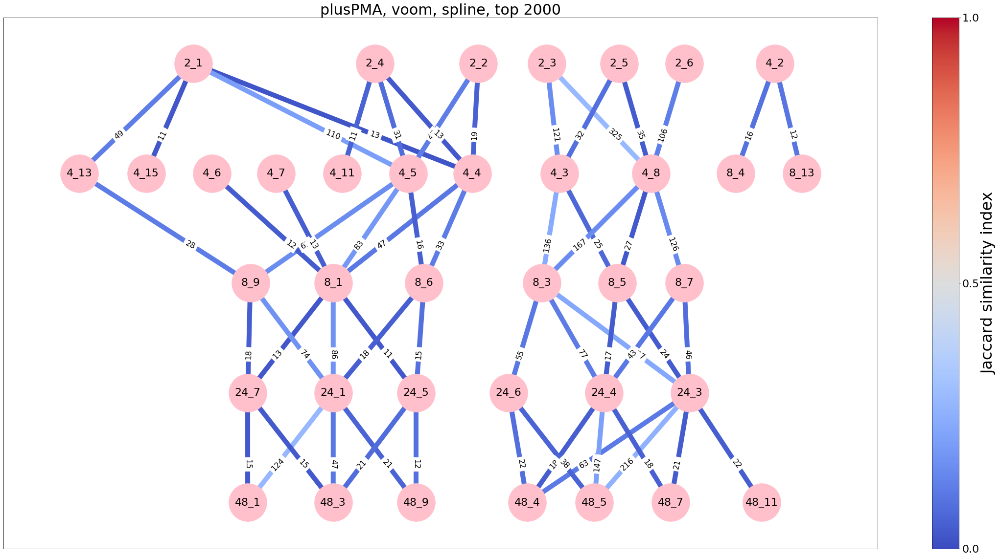

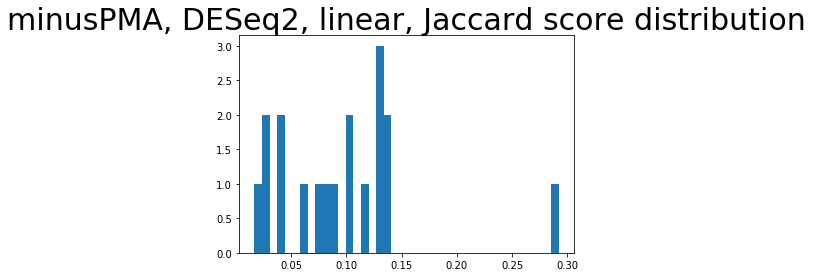

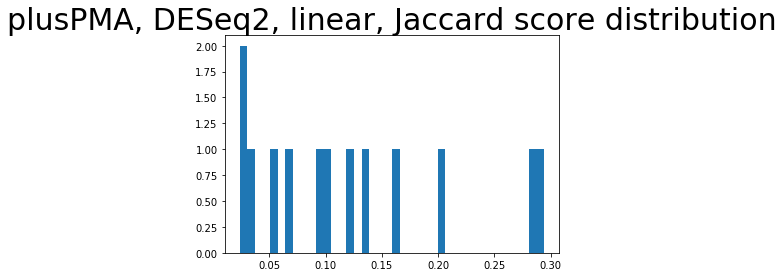

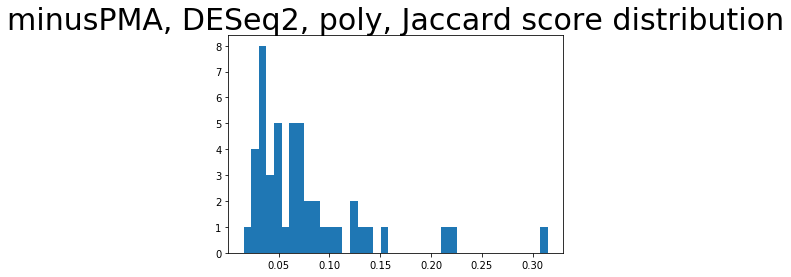

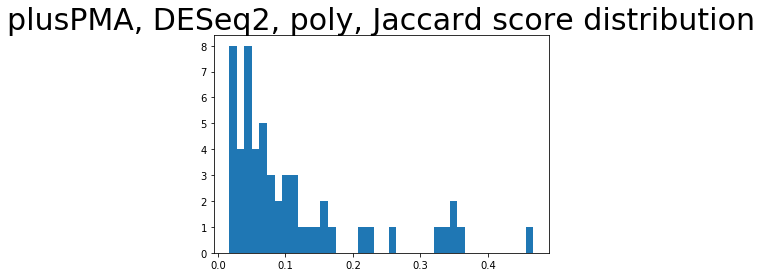

...

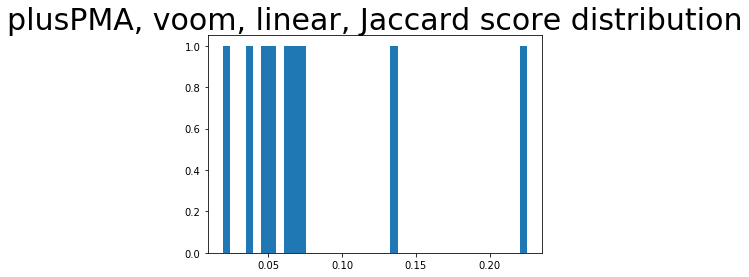

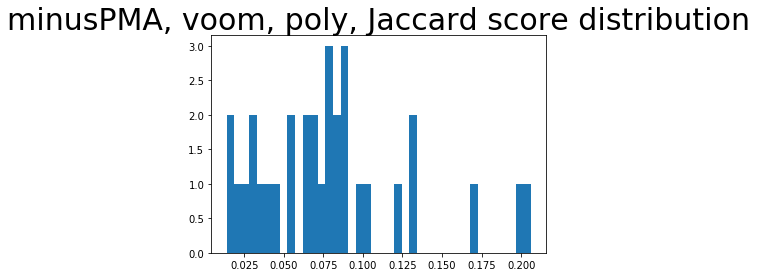

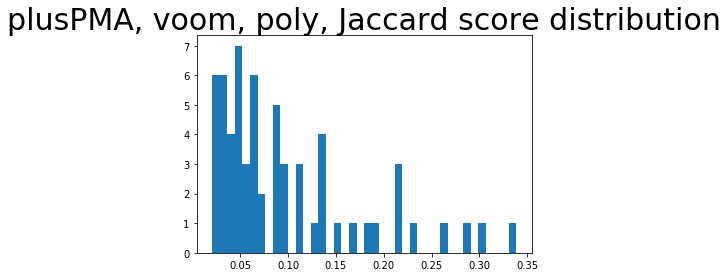

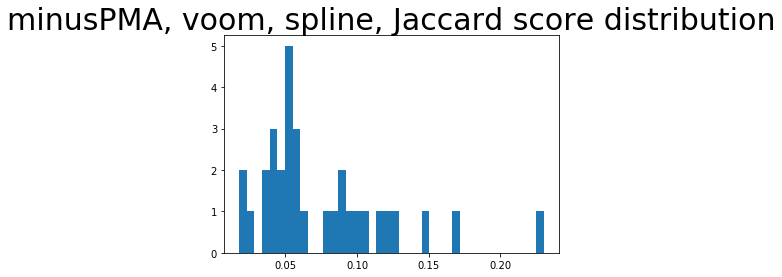

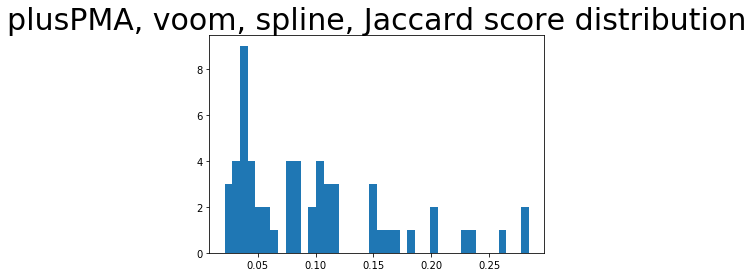

In [223]:
path = ""
output_path=""
output_path2 = ""

methods = ['DESeq2', 'edgeR', 'voom']
pma_types = ['minus','plus']
regr_types = ['linear','poly','spline']

import networkx as nx
from sklearn.metrics import jaccard_similarity_score

for method in methods:
    for regr_type in regr_types:
        for pma_type in pma_types:
            G = nx.DiGraph()
            concs = ["2","4","8","24","48"]
            graph = []
            weights = {}
            for i in range(len(concs))[1:]:
                prev_conc = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_{concs[i-1]}_clusters_{regr_type}_2000.csv', sep = '\t')
                current_conc = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_{concs[i]}_clusters_{regr_type}_2000.csv', sep = '\t')
                prev_conc_dict = {}
                for j,row in prev_conc.iterrows():
                    cluster = row['cluster']
                    if cluster not in prev_conc_dict:
                        prev_conc_dict[cluster] = []
                    prev_conc_dict[cluster].append(row['geneID'])
                current_conc_dict = {}
                for j,row in current_conc.iterrows():
                    cluster = row['cluster']
                    if cluster not in current_conc_dict:
                        current_conc_dict[cluster] = []   
                    current_conc_dict[cluster].append(row['geneID'])

                intersection_dict = {}
                intersection_len_dict = {}
                for prev_cluster in prev_conc_dict:
                    for current_cluster in current_conc_dict:
                        inter_cluster = str(prev_cluster)+"_"+str(current_cluster)
                        length = len(list(set(prev_conc_dict[prev_cluster]) & set(current_conc_dict[current_cluster])))
                        jaccard = compute_jaccard(set(prev_conc_dict[prev_cluster]), set(current_conc_dict[current_cluster]))
                        if length > 10:
                            intersection_dict[inter_cluster] = jaccard
                            intersection_len_dict[inter_cluster] = length
                            jaccard_str = f"{round(jaccard,2)}"
                            G.add_edge(f"{concs[i-1]}_{prev_cluster}", f"{concs[i]}_{current_cluster}", #weight=jaccard*100,
                                       label =f"{length}")
                            weights[(f"{concs[i-1]}_{prev_cluster}", f"{concs[i]}_{current_cluster}")] = jaccard
            #https://networkx.org/documentation/stable/auto_examples/drawing/plot_labels_and_colors.html
            import matplotlib as mpl
            if weights == {}:
                continue
            plt.figure(5,figsize=(40,20),facecolor='white').clf()

            from networkx.drawing.nx_agraph import write_dot
            from networkx.drawing.nx_pydot import graphviz_layout

            pos = graphviz_layout(G, prog="dot")

            nx.draw_networkx_nodes(G, pos,  node_color="pink", node_size = 6000, fontsize=30)
            nx.draw_networkx_labels(G, pos, font_size=22)

            edges,ws = zip(*weights.items())

            # colormap
            cmap = plt.cm.coolwarm

            nx.draw_networkx_edges(G, pos, edgelist=edges, width=10.0, edge_cmap=cmap, edge_vmin = 0 ,edge_vmax = 1, edge_color=ws, arrows=True)
            labels = nx.get_edge_attributes(G,'label')

            nx.draw_networkx_edge_labels(G,pos,label_pos=0.35,edge_labels=labels, font_size=16, horizontalalignment="center", 
                                         verticalalignment="center",bbox= dict(alpha=1, color = 'w'))
            from matplotlib.pyplot import figure


            # Normalizer
            norm = mpl.colors.Normalize(vmin=0, vmax=1)

            # creating ScalarMappable
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
            sm.set_array([])

            cb = plt.colorbar(sm, ticks=[0,0.5,1])
            cb.set_label(label="Jaccard similarity index", size=32)
            cb.ax.tick_params(labelsize=22)

            plt.title(f"{pma_type}PMA, {method}, {regr_type}, top 2000", fontsize=30)
            plt.savefig(f"{output_path}//{pma_type}PMA_{method}_{regr_type}_conc_time_2000.png",bbox_inches='tight')
            plt.figure().clf()
            plt.hist(ws, bins=40)  # density=False would make counts
            plt.title(f"{pma_type}PMA, {method}, {regr_type}, Jaccard score distribution", fontsize=30)
            plt.savefig(f"{output_path2}//{pma_type}PMA_{method}_{regr_type}_time_distribution_2000.png",bbox_inches='tight')


## Draw graphs (pathes)

In [3]:
def connected_components(neighbors):
    seen = set()
    def component(node):
        nodes = set([node])
        while nodes:
            node = nodes.pop()
            seen.add(node)
            nodes |= neighbors[node] - seen
            yield node
    for node in neighbors:
        if node not in seen:
            yield component(node)

In [18]:
BgRatio = {}

C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:110: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


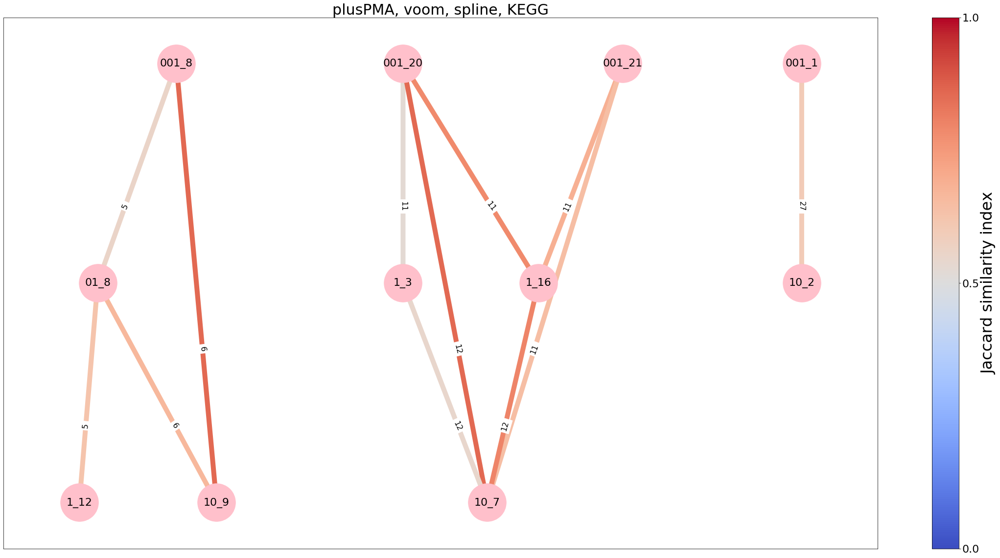

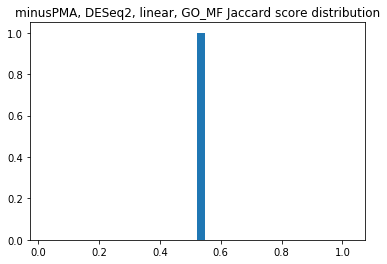

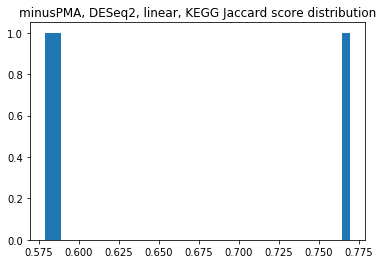

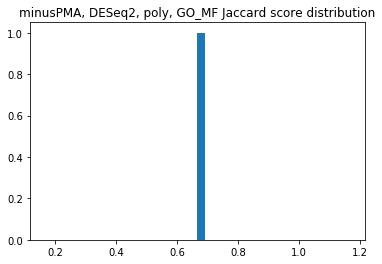

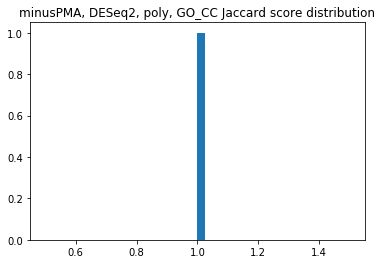

...

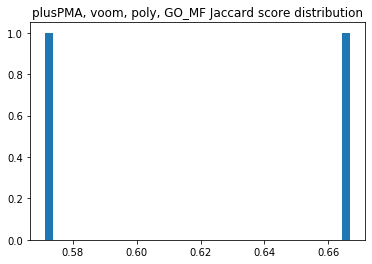

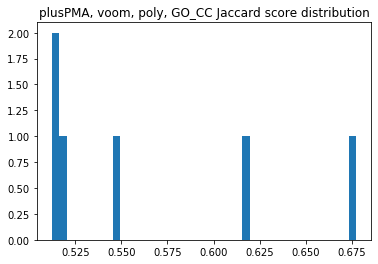

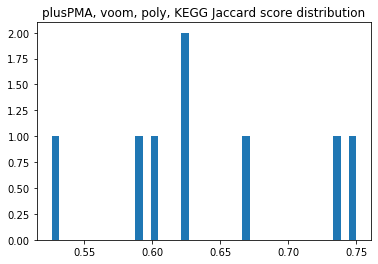

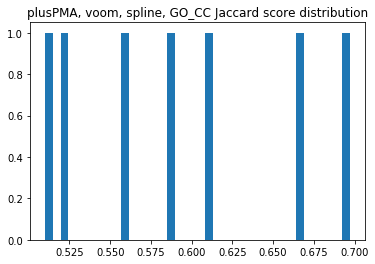

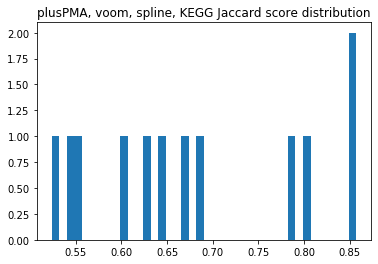

In [19]:
path = ""
path_path = ""
output_path=""
output_path2 = ""
methods = ['DESeq2', 'edgeR', 'voom']
pma_types = ['minus','plus']
regr_types = ['linear','poly','spline']
enr_types = ['GO_BP', 'GO_MF', 'GO_CC', 'KEGG']
components_dict_conc = {}
import networkx as nx
for method in methods:
    for pma_type in pma_types:
        for regr_type in regr_types:
            for enr_type in enr_types:
                G = nx.DiGraph()

                concs = ["001","01","1","10"]
                weights = {}
                for i in range(len(concs))[1:]:
                    current_conc = concs[i]
                    prev_concs = concs[:i]
                    if not prev_concs:
                        continue
                    for prev_conc in prev_concs:
                        prev_conc_df = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_{prev_conc}_clusters_{regr_type}.csv', sep = '\t')
                        current_conc_df = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_{current_conc}_clusters_{regr_type}.csv', sep = '\t')
                        prev_cluster = set(prev_conc_df['cluster'])
                        current_cluster = set(current_conc_df['cluster'])
                        prev_conc_dict = {}
                        for cluster in prev_cluster:
                            go_bp = pd.read_csv(f"{path_path}//{pma_type}PMA_{method}_time_{prev_conc}_cluster{cluster}_{enr_type}_{regr_type}.csv",sep = '\t')
                            for jj, row in go_bp.iterrows():
                                BgRatio[row['Description']] = row['BgRatio'].split('/')[0]
                            prev_conc_dict[cluster] = set(go_bp['ID'])

                        current_conc_dict = {}
                        for cluster in current_cluster:
                            go_bp = pd.read_csv(f"{path_path}//{pma_type}PMA_{method}_time_{current_conc}_cluster{cluster}_{enr_type}_{regr_type}.csv",sep = '\t')
                            for jj, row in go_bp.iterrows():
                                BgRatio[row['Description']] = row['BgRatio'].split('/')[0]
                            current_conc_dict[cluster] = set(go_bp['ID'])

                        intersection_dict = {}
                        intersection_len_dict = {}
                        for prev_cluster in prev_conc_dict:
                            for current_cluster in current_conc_dict:
                                length = len(list(set(prev_conc_dict[prev_cluster]) & set(current_conc_dict[current_cluster])))
                                if length > 2:
                                    inter_cluster = str(prev_cluster)+"_"+str(current_cluster)
                                    jaccard = compute_jaccard(set(prev_conc_dict[prev_cluster]), set(current_conc_dict[current_cluster]))
                                    if jaccard > 0.5:
                                        intersection_dict[inter_cluster] = jaccard
                                        intersection_len_dict[inter_cluster] = length
                                        jaccard_str = f"{round(jaccard,2)}"
                                        G.add_edge(f"{prev_conc}_{prev_cluster}", f"{current_conc}_{current_cluster}", label =f"{length}")
                                        weights[(f"{prev_conc}_{prev_cluster}", f"{concs[i]}_{current_cluster}")] = jaccard
                        #https://networkx.org/documentation/stable/auto_examples/drawing/plot_labels_and_colors.html
                if weights == {}:
                    continue
                    
                import matplotlib as mpl
                plt.figure(5,figsize=(40,20),facecolor='white').clf()  

                from networkx.drawing.nx_agraph import write_dot
                from networkx.drawing.nx_pydot import graphviz_layout

                pos = graphviz_layout(G, prog="dot")

                nx.draw_networkx_nodes(G, pos,  node_color="pink", node_size = 6000, fontsize=30)
                nx.draw_networkx_labels(G, pos, font_size=22)

                edges,ws = zip(*weights.items())

                #print(edges)
                # colormap
                cmap = plt.cm.coolwarm

                nx.draw_networkx_edges(G,
                                       pos,
                                       edgelist=edges,
                                       width=10.0,
                                       edge_cmap=cmap,
                                       edge_vmin = 0 ,
                                       edge_vmax = 1,
                                       edge_color=ws,
                                       arrows=True)

                labels = nx.get_edge_attributes(G,'label')

                nx.draw_networkx_edge_labels(G,pos,label_pos=0.35,edge_labels=labels, font_size=16, horizontalalignment="center", 
                                             verticalalignment="center",bbox= dict(alpha=1, color = 'w'))
                from matplotlib.pyplot import figure


                # Normalizer
                norm = mpl.colors.Normalize(vmin=0, vmax=1)

                # creating ScalarMappable
                sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
                sm.set_array([])

                cb = plt.colorbar(sm, ticks=[0,0.5,1])
                cb.set_label(label="Jaccard similarity index", size=32)
                cb.ax.tick_params(labelsize=22)

                plt.title(f"{pma_type}PMA, {method}, {regr_type}, {enr_type}", fontsize=30)
                plt.savefig(f"{output_path}//{pma_type}PMA_{method}_{regr_type}_const_conc_{enr_type}.png",bbox_inches='tight')
                plt.figure().clf()
                plt.hist(ws, bins=40)  # density=False would make counts
                plt.title(f"{pma_type}PMA, {method}, {regr_type}, {enr_type} Jaccard score distribution")
                plt.savefig(f"{output_path2}//{pma_type}PMA_{method}_{regr_type}_{enr_type}_const_conc_distribution.png",bbox_inches='tight')
                edges = set(G.edges)
                graph = {}

                for v1, v2 in edges:
                    if v1 not in graph:
                        graph[v1] = set()
                    graph[v1].add(v2)
                    if v2 not in graph:
                        graph[v2] = set()
                    graph[v2].add(v1)
                components = []
                for component in connected_components(graph):
                    c = set(component)
                    components.append([edge for edge in edges
                                            if c.intersection(edge)])
                    
                components_dict_conc[f'{pma_type}PMA-{method}-{regr_type}-{enr_type}'] = components
                
components_dict_filtered_const_conc = {}
for cond in components_dict_conc:
    for component in components_dict_conc[cond]:
        nodes_set = set()
        for edge in component:
            nodes_set.add(edge[0].split('_')[0])
            nodes_set.add(edge[1].split('_')[0])
        if len(nodes_set) > 2:
            if cond not in components_dict_filtered_const_conc:
                components_dict_filtered_const_conc[cond] = []
            components_dict_filtered_const_conc[cond].append(component)


In [20]:
plus_conc_const_GO_BP = set()
minus_conc_const_GO_BP = set()

plus_conc_const_GO_MF = set() 
minus_conc_const_GO_MF = set()

plus_conc_const_GO_KEGG1 = set()
plus_conc_const_GO_KEGG2 = set()

minus_conc_const_GO_KEGG = set()
plus_conc_const_GO_CC = set()

name = 'minusPMA-edgeR-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')


name = 'minusPMA-DESeq2-linear-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')


name = 'minusPMA-DESeq2-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')


name = 'minusPMA-DESeq2-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

    
name = 'plusPMA-edgeR-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')


name = 'plusPMA-edgeR-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-voom-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')


name = 'plusPMA-voom-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-edgeR-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')


name = 'plusPMA-edgeR-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-DESeq2-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-DESeq2-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-voom-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-DESeq2-linear-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-voom-linear-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
C:\Users\Anna\anaconda3\lib\site-packages\venn\_venn.py:83: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  _, ax = subplots(nrows=1, ncols=1, figsize=figsize)


<Figure size 432x288 with 0 Axes>

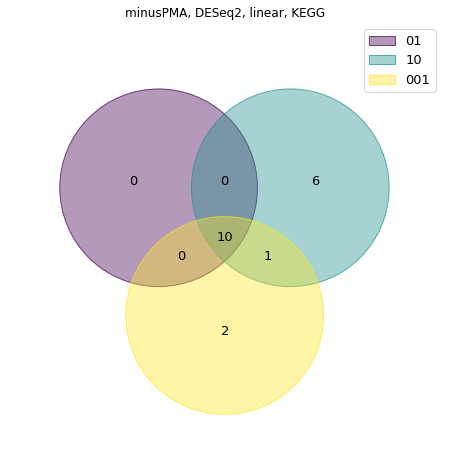

<Figure size 432x288 with 0 Axes>

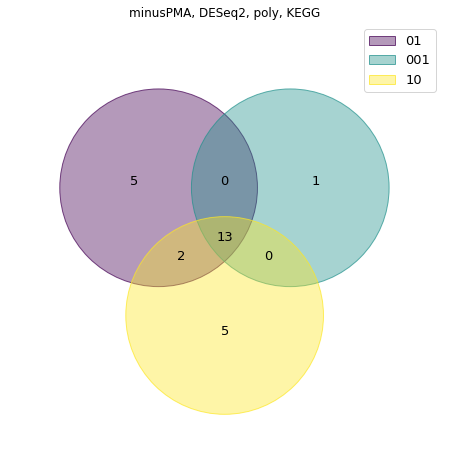

<Figure size 432x288 with 0 Axes>

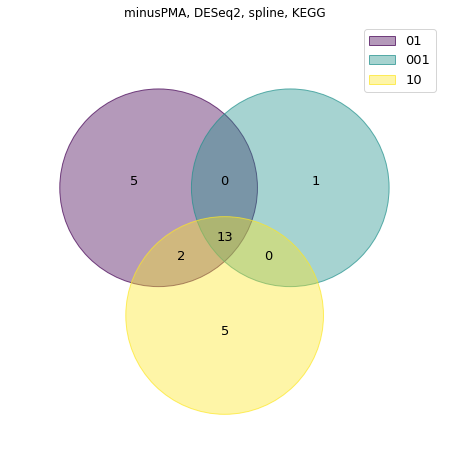

<Figure size 432x288 with 0 Axes>

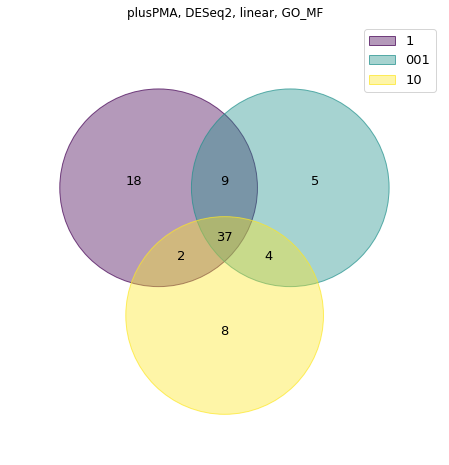

<Figure size 432x288 with 0 Axes>

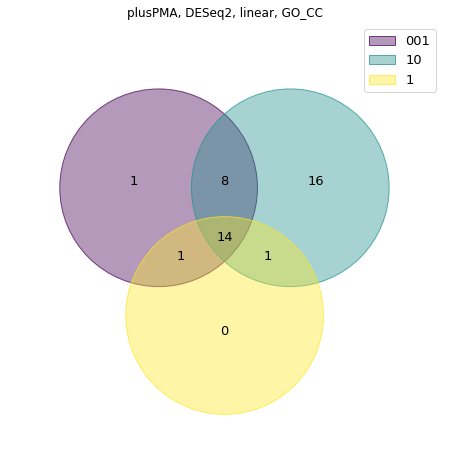

<Figure size 432x288 with 0 Axes>

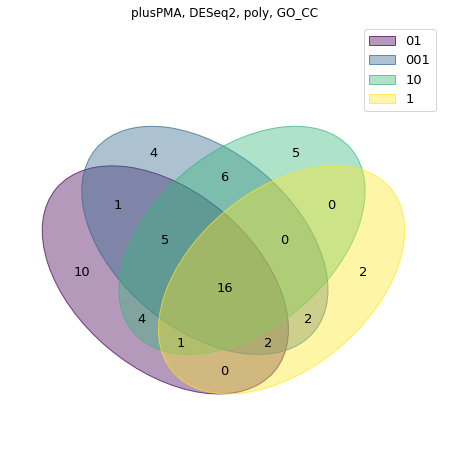

<Figure size 432x288 with 0 Axes>

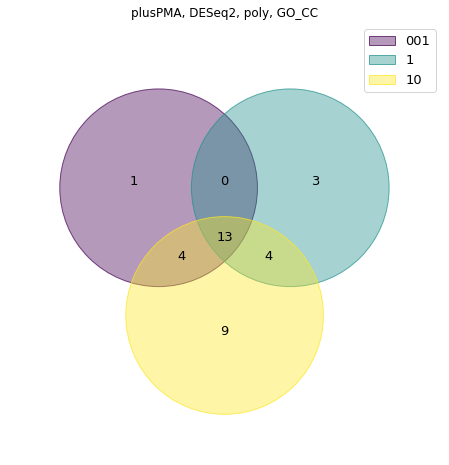

<Figure size 432x288 with 0 Axes>

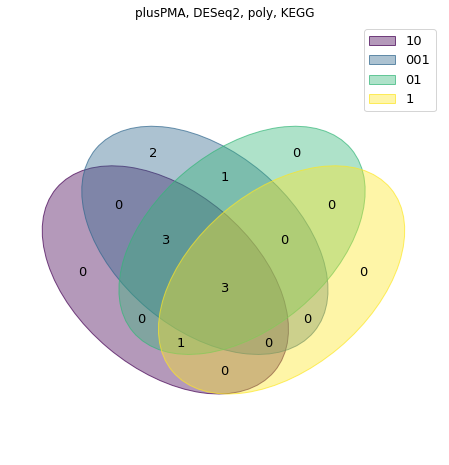

<Figure size 432x288 with 0 Axes>

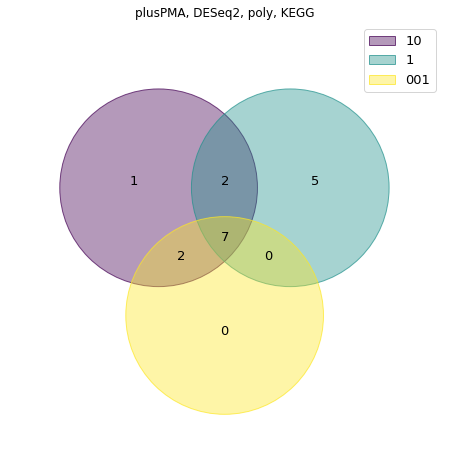

<Figure size 432x288 with 0 Axes>

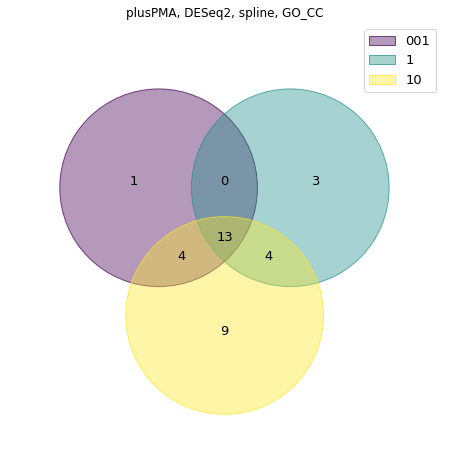

<Figure size 432x288 with 0 Axes>

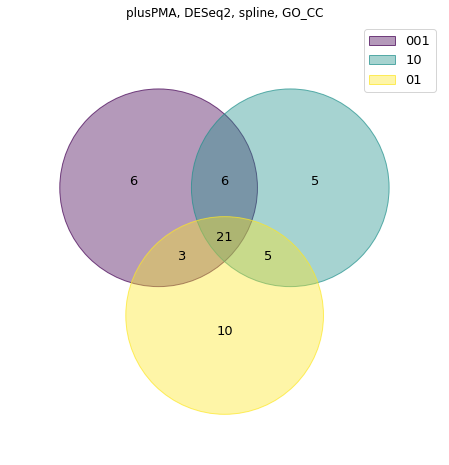

<Figure size 432x288 with 0 Axes>

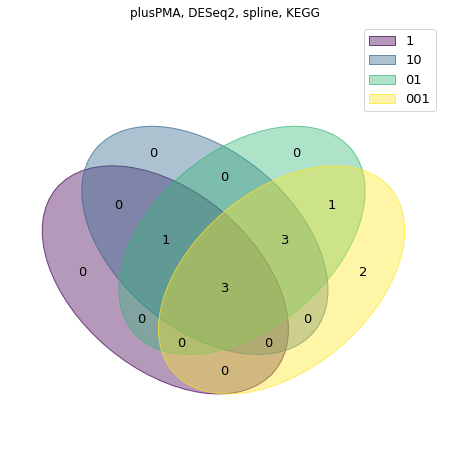

<Figure size 432x288 with 0 Axes>

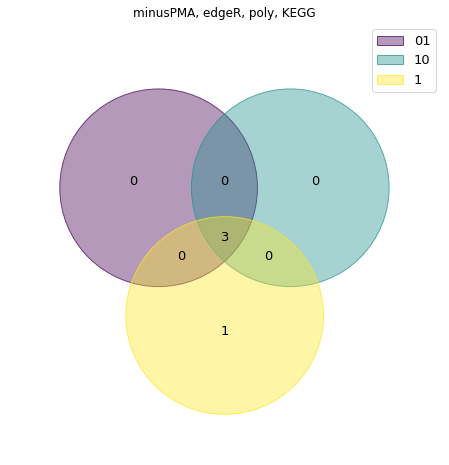

<Figure size 432x288 with 0 Axes>

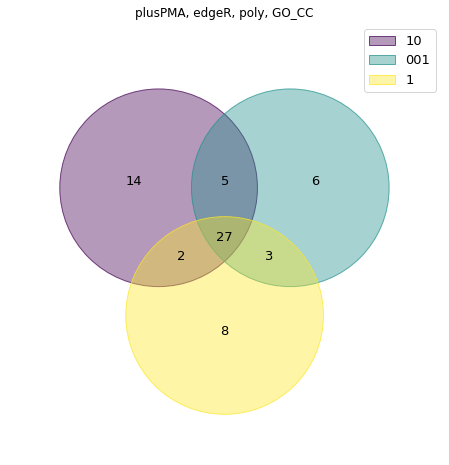

<Figure size 432x288 with 0 Axes>

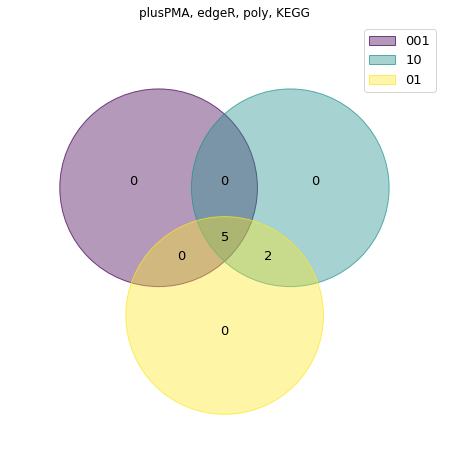

<Figure size 432x288 with 0 Axes>

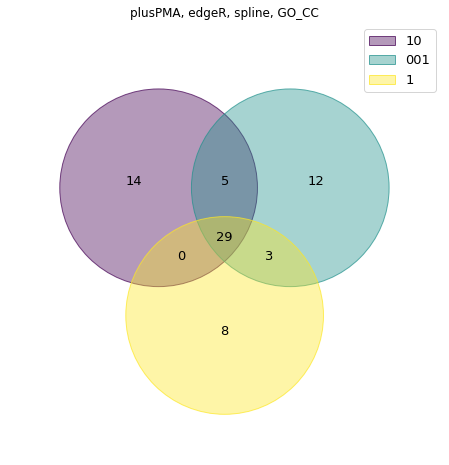

<Figure size 432x288 with 0 Axes>

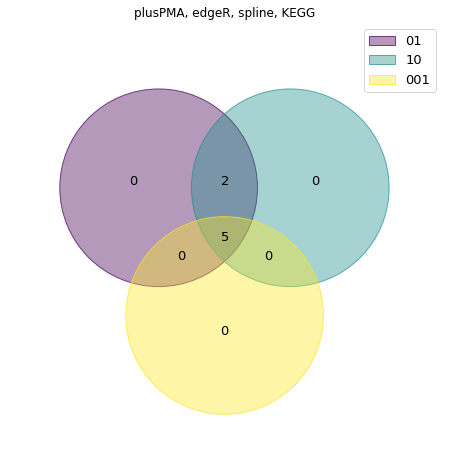

<Figure size 432x288 with 0 Axes>

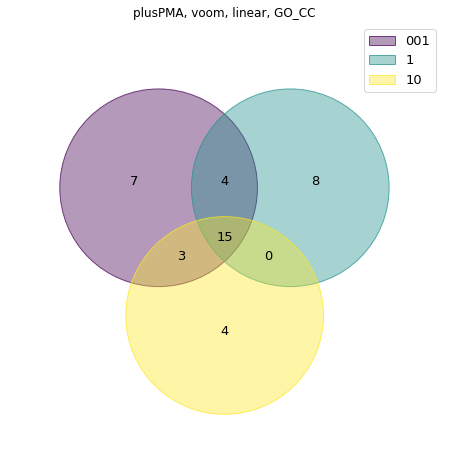

<Figure size 432x288 with 0 Axes>

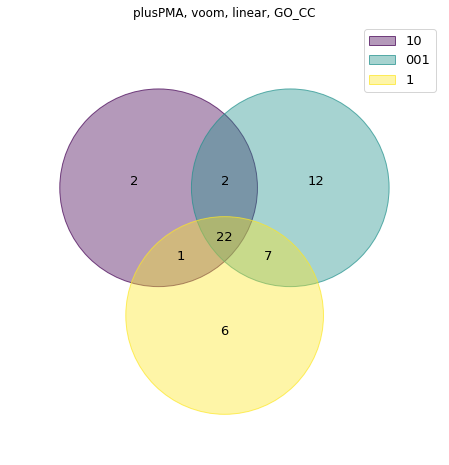

<Figure size 432x288 with 0 Axes>

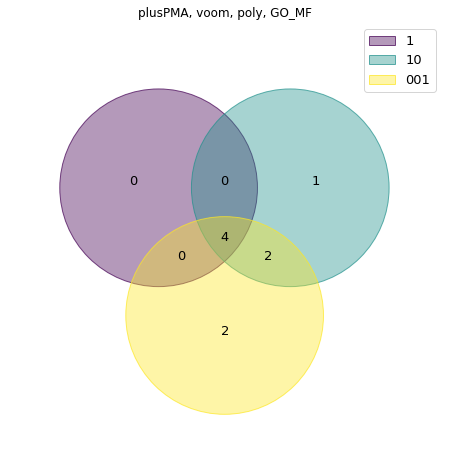

<Figure size 432x288 with 0 Axes>

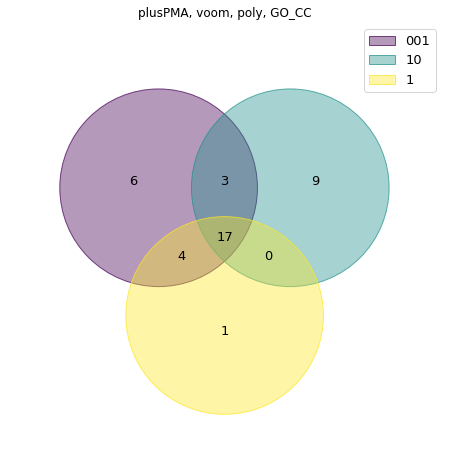

<Figure size 432x288 with 0 Axes>

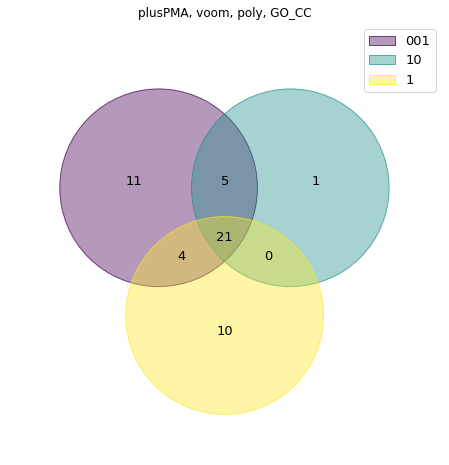

<Figure size 432x288 with 0 Axes>

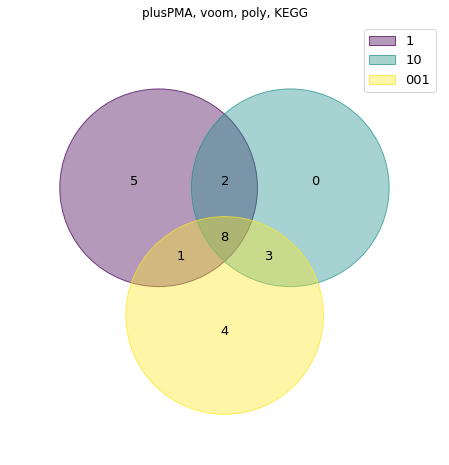

<Figure size 432x288 with 0 Axes>

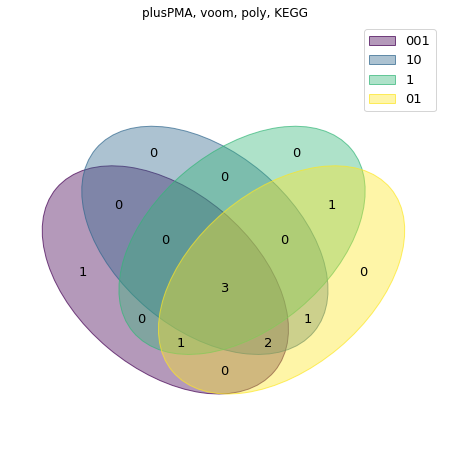

<Figure size 432x288 with 0 Axes>

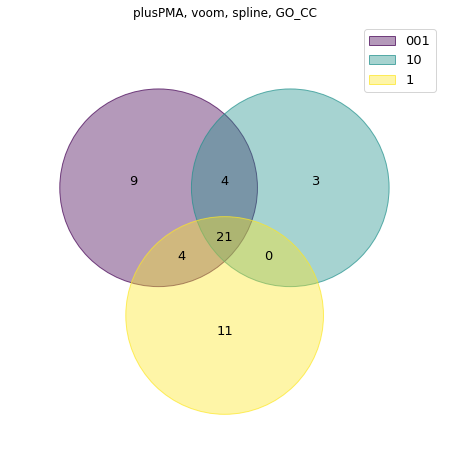

<Figure size 432x288 with 0 Axes>

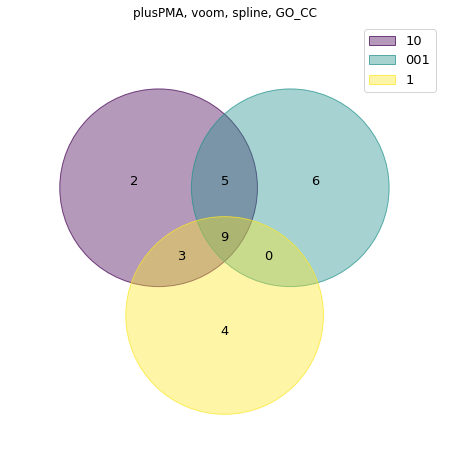

<Figure size 432x288 with 0 Axes>

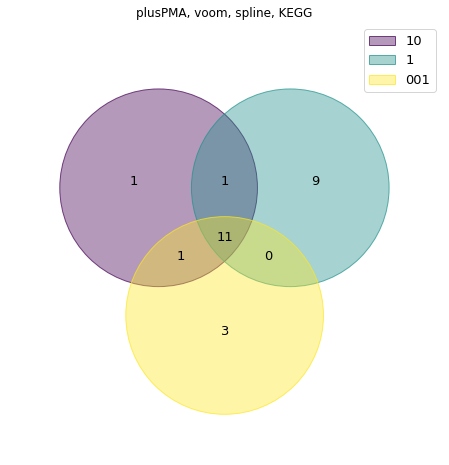

<Figure size 432x288 with 0 Axes>

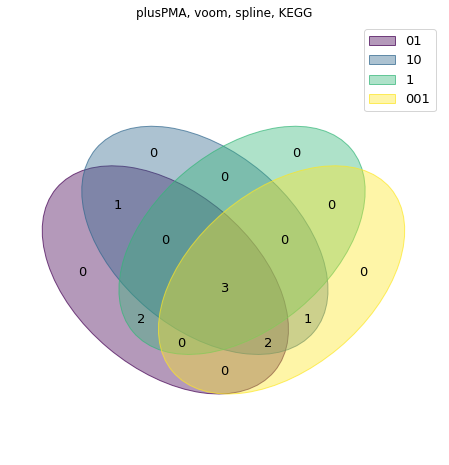

In [22]:
freq_const_conc = {}
freq_const_conc['GO_BP']={}
freq_const_conc['GO_MF']={}
freq_const_conc['GO_CC']={}
freq_const_conc['KEGG']={}
minus_freq_const_conc = {}
minus_freq_const_conc['GO_BP']={}
minus_freq_const_conc['GO_MF']={}
minus_freq_const_conc['GO_CC']={}
minus_freq_const_conc['KEGG']={}
plus_freq_const_conc = {}
plus_freq_const_conc['GO_BP']={}
plus_freq_const_conc['GO_MF']={}
plus_freq_const_conc['GO_CC']={}
plus_freq_const_conc['KEGG']={}
path = ""
output_path = ""
component_content = {}
for cond in components_dict_filtered_const_conc:
    pma_type, method, regr_type, go_type = cond.split('-')
    for i,component in enumerate(components_dict_filtered_const_conc[cond]):
        id_genes_stat = {'cond':[], 'cluster':[], 'path_id':[], 'path':[], 'genes':[]}
        nodes = set()
        descriptions = []
        ids = []
        results = {}
        for edge in component:
            nodes.add(edge[0])
            nodes.add(edge[1])
        for node in nodes:
            cond, cluster = node.split('_')
            table = pd.read_csv(f"{path}\\{pma_type}_{method}_time_{cond}_cluster{cluster}_{go_type}_{regr_type}.csv", sep = '\t')
            for y,row in table.iterrows():
                id_genes_stat['cond'].append(cond)
                id_genes_stat['cluster'].append(cluster)
                id_genes_stat['path_id'].append(row['ID'])
                id_genes_stat['path'].append(row['Description'])
                id_genes_stat['genes'].append(row['geneID'])
            if cond not in results:
                results[cond] = set()
            results[cond].update(set(table['ID']))
            descriptions.append(set(table['Description']))
        plt.figure(facecolor='white').clf() #figsize=(20,20),
        inter = set.union(*descriptions)
        venn(results)
        plt.title(f"{pma_type}, {method}, {regr_type}, {go_type}")
        plt.savefig(f'{output_path}\\{pma_type}_{method}_const_conc_{regr_type}_{go_type}_{i}_venn.png')
        pd.DataFrame(inter).to_csv(f'{output_path}\\{pma_type}_{method}_const_conc_{regr_type}_{go_type}_{i}.csv',
                                   header = False,
                                   index = False)
        pd.DataFrame(id_genes_stat).to_csv(f'{output_path}\\{pma_type}_{method}_const_conc_{regr_type}_{go_type}_{i}_id_genes_stat.csv',
                                   sep = '\t',
                                   header = True,
                                   index = False)        
        component_content[f'{pma_type}_{method}_{regr_type}_{go_type}_{i}'] = inter
        for p in inter:
            if p not in freq_const_conc[go_type]:
                freq_const_conc[go_type][p] = 0
            freq_const_conc[go_type][p]+=1
            if pma_type =='minusPMA':
                if go_type not in minus_freq_const_conc:
                    minus_freq_const_conc[go_type] = {}
                if p not in minus_freq_const_conc[go_type]:
                    minus_freq_const_conc[go_type][p] = 0
                minus_freq_const_conc[go_type][p]+=1
            if pma_type =='plusPMA':
                if go_type not in plus_freq_const_conc:
                    plus_freq_const_conc[go_type] = {}
                if p not in plus_freq_const_conc[go_type]:
                    plus_freq_const_conc[go_type][p] = 0
                plus_freq_const_conc[go_type][p]+=1    

C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:110: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


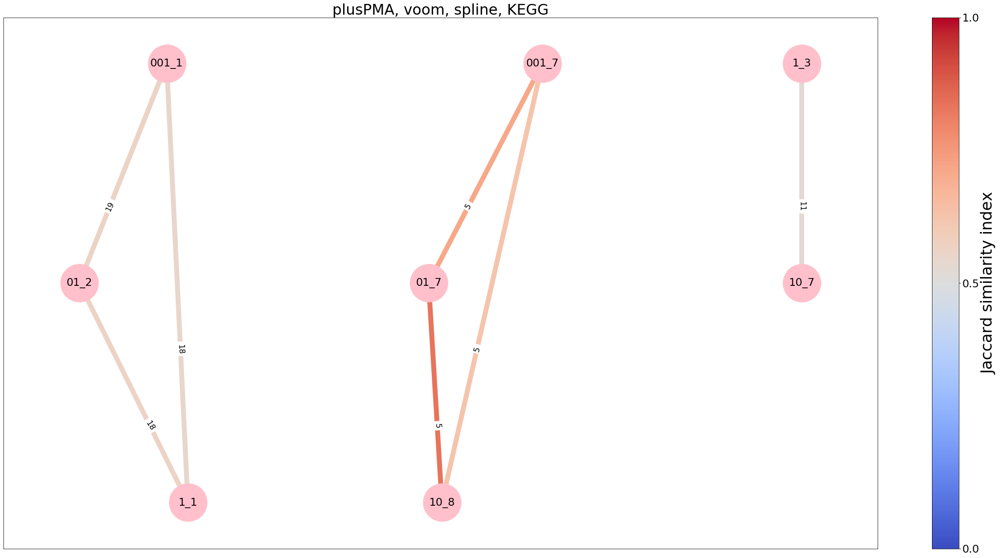

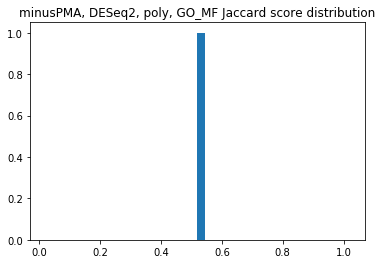

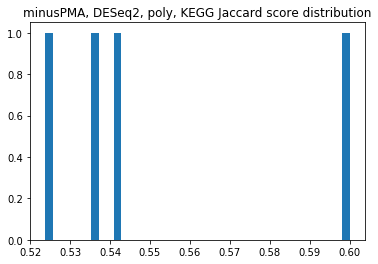

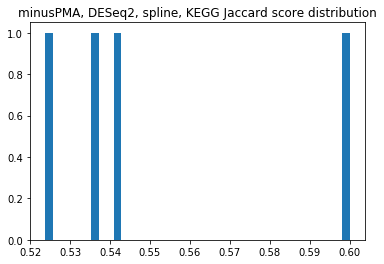

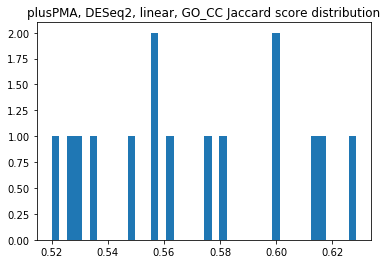

...

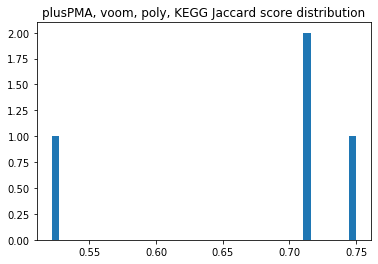

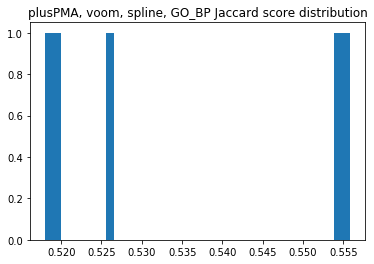

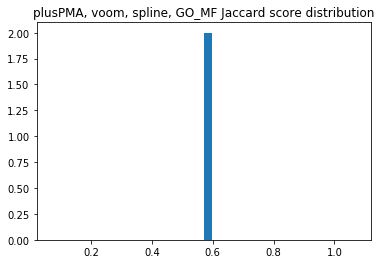

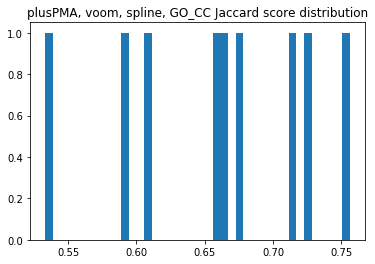

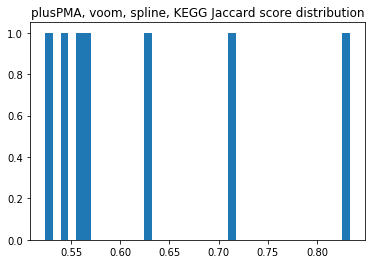

In [23]:
path = ""
path_path = ""
output_path=""
output_path2 = ""
methods = ['DESeq2', 'edgeR', 'voom']
pma_types = ['minus','plus']
regr_types = ['linear','poly','spline']
enr_types = ['GO_BP', 'GO_MF', 'GO_CC', 'KEGG']
components_dict_conc = {}
import networkx as nx
for method in methods:
    for pma_type in pma_types:
        for regr_type in regr_types:
            for enr_type in enr_types:
                G = nx.DiGraph()

                concs = ["001","01","1","10"]
                weights = {}
                for i in range(len(concs))[1:]:
                    current_conc = concs[i]
                    prev_concs = concs[:i]
                    if not prev_concs:
                        continue
                    for prev_conc in prev_concs:
                        prev_conc_df = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_{prev_conc}_clusters_{regr_type}_2000.csv', sep = '\t')
                        current_conc_df = pd.read_csv(f'{path}/{pma_type}PMA_{method}_time_{current_conc}_clusters_{regr_type}_2000.csv', sep = '\t')
                        prev_cluster = set(prev_conc_df['cluster'])
                        current_cluster = set(current_conc_df['cluster'])
                        prev_conc_dict = {}
                        for cluster in prev_cluster:
                            go_bp = pd.read_csv(f"{path_path}//{pma_type}PMA_{method}_time_{prev_conc}_cluster{cluster}_{enr_type}_{regr_type}_2000.csv",sep = '\t')
                            for jj, row in go_bp.iterrows():
                                BgRatio[row['Description']] = row['BgRatio'].split('/')[0]
                            prev_conc_dict[cluster] = set(go_bp['ID'])

                        current_conc_dict = {}
                        for cluster in current_cluster:
                            go_bp = pd.read_csv(f"{path_path}//{pma_type}PMA_{method}_time_{current_conc}_cluster{cluster}_{enr_type}_{regr_type}_2000.csv",sep = '\t')
                            for jj, row in go_bp.iterrows():
                                BgRatio[row['Description']] = row['BgRatio'].split('/')[0]
                            current_conc_dict[cluster] = set(go_bp['ID'])

                        intersection_dict = {}
                        intersection_len_dict = {}
                        for prev_cluster in prev_conc_dict:
                            for current_cluster in current_conc_dict:
                                length = len(list(set(prev_conc_dict[prev_cluster]) & set(current_conc_dict[current_cluster])))
                                if length > 2:
                                    inter_cluster = str(prev_cluster)+"_"+str(current_cluster)
                                    jaccard = compute_jaccard(set(prev_conc_dict[prev_cluster]), set(current_conc_dict[current_cluster]))
                                    if jaccard > 0.5:
                                        intersection_dict[inter_cluster] = jaccard
                                        intersection_len_dict[inter_cluster] = length
                                        jaccard_str = f"{round(jaccard,2)}"
                                        G.add_edge(f"{prev_conc}_{prev_cluster}", f"{current_conc}_{current_cluster}", label =f"{length}")
                                        weights[(f"{prev_conc}_{prev_cluster}", f"{concs[i]}_{current_cluster}")] = jaccard
                if weights == {}:
                    continue
                    
                import matplotlib as mpl
                plt.figure(5,figsize=(40,20),facecolor='white').clf()  

                from networkx.drawing.nx_agraph import write_dot
                from networkx.drawing.nx_pydot import graphviz_layout

                pos = graphviz_layout(G, prog="dot")

                nx.draw_networkx_nodes(G, pos,  node_color="pink", node_size = 6000, fontsize=30)
                nx.draw_networkx_labels(G, pos, font_size=22)

                edges,ws = zip(*weights.items())

                #print(edges)
                # colormap
                cmap = plt.cm.coolwarm

                nx.draw_networkx_edges(G,
                                       pos,
                                       edgelist=edges,
                                       width=10.0,
                                       edge_cmap=cmap,
                                       edge_vmin = 0 ,
                                       edge_vmax = 1,
                                       edge_color=ws,
                                       arrows=True)

                labels = nx.get_edge_attributes(G,'label')

                nx.draw_networkx_edge_labels(G,pos,label_pos=0.35,edge_labels=labels, font_size=16, horizontalalignment="center", 
                                             verticalalignment="center",bbox= dict(alpha=1, color = 'w'))
                from matplotlib.pyplot import figure


                # Normalizer
                norm = mpl.colors.Normalize(vmin=0, vmax=1)

                # creating ScalarMappable
                sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
                sm.set_array([])

                cb = plt.colorbar(sm, ticks=[0,0.5,1])
                cb.set_label(label="Jaccard similarity index", size=32)
                cb.ax.tick_params(labelsize=22)

                plt.title(f"{pma_type}PMA, {method}, {regr_type}, {enr_type}", fontsize=30)
                plt.savefig(f"{output_path}//{pma_type}PMA_{method}_{regr_type}_const_conc_{enr_type}_2000.png",bbox_inches='tight')
                plt.figure().clf()
                plt.hist(ws, bins=40)  # density=False would make counts
                plt.title(f"{pma_type}PMA, {method}, {regr_type}, {enr_type} Jaccard score distribution")
                plt.savefig(f"{output_path2}//{pma_type}PMA_{method}_{regr_type}_{enr_type}_const_conc_distribution_2000.png",bbox_inches='tight')
                edges = set(G.edges)
                graph = {}

                for v1, v2 in edges:
                    if v1 not in graph:
                        graph[v1] = set()
                    graph[v1].add(v2)
                    if v2 not in graph:
                        graph[v2] = set()
                    graph[v2].add(v1)
                components = []
                for component in connected_components(graph):
                    c = set(component)
                    components.append([edge for edge in edges
                                            if c.intersection(edge)])
                    
                components_dict_conc[f'{pma_type}PMA-{method}-{regr_type}-{enr_type}'] = components
                
components_dict_filtered_const_conc_2000 = {}
for cond in components_dict_conc:
    for component in components_dict_conc[cond]:
        nodes_set = set()
        for edge in component:
            nodes_set.add(edge[0].split('_')[0])
            nodes_set.add(edge[1].split('_')[0])
        if len(nodes_set) > 2:
            if cond not in components_dict_filtered_const_conc_2000:
                components_dict_filtered_const_conc_2000[cond] = []
            components_dict_filtered_const_conc_2000[cond].append(component)


In [24]:
name = 'plusPMA-voom-spline-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-poly-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-spline-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-poly-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-poly-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-spline-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-spline-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

    
name = 'minusPMA-DESeq2-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-voom-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-DESeq2-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG1.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

#########################33333333

name = 'plusPMA-voom-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-voom-linear-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG2.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-spline-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-edgeR-poly-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-edgeR-spline-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-DESeq2-linear-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][3]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][2]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-voom-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][2]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-linear-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][2]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_conc_2000[name][2]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')



C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 432x288 with 0 Axes>

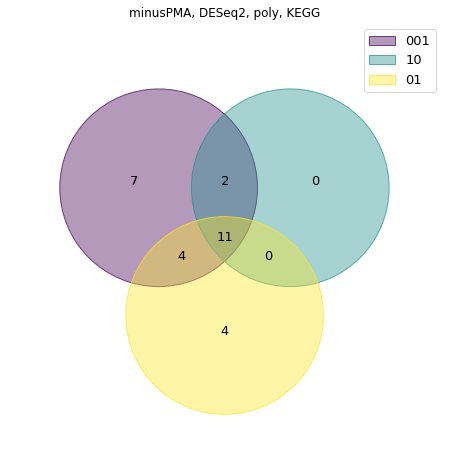

<Figure size 432x288 with 0 Axes>

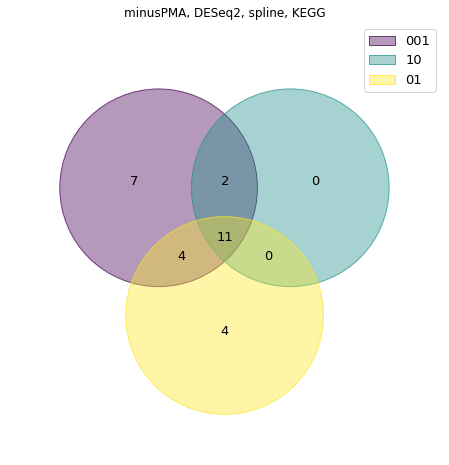

<Figure size 432x288 with 0 Axes>

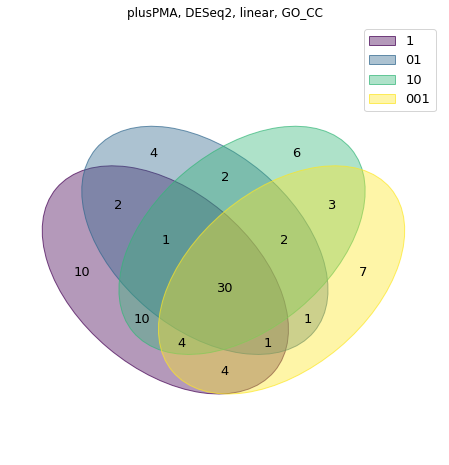

<Figure size 432x288 with 0 Axes>

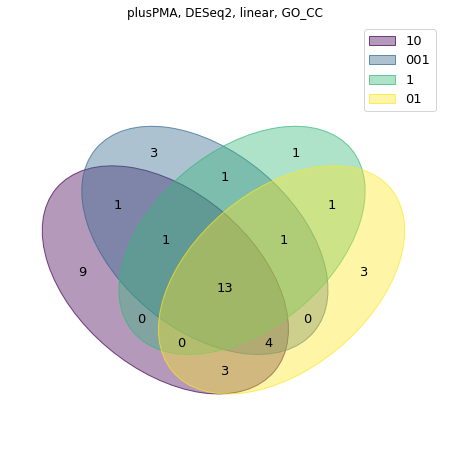

<Figure size 432x288 with 0 Axes>

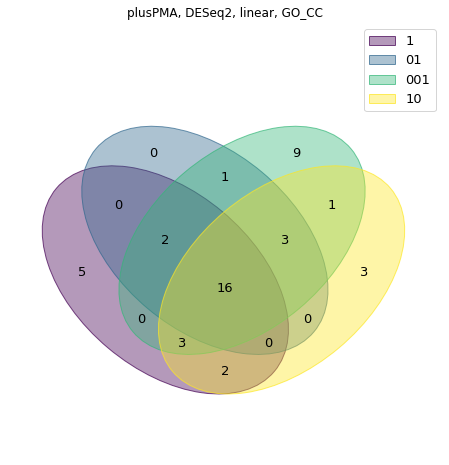

<Figure size 432x288 with 0 Axes>

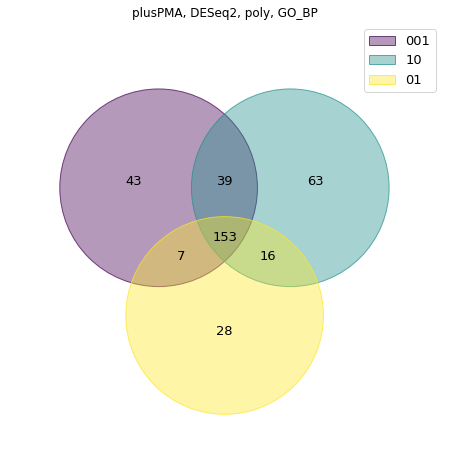

<Figure size 432x288 with 0 Axes>

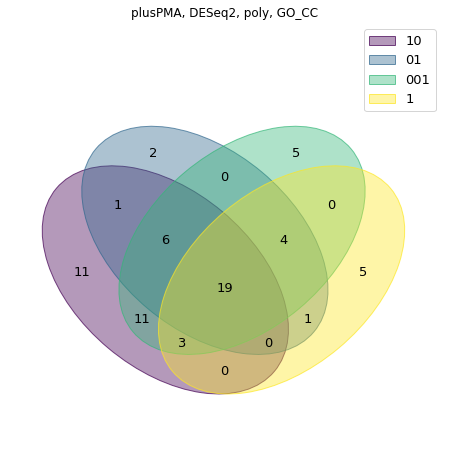

<Figure size 432x288 with 0 Axes>

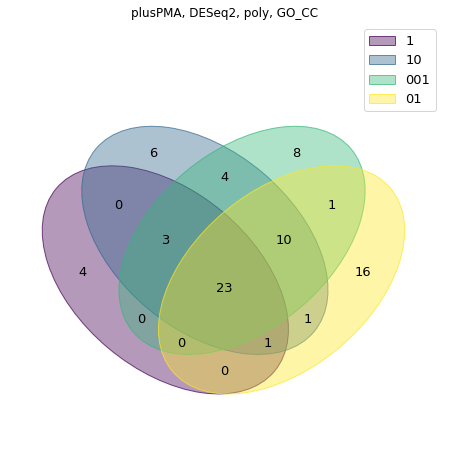

<Figure size 432x288 with 0 Axes>

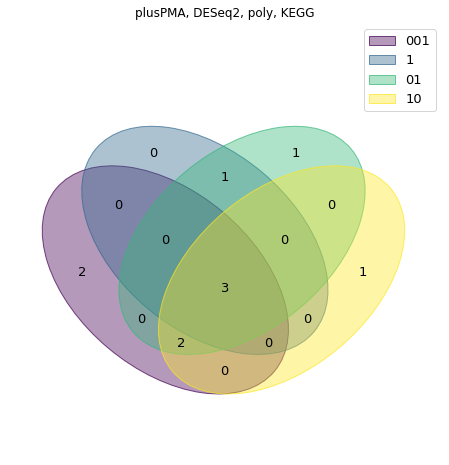

<Figure size 432x288 with 0 Axes>

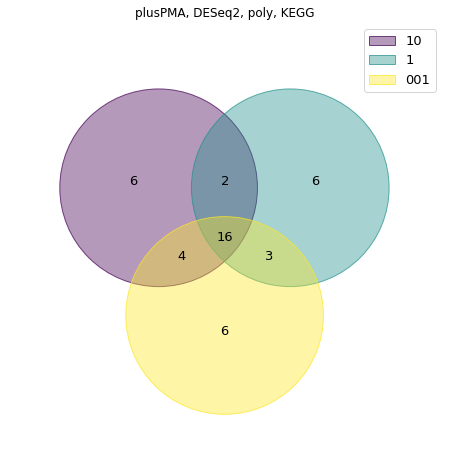

<Figure size 432x288 with 0 Axes>

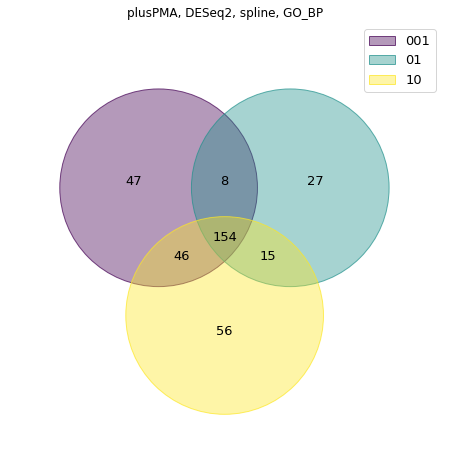

<Figure size 432x288 with 0 Axes>

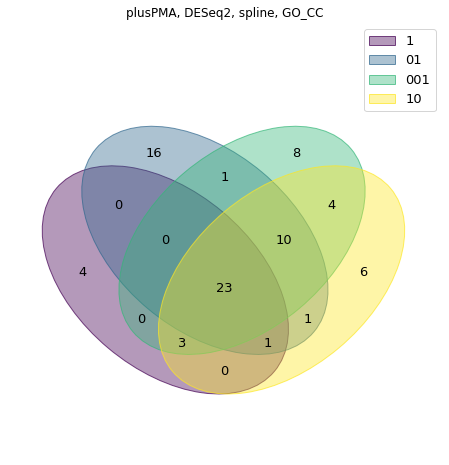

<Figure size 432x288 with 0 Axes>

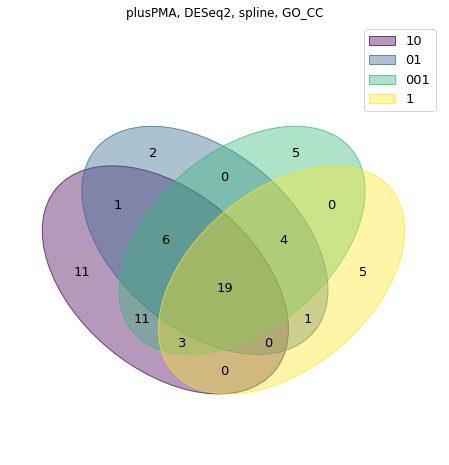

<Figure size 432x288 with 0 Axes>

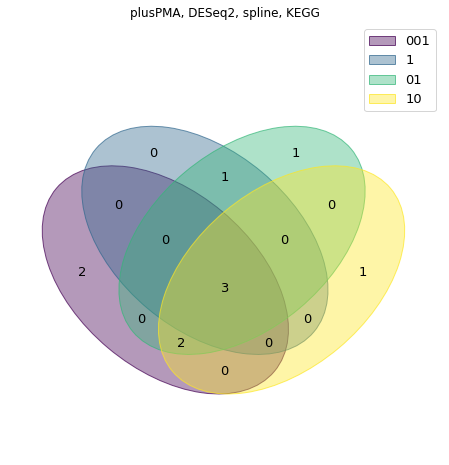

<Figure size 432x288 with 0 Axes>

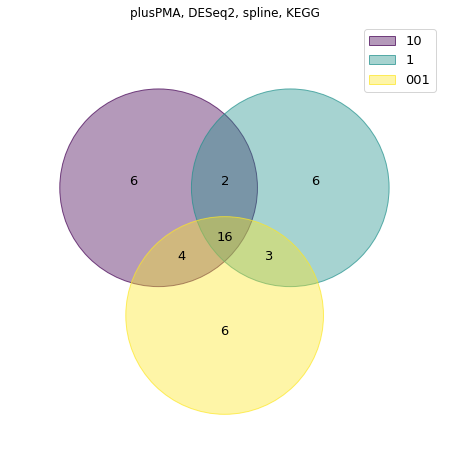

<Figure size 432x288 with 0 Axes>

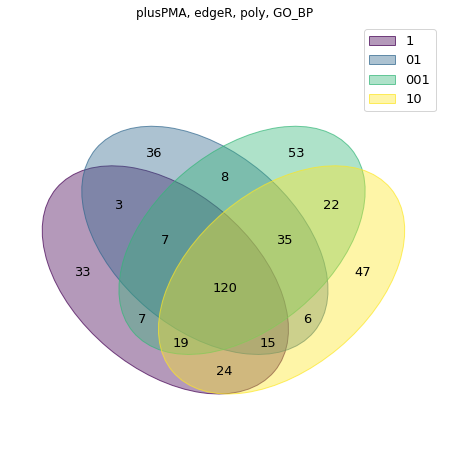

<Figure size 432x288 with 0 Axes>

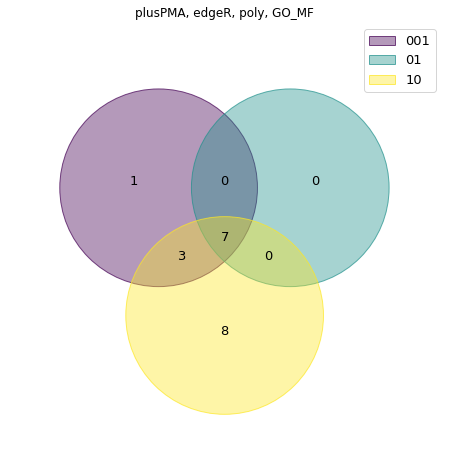

<Figure size 432x288 with 0 Axes>

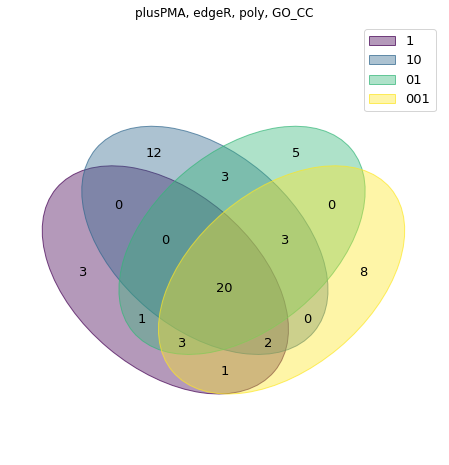

<Figure size 432x288 with 0 Axes>

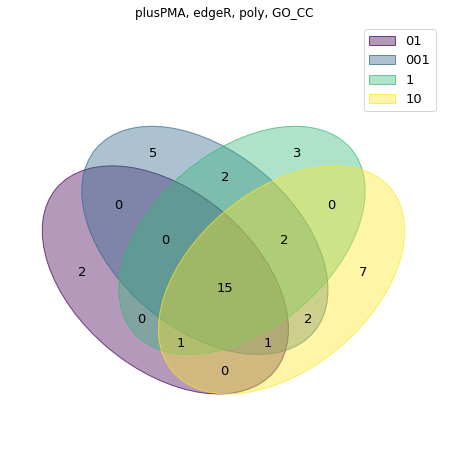

<Figure size 432x288 with 0 Axes>

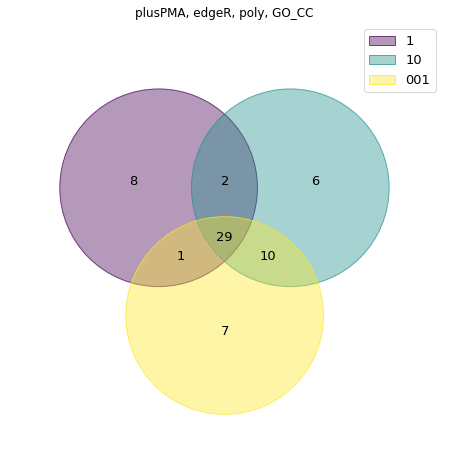

<Figure size 432x288 with 0 Axes>

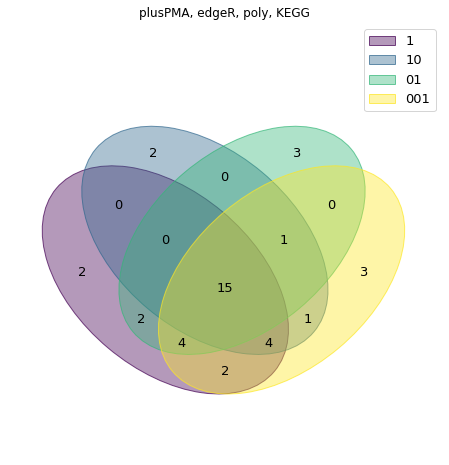

<Figure size 432x288 with 0 Axes>

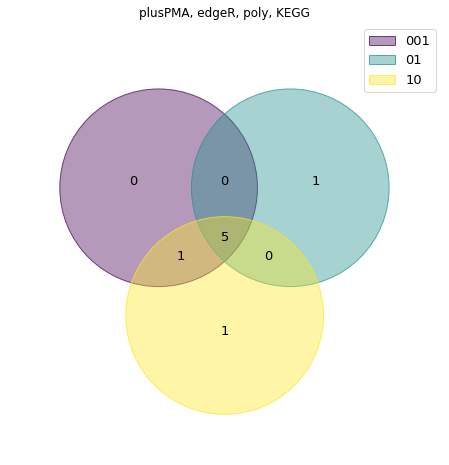

<Figure size 432x288 with 0 Axes>

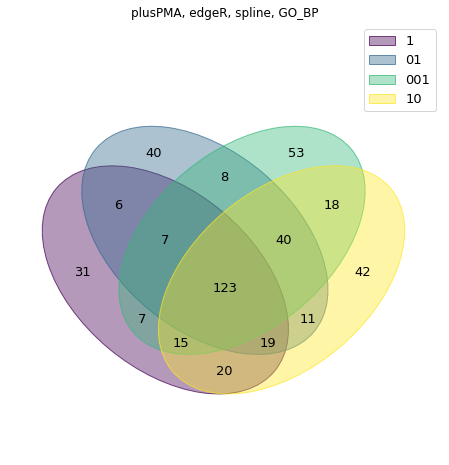

<Figure size 432x288 with 0 Axes>

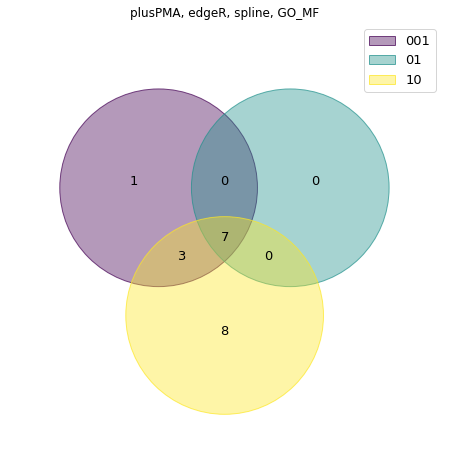

<Figure size 432x288 with 0 Axes>

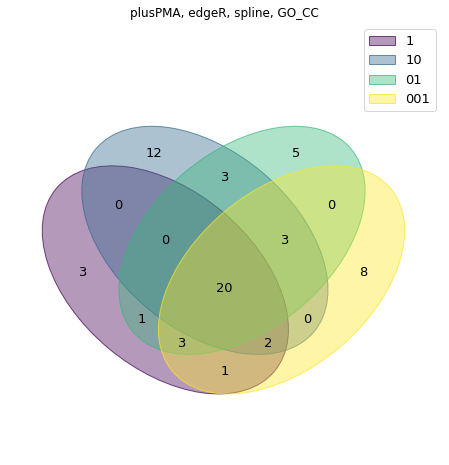

<Figure size 432x288 with 0 Axes>

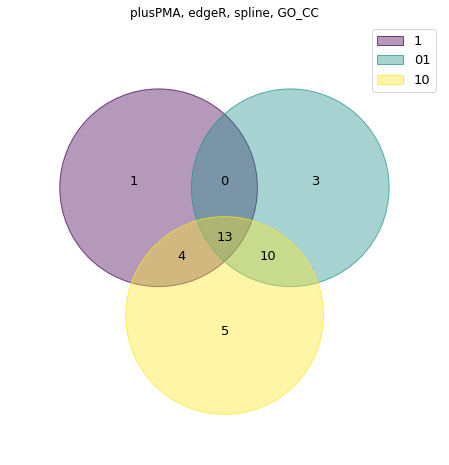

<Figure size 432x288 with 0 Axes>

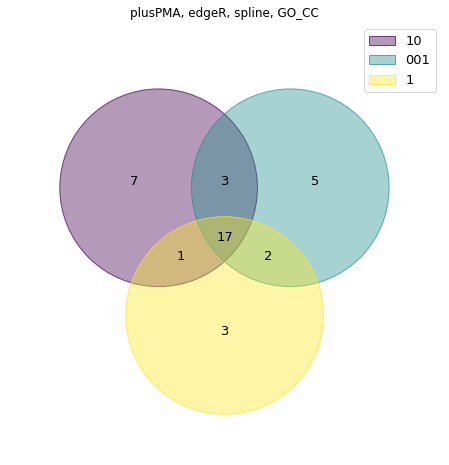

<Figure size 432x288 with 0 Axes>

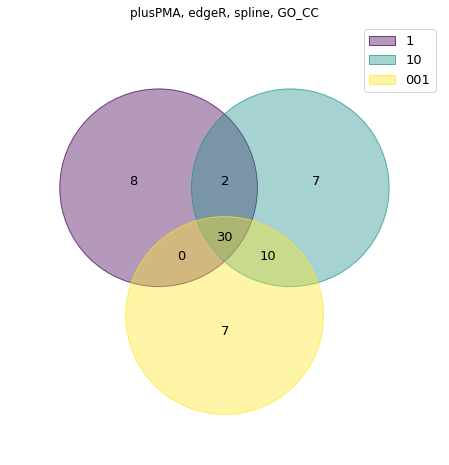

<Figure size 432x288 with 0 Axes>

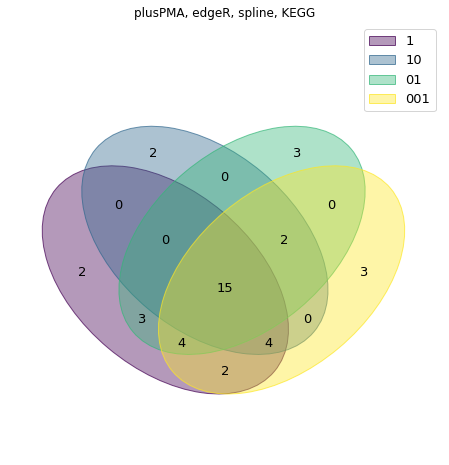

<Figure size 432x288 with 0 Axes>

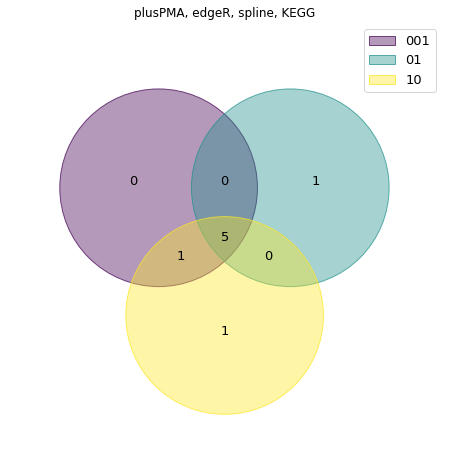

<Figure size 432x288 with 0 Axes>

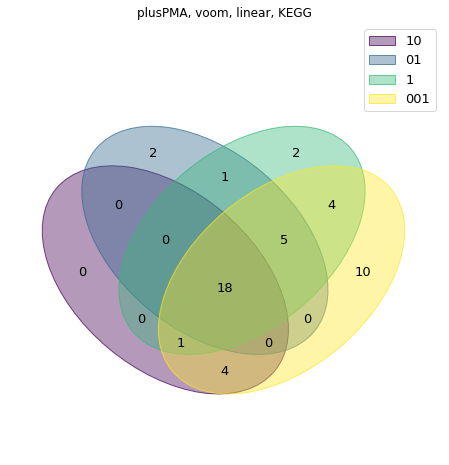

<Figure size 432x288 with 0 Axes>

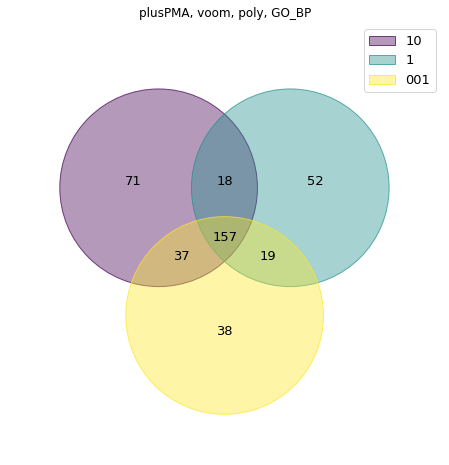

<Figure size 432x288 with 0 Axes>

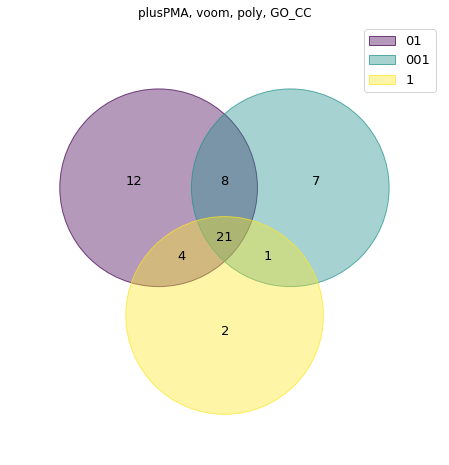

<Figure size 432x288 with 0 Axes>

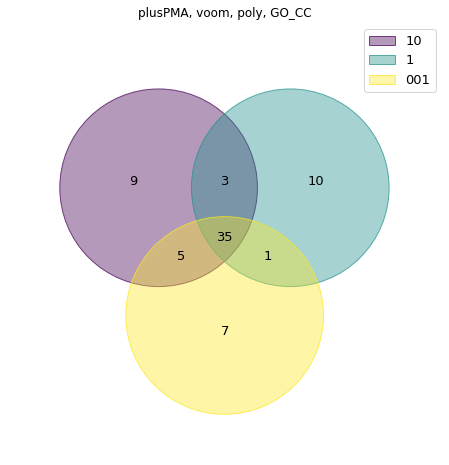

<Figure size 432x288 with 0 Axes>

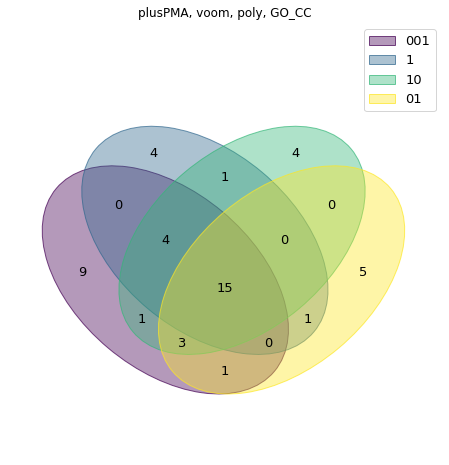

<Figure size 432x288 with 0 Axes>

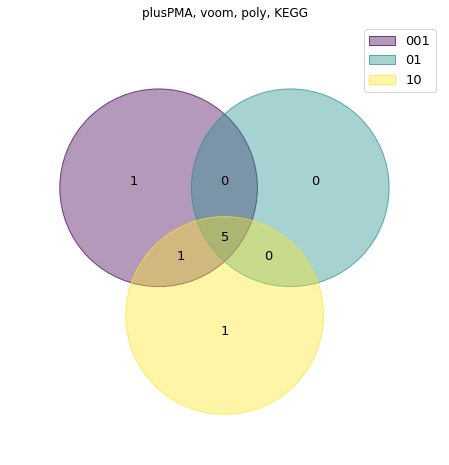

<Figure size 432x288 with 0 Axes>

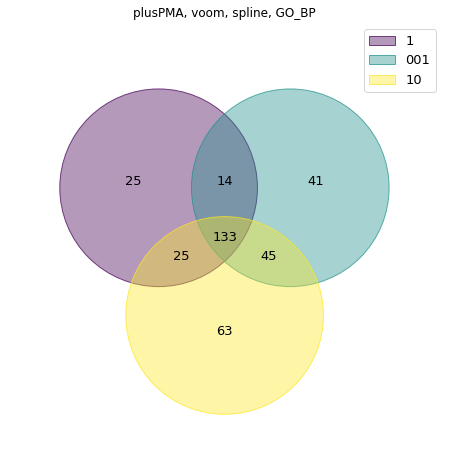

<Figure size 432x288 with 0 Axes>

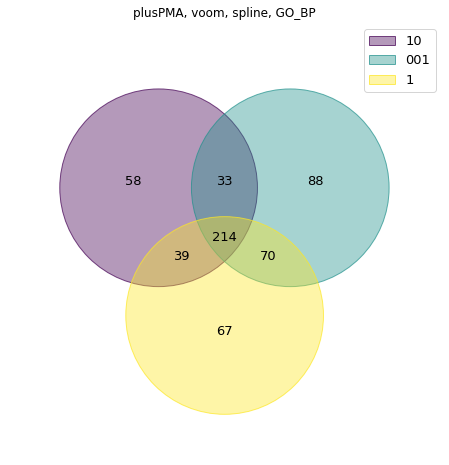

<Figure size 432x288 with 0 Axes>

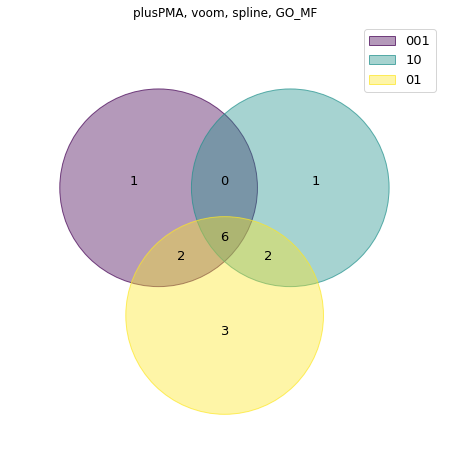

<Figure size 432x288 with 0 Axes>

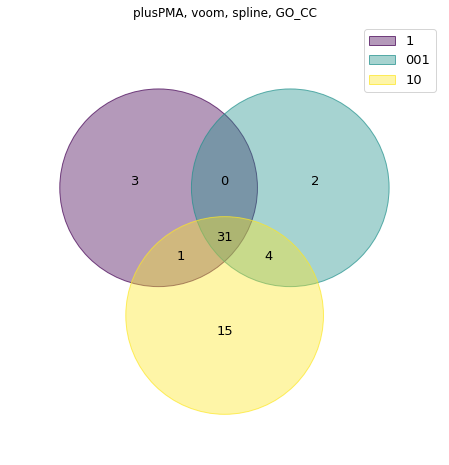

<Figure size 432x288 with 0 Axes>

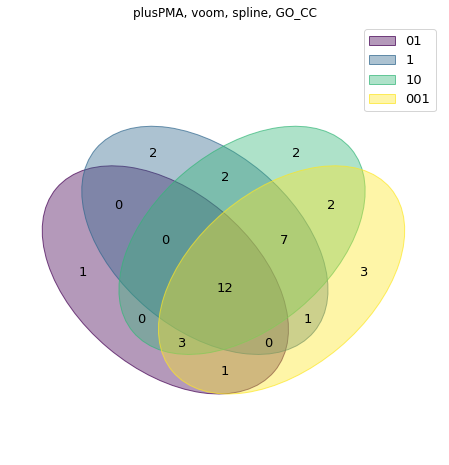

<Figure size 432x288 with 0 Axes>

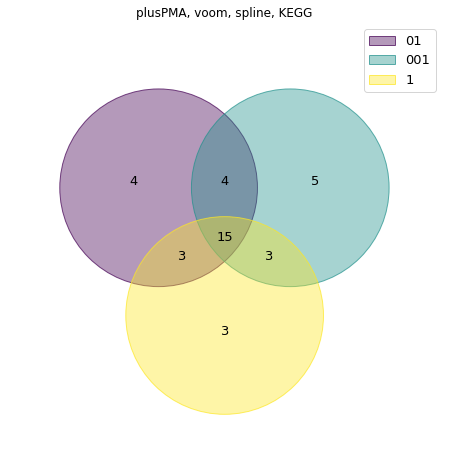

<Figure size 432x288 with 0 Axes>

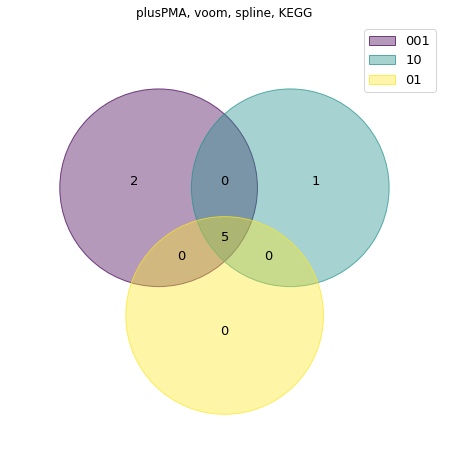

In [134]:
path = ""
output_path = ""
for cond in components_dict_filtered_const_conc_2000:
    pma_type, method, regr_type, go_type = cond.split('-')
    for i, component in enumerate(components_dict_filtered_const_conc_2000[cond]):
        id_genes_stat = {'cond':[], 'cluster':[], 'path_id':[], 'path':[], 'genes':[]}
        nodes = set()
        descriptions = []
        results = {}
        for edge in component:
            nodes.add(edge[0])
            nodes.add(edge[1])
        for node in nodes:
            cond, cluster = node.split('_')
            table = pd.read_csv(f"{path}\\{pma_type}_{method}_time_{cond}_cluster{cluster}_{go_type}_{regr_type}_2000.csv", sep = '\t')
            for y,row in table.iterrows():
                id_genes_stat['cond'].append(cond)
                id_genes_stat['cluster'].append(cluster)
                id_genes_stat['path_id'].append(row['ID'])
                id_genes_stat['path'].append(row['Description'])
                id_genes_stat['genes'].append(row['geneID'])
            if cond not in results:
                results[cond] = set()
            results[cond].update(set(table['ID']))
            descriptions.append(set(table['Description']))
        plt.figure(facecolor='white').clf() #figsize=(20,20),
        inter = set.union(*descriptions)
        venn(results)
        plt.title(f"{pma_type}, {method}, {regr_type}, {go_type}")
        plt.savefig(f'{output_path}\\{pma_type}_{method}_const_conc_{regr_type}_{go_type}_{i}_venn_2000.png')
        pd.DataFrame(inter).to_csv(f'{output_path}\\{pma_type}_{method}_const_conc_{regr_type}_{go_type}_{i}_2000.csv',
                                   sep = '\t',
                                   header = False,
                                   index = False)
        pd.DataFrame(id_genes_stat).to_csv(f'{output_path}\\{pma_type}_{method}_const_conc_{regr_type}_{go_type}_{i}_id_genes_stat_2000.csv',
                                           sep = '\t',
                                           header = True,
                                           index = False)
        
        component_content[f'{pma_type}_{method}_{regr_type}_{go_type}_{i}_2000'] = inter
        for p in inter:
            if go_type not in freq_const_conc:
                freq_const_conc[go_type] = {}
            if p not in freq_const_conc[go_type]:
                freq_const_conc[go_type][p] = 0
            freq_const_conc[go_type][p]+=1
            
            if pma_type =='minusPMA':
                if go_type not in minus_freq_const_conc:
                    minus_freq_const_conc[go_type] = {}
                if p not in minus_freq_const_conc[go_type]:
                    minus_freq_const_conc[go_type][p] = 0
                minus_freq_const_conc[go_type][p]+=1
            if pma_type =='plusPMA':
                if go_type not in plus_freq_const_conc:
                    plus_freq_const_conc[go_type] = {}
                if p not in plus_freq_const_conc[go_type]:
                    plus_freq_const_conc[go_type][p] = 0
                plus_freq_const_conc[go_type][p]+=1            

In [ ]:
component_content_jac = {}
for component1 in component_content:
    for component2 in component_content:
        component_content_jac[component1+"|"+component2] = compute_jaccard(component_content[component1],component_content[component2])
k_const_conc = []
for j in component_content_jac:
    if component_content_jac[j] > 0.7:
        a,b = j.split('|')
        if a == b:
            continue
        found = False
        for s in k_const_conc:
            if a in s or b in s:
                s.add(a)
                s.add(b)
                found = True
                break
        if not found:
            k_const_conc.append({a,b})
            
freq_filtered = {}
for go_type in freq_const_conc:
    freq_filtered[go_type] ={}
    num_path = 0
    for path in freq_const_conc[go_type]:
        if freq_const_conc[go_type][path] > 5:
            freq_filtered[go_type][path] = freq_const_conc[go_type][path]
graph_picture_set = set()
for go_type in freq_filtered:
    for path in freq_filtered[go_type]:
        for component in component_content:
            if go_type in component:
                if path in component_content[component]:
                    graph_picture_set.add(component)

In [80]:
k_const_conc

[{'minusPMA_DESeq2_linear_KEGG_0',
  'minusPMA_DESeq2_poly_KEGG_0',
  'minusPMA_DESeq2_poly_KEGG_0_2000',
  'minusPMA_DESeq2_spline_KEGG_0',
  'minusPMA_DESeq2_spline_KEGG_0_2000',
  'plusPMA_DESeq2_poly_KEGG_1',
  'plusPMA_voom_poly_KEGG_0',
  'plusPMA_voom_spline_KEGG_1'},
 {'plusPMA_DESeq2_poly_GO_CC_0', 'plusPMA_DESeq2_spline_GO_CC_1'},
 {'plusPMA_DESeq2_poly_GO_CC_1', 'plusPMA_DESeq2_spline_GO_CC_0'},
 {'plusPMA_DESeq2_poly_KEGG_0',
  'plusPMA_DESeq2_poly_KEGG_0_2000',
  'plusPMA_DESeq2_spline_KEGG_0',
  'plusPMA_DESeq2_spline_KEGG_0_2000',
  'plusPMA_edgeR_poly_KEGG_0',
  'plusPMA_edgeR_poly_KEGG_1_2000',
  'plusPMA_edgeR_spline_KEGG_0',
  'plusPMA_edgeR_spline_KEGG_1_2000',
  'plusPMA_voom_poly_KEGG_0_2000',
  'plusPMA_voom_poly_KEGG_1',
  'plusPMA_voom_spline_KEGG_0',
  'plusPMA_voom_spline_KEGG_1_2000'},
 {'plusPMA_edgeR_poly_GO_CC_0', 'plusPMA_edgeR_spline_GO_CC_0'},
 {'plusPMA_edgeR_poly_KEGG_0', 'plusPMA_edgeR_spline_KEGG_0'},
 {'plusPMA_voom_linear_GO_CC_0',
  'plusPMA_voo

In [81]:
k_const_conc =[{'minusPMA_DESeq2_linear_KEGG_0',
  'minusPMA_DESeq2_poly_KEGG_0',
  'minusPMA_DESeq2_poly_KEGG_0_2000',
  'minusPMA_DESeq2_spline_KEGG_0',
  'minusPMA_DESeq2_spline_KEGG_0_2000',
  'plusPMA_DESeq2_poly_KEGG_1',
  'plusPMA_voom_poly_KEGG_0',
  'plusPMA_voom_spline_KEGG_1'},
 {'plusPMA_DESeq2_poly_KEGG_0',
  'plusPMA_DESeq2_poly_KEGG_0_2000',
  'plusPMA_DESeq2_spline_KEGG_0',
  'plusPMA_DESeq2_spline_KEGG_0_2000',
  'plusPMA_edgeR_poly_KEGG_0',
  'plusPMA_edgeR_poly_KEGG_1_2000',
  'plusPMA_edgeR_spline_KEGG_0',
  'plusPMA_edgeR_spline_KEGG_1_2000',
  'plusPMA_voom_poly_KEGG_0_2000',
  'plusPMA_voom_poly_KEGG_1',
  'plusPMA_voom_spline_KEGG_0',
  'plusPMA_voom_spline_KEGG_1_2000'},
 {'plusPMA_edgeR_poly_KEGG_0', 'plusPMA_edgeR_spline_KEGG_0'},
 {'plusPMA_DESeq2_poly_GO_BP_0_2000', 'plusPMA_DESeq2_spline_GO_BP_0_2000'},
 {'plusPMA_DESeq2_poly_KEGG_1_2000',
  'plusPMA_DESeq2_spline_KEGG_1_2000',
  'plusPMA_edgeR_poly_KEGG_0_2000',
  'plusPMA_edgeR_spline_KEGG_0_2000',
  'plusPMA_voom_spline_KEGG_0_2000'},
 {'plusPMA_edgeR_poly_GO_BP_0_2000',
  'plusPMA_edgeR_spline_GO_BP_0_2000',
  'plusPMA_voom_poly_GO_BP_0_2000',
  'plusPMA_voom_spline_GO_BP_0_2000'},
 {'plusPMA_edgeR_poly_GO_MF_0_2000', 'plusPMA_edgeR_spline_GO_MF_0_2000'}]

In [374]:
components_dict_filtered_const_conc_good = {}
components_dict_filtered_const_conc_good_2000 = {}

for name in components_dict_filtered_const_conc:
    components_dict_filtered_const_conc_good['_'.join(name.split('-'))] = components_dict_filtered_const_conc[name]
    
for name in components_dict_filtered_const_conc_2000:
    components_dict_filtered_const_conc_good_2000['_'.join(name.split('-'))] = components_dict_filtered_const_conc_2000[name]
        
    
    
for i, group in enumerate(k_const_conc):
    print(f'Group {i+1}')
    test = list(group)[0]
    if '_CC' in test:
        continue
        
    for file in group:
        is_top = False
        tokens = file.split('_')
        if tokens[-1] == '2000':
            is_top = True
            tokens = tokens[:-1]
        component_id = int(tokens[-1])
        tokens = tokens[:-1]
        if is_top:
            comp = components_dict_filtered_const_conc_good_2000['_'.join(tokens)][component_id]
        else:
            comp = components_dict_filtered_const_conc_good['_'.join(tokens)][component_id]
        nodes = set()
        pictures_names = []
        for edge in comp:
            nodes.add(edge[0])
            nodes.add(edge[1])
        for node in nodes:
            conc, cluster = node.split('_')
            filename = f'{tokens[0]}_{tokens[1]}_time_{conc}_{tokens[2]}_{cluster}'
            if is_top:
                filename = filename+"_2000"
                
            filename = filename+".png"
            print(filename)

Group 1
minusPMA_DESeq2_time_01_spline_8_2000.png
minusPMA_DESeq2_time_10_spline_4_2000.png
minusPMA_DESeq2_time_001_spline_5_2000.png
plusPMA_DESeq2_time_001_poly_11.png
plusPMA_DESeq2_time_10_poly_2.png
plusPMA_DESeq2_time_1_poly_9.png
plusPMA_voom_time_1_spline_3.png
plusPMA_voom_time_001_spline_20.png
plusPMA_voom_time_001_spline_21.png
plusPMA_voom_time_1_spline_16.png
plusPMA_voom_time_10_spline_7.png
minusPMA_DESeq2_time_01_poly_8_2000.png
minusPMA_DESeq2_time_10_poly_4_2000.png
minusPMA_DESeq2_time_001_poly_5_2000.png
minusPMA_DESeq2_time_10_linear_1.png
minusPMA_DESeq2_time_01_linear_5.png
minusPMA_DESeq2_time_001_linear_12.png
minusPMA_DESeq2_time_01_spline_18.png
minusPMA_DESeq2_time_01_spline_16.png
minusPMA_DESeq2_time_10_spline_1.png
minusPMA_DESeq2_time_001_spline_17.png
minusPMA_DESeq2_time_01_poly_9.png
minusPMA_DESeq2_time_01_poly_4.png
minusPMA_DESeq2_time_10_poly_4.png
minusPMA_DESeq2_time_001_poly_17.png
plusPMA_voom_time_10_poly_7.png
plusPMA_voom_time_1_poly_4.pn

In [84]:
components_dict_filtered_const_conc_good = {}
components_dict_filtered_const_conc_good_2000 = {}

for name in components_dict_filtered_const_conc:
    components_dict_filtered_const_conc_good['_'.join(name.split('-'))] = components_dict_filtered_const_conc[name]
    
for name in components_dict_filtered_const_conc_2000:
    components_dict_filtered_const_conc_good_2000['_'.join(name.split('-'))] = components_dict_filtered_const_conc_2000[name]
        
for i, group in enumerate(k_const_conc):
    test = list(group)[0]
    if '_CC' in test:
        continue
    inter_temp_minus = []
    inter_temp_plus = []
    for file in group:
        if 'minus' in file:
            inter_temp_minus.append(component_content[file])
        if 'plus' in file:
            inter_temp_plus.append(component_content[file])
    
        
    tpe = ""
    if 'KEGG' in file:
        tpe = 'KEGG'
    if 'MF' in file:
        tpe = 'GO MF'
    if 'BP' in file:
        tpe = 'GO BP'
    if 'minus' in file:
        pma_type = 'minusPMA'
    if 'plus' in file:
        pma_type = 'plusPMA'
        
    if inter_temp_minus:
        intersect_group_minus = set.intersection(*inter_temp_minus)
    else:
        intersect_group_minus = set()
    if intersect_group_plus:
        intersect_group_plus = set.intersection(*inter_temp_plus)
    else:
        intersect_group_plus = set()
        
    path = ""
    intersect_group_minus = list(intersect_group_minus)
    df = pd.DataFrame({f'Group {i+1}, {tpe}' : intersect_group_minus})
    bgs = []
    for it in intersect_group_minus:
        bgs.append(BgRatio[it])
    
    df['Gene_in_path'] = bgs
    df.to_csv(f'{path}\\Group {i+1}_minusPMA_const_conc.txt', index=False, header = True)
    intersect_group_plus = list(intersect_group_plus)
    
    df = pd.DataFrame({f'Group {i+1}, {tpe}' : intersect_group_plus})
    bgs = []
    for it in intersect_group_plus:
        bgs.append(BgRatio[it])
    
    df['Genes_in_path'] = bgs
    df.to_csv(f'{path}\\Group {i+1}_plusPMA_const_conc.txt', index=False, header = True)

In [398]:
gs = {'Group 1':
['minusPMA_DESeq2_time_01_spline_8_2000.png', 'minusPMA_DESeq2_time_10_spline_4_2000.png', 'minusPMA_DESeq2_time_001_spline_5_2000.png', 'plusPMA_DESeq2_time_001_poly_11.png', 'plusPMA_DESeq2_time_10_poly_2.png', 'plusPMA_DESeq2_time_1_poly_9.png', 'plusPMA_voom_time_1_spline_3.png', 'plusPMA_voom_time_001_spline_20.png', 'plusPMA_voom_time_001_spline_21.png', 'plusPMA_voom_time_1_spline_16.png', 'plusPMA_voom_time_10_spline_7.png', 'minusPMA_DESeq2_time_01_poly_8_2000.png', 'minusPMA_DESeq2_time_10_poly_4_2000.png', 'minusPMA_DESeq2_time_001_poly_5_2000.png', 'minusPMA_DESeq2_time_10_linear_1.png', 'minusPMA_DESeq2_time_01_linear_5.png', 'minusPMA_DESeq2_time_001_linear_12.png', 'minusPMA_DESeq2_time_01_spline_18.png', 'minusPMA_DESeq2_time_01_spline_16.png', 'minusPMA_DESeq2_time_10_spline_1.png', 'minusPMA_DESeq2_time_001_spline_17.png', 'minusPMA_DESeq2_time_01_poly_9.png', 'minusPMA_DESeq2_time_01_poly_4.png', 'minusPMA_DESeq2_time_10_poly_4.png', 'minusPMA_DESeq2_time_001_poly_17.png', 'plusPMA_voom_time_10_poly_7.png', 'plusPMA_voom_time_1_poly_4.png', 'plusPMA_voom_time_001_poly_21.png', 'plusPMA_voom_time_001_poly_19.png'],
'Group 2':
['plusPMA_edgeR_time_01_spline_6.png', 'plusPMA_edgeR_time_001_spline_8.png', 'plusPMA_edgeR_time_10_spline_6.png', 'plusPMA_edgeR_time_01_spline_6_2000.png', 'plusPMA_edgeR_time_001_spline_5_2000.png', 'plusPMA_edgeR_time_10_spline_6_2000.png', 'plusPMA_DESeq2_time_001_poly_6_2000.png', 'plusPMA_DESeq2_time_10_poly_8_2000.png', 'plusPMA_DESeq2_time_01_poly_5_2000.png', 'plusPMA_DESeq2_time_1_poly_7_2000.png', 'plusPMA_voom_time_001_spline_7_2000.png', 'plusPMA_voom_time_10_spline_8_2000.png', 'plusPMA_voom_time_01_spline_7_2000.png', 'plusPMA_voom_time_1_spline_12.png', 'plusPMA_voom_time_10_spline_9.png', 'plusPMA_voom_time_01_spline_8.png', 'plusPMA_voom_time_001_spline_8.png', 'plusPMA_edgeR_time_001_poly_5_2000.png', 'plusPMA_edgeR_time_01_poly_5_2000.png', 'plusPMA_edgeR_time_10_poly_6_2000.png', 'plusPMA_DESeq2_time_10_poly_13.png', 'plusPMA_DESeq2_time_01_poly_9.png', 'plusPMA_DESeq2_time_10_poly_12.png', 'plusPMA_DESeq2_time_001_poly_15.png', 'plusPMA_DESeq2_time_1_poly_7.png', 'plusPMA_voom_time_01_poly_6_2000.png', 'plusPMA_voom_time_10_poly_8_2000.png', 'plusPMA_voom_time_001_poly_5_2000.png', 'plusPMA_DESeq2_time_10_spline_19.png', 'plusPMA_DESeq2_time_001_spline_20.png', 'plusPMA_DESeq2_time_1_spline_8.png', 'plusPMA_DESeq2_time_10_spline_18.png', 'plusPMA_DESeq2_time_01_spline_17.png', 'plusPMA_voom_time_1_poly_11.png', 'plusPMA_voom_time_01_poly_7.png', 'plusPMA_voom_time_10_poly_8.png', 'plusPMA_voom_time_001_poly_5.png', 'plusPMA_DESeq2_time_001_spline_6_2000.png', 'plusPMA_DESeq2_time_10_spline_8_2000.png', 'plusPMA_DESeq2_time_01_spline_5_2000.png', 'plusPMA_DESeq2_time_1_spline_7_2000.png', 'plusPMA_edgeR_time_01_poly_6.png', 'plusPMA_edgeR_time_001_poly_9.png', 'plusPMA_edgeR_time_10_poly_6.png'],
'Group 3':
['plusPMA_edgeR_time_01_spline_6.png', 'plusPMA_edgeR_time_001_spline_8.png', 'plusPMA_edgeR_time_10_spline_6.png', 'plusPMA_edgeR_time_01_poly_6.png', 'plusPMA_edgeR_time_001_poly_9.png', 'plusPMA_edgeR_time_10_poly_6.png'],
'Group 4':
['plusPMA_DESeq2_time_001_spline_3_2000.png', 'plusPMA_DESeq2_time_10_spline_4_2000.png', 'plusPMA_DESeq2_time_01_spline_1_2000.png', 'plusPMA_DESeq2_time_001_poly_3_2000.png', 'plusPMA_DESeq2_time_10_poly_4_2000.png', 'plusPMA_DESeq2_time_01_poly_2_2000.png'],
'Group 5':
['plusPMA_voom_time_01_spline_2_2000.png', 'plusPMA_voom_time_001_spline_1_2000.png', 'plusPMA_voom_time_1_spline_1_2000.png', 'plusPMA_edgeR_time_1_poly_3_2000.png', 'plusPMA_edgeR_time_01_poly_2_2000.png', 'plusPMA_edgeR_time_10_poly_1_2000.png', 'plusPMA_edgeR_time_001_poly_1_2000.png', 'plusPMA_edgeR_time_1_spline_3_2000.png', 'plusPMA_edgeR_time_01_spline_2_2000.png', 'plusPMA_edgeR_time_10_spline_1_2000.png', 'plusPMA_edgeR_time_001_spline_1_2000.png', 'plusPMA_DESeq2_time_001_spline_2_2000.png', 'plusPMA_DESeq2_time_1_spline_2_2000.png', 'plusPMA_DESeq2_time_10_spline_1_2000.png', 'plusPMA_DESeq2_time_001_poly_2_2000.png', 'plusPMA_DESeq2_time_1_poly_2_2000.png', 'plusPMA_DESeq2_time_10_poly_1_2000.png'],
'Group 6':
['plusPMA_edgeR_time_10_poly_4_2000.png', 'plusPMA_edgeR_time_001_poly_2_2000.png', 'plusPMA_edgeR_time_1_poly_2_2000.png', 'plusPMA_edgeR_time_01_poly_1_2000.png', 'plusPMA_voom_time_1_spline_6_2000.png', 'plusPMA_voom_time_001_spline_2_2000.png', 'plusPMA_voom_time_10_spline_6_2000.png', 'plusPMA_voom_time_10_poly_5_2000.png', 'plusPMA_voom_time_001_poly_1_2000.png', 'plusPMA_voom_time_1_poly_5_2000.png', 'plusPMA_edgeR_time_10_spline_4_2000.png', 'plusPMA_edgeR_time_001_spline_2_2000.png', 'plusPMA_edgeR_time_1_spline_2_2000.png', 'plusPMA_edgeR_time_01_spline_1_2000.png'],
'Group 7':
['plusPMA_edgeR_time_001_poly_5_2000.png', 'plusPMA_edgeR_time_01_poly_5_2000.png', 'plusPMA_edgeR_time_10_poly_6_2000.png', 'plusPMA_edgeR_time_01_spline_6_2000.png', 'plusPMA_edgeR_time_001_spline_5_2000.png', 'plusPMA_edgeR_time_10_spline_6_2000.png'] }

In [407]:
for g in gs:
    print(g)
    print(sorted(gs[g]))

Group 1
['minusPMA_DESeq2_time_001_linear_12.png', 'minusPMA_DESeq2_time_001_poly_17.png', 'minusPMA_DESeq2_time_001_poly_5_2000.png', 'minusPMA_DESeq2_time_001_spline_17.png', 'minusPMA_DESeq2_time_001_spline_5_2000.png', 'minusPMA_DESeq2_time_01_linear_5.png', 'minusPMA_DESeq2_time_01_poly_4.png', 'minusPMA_DESeq2_time_01_poly_8_2000.png', 'minusPMA_DESeq2_time_01_poly_9.png', 'minusPMA_DESeq2_time_01_spline_16.png', 'minusPMA_DESeq2_time_01_spline_18.png', 'minusPMA_DESeq2_time_01_spline_8_2000.png', 'minusPMA_DESeq2_time_10_linear_1.png', 'minusPMA_DESeq2_time_10_poly_4.png', 'minusPMA_DESeq2_time_10_poly_4_2000.png', 'minusPMA_DESeq2_time_10_spline_1.png', 'minusPMA_DESeq2_time_10_spline_4_2000.png', 'plusPMA_DESeq2_time_001_poly_11.png', 'plusPMA_DESeq2_time_10_poly_2.png', 'plusPMA_DESeq2_time_1_poly_9.png', 'plusPMA_voom_time_001_poly_19.png', 'plusPMA_voom_time_001_poly_21.png', 'plusPMA_voom_time_001_spline_20.png', 'plusPMA_voom_time_001_spline_21.png', 'plusPMA_voom_time_10

C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:110: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


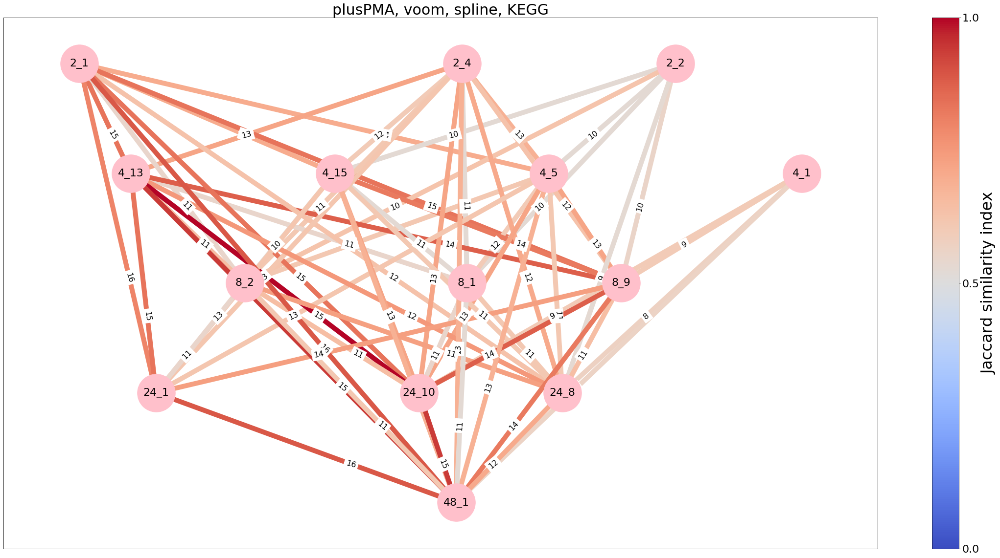

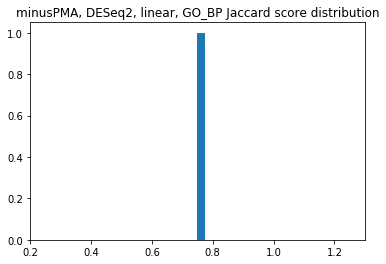

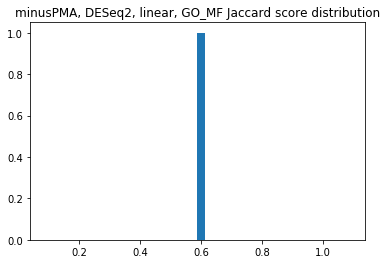

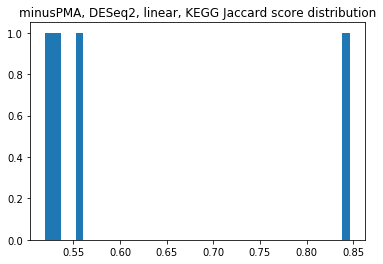

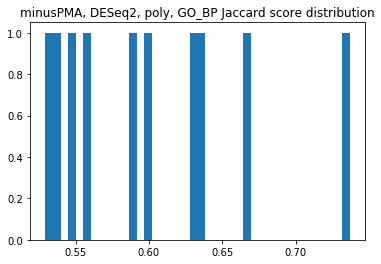

...

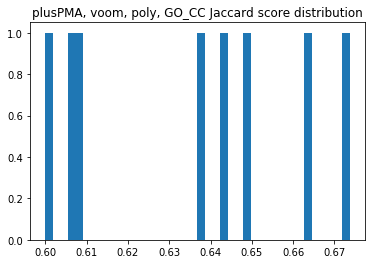

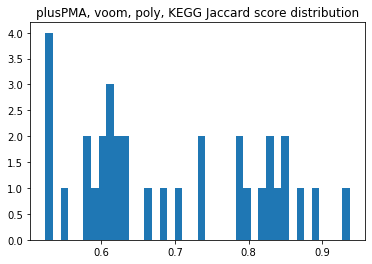

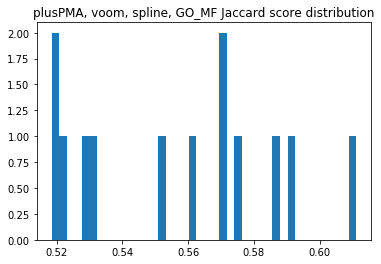

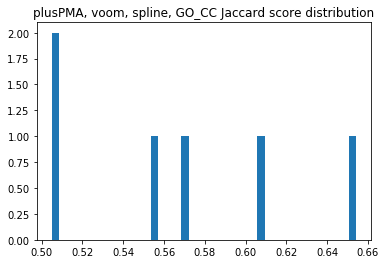

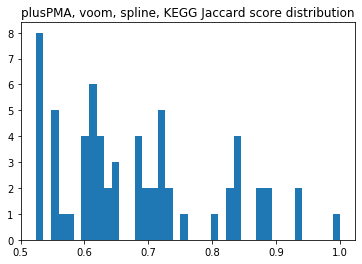

In [12]:
path = ""
path_path = ""
output_path = ""
output_path2 = ""
methods = ['DESeq2', 'edgeR', 'voom']
pma_types = ['minus','plus']
regr_types = ['linear','poly','spline']
enr_types = ['GO_BP', 'GO_MF', 'GO_CC', 'KEGG']
components_dict_time = {}
import networkx as nx
for method in methods:
    for pma_type in pma_types:
        for regr_type in regr_types:
            for enr_type in enr_types:
                G = nx.DiGraph()

                concs = ["2","4","8","24","48"]
                weights = {}
                for i in range(len(concs))[1:]:
                    current_conc = concs[i]
                    prev_concs = concs[:i]
                    if not prev_concs:
                        continue
                    for prev_conc in prev_concs:
                        prev_conc_df = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_{prev_conc}_clusters_{regr_type}_2000.csv', sep = '\t')
                        current_conc_df = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_{current_conc}_clusters_{regr_type}_2000.csv', sep = '\t')
                        prev_cluster = set(prev_conc_df['cluster'])
                        current_cluster = set(current_conc_df['cluster'])
                        prev_conc_dict = {}
                        for cluster in prev_cluster:
                            #print(f"{path_path}//{pma_type}PMA_{method}_time_{prev_conc}_cluster{cluster}_{enr_type}_{regr_type}.csv")
                            go_bp = pd.read_csv(f"{path_path}//{pma_type}PMA_{method}_conc_{prev_conc}_cluster{cluster}_{enr_type}_{regr_type}_2000.csv",sep = '\t')
                            for jj, row in go_bp.iterrows():
                                BgRatio[row['Description']] = row['BgRatio'].split('/')[0]
                            prev_conc_dict[cluster] = set(go_bp['ID'])

                        current_conc_dict = {}
                        for cluster in current_cluster:
                            #print(f"{path_path}//{pma_type}PMA_{method}_time_{current_conc}_cluster{cluster}_{enr_type}_{regr_type}.csv")
                            go_bp = pd.read_csv(f"{path_path}//{pma_type}PMA_{method}_conc_{current_conc}_cluster{cluster}_{enr_type}_{regr_type}_2000.csv",sep = '\t')
                            for jj, row in go_bp.iterrows():
                                BgRatio[row['Description']] = row['BgRatio'].split('/')[0]
                            current_conc_dict[cluster] = set(go_bp['ID'])

                        intersection_dict = {}
                        intersection_len_dict = {}
                        for prev_cluster in prev_conc_dict:
                            for current_cluster in current_conc_dict:
                                length = len(list(set(prev_conc_dict[prev_cluster]) & set(current_conc_dict[current_cluster])))
                                if length > 2:
                                    inter_cluster = str(prev_cluster)+"_"+str(current_cluster)
                                    jaccard = compute_jaccard(set(prev_conc_dict[prev_cluster]), set(current_conc_dict[current_cluster]))
                                    if jaccard > 0.5:
                                        intersection_dict[inter_cluster] = jaccard
                                        intersection_len_dict[inter_cluster] = length
                                        jaccard_str = f"{round(jaccard,2)}"
                                        G.add_edge(f"{prev_conc}_{prev_cluster}", f"{current_conc}_{current_cluster}", label =f"{length}")
                                        weights[(f"{prev_conc}_{prev_cluster}", f"{concs[i]}_{current_cluster}")] = jaccard
                        #https://networkx.org/documentation/stable/auto_examples/drawing/plot_labels_and_colors.html
                if weights == {}:
                    continue
                    
                import matplotlib as mpl
                plt.figure(5,figsize=(40,20),facecolor='white').clf()  

                from networkx.drawing.nx_agraph import write_dot
                from networkx.drawing.nx_pydot import graphviz_layout

                pos = graphviz_layout(G, prog="dot")

                nx.draw_networkx_nodes(G, pos,  node_color="pink", node_size = 6000, fontsize=30)
                nx.draw_networkx_labels(G, pos, font_size=22)

                edges,ws = zip(*weights.items())

                #print(edges)
                # colormap
                cmap = plt.cm.coolwarm

                nx.draw_networkx_edges(G,
                                       pos,
                                       edgelist=edges,
                                       width=10.0,
                                       edge_cmap=cmap,
                                       edge_vmin = 0 ,
                                       edge_vmax = 1,
                                       edge_color=ws,
                                       arrows=True)

                labels = nx.get_edge_attributes(G,'label')

                nx.draw_networkx_edge_labels(G,pos,label_pos=0.35,edge_labels=labels, font_size=16, horizontalalignment="center", 
                                             verticalalignment="center",bbox= dict(alpha=1, color = 'w'))
                from matplotlib.pyplot import figure


                # Normalizer
                norm = mpl.colors.Normalize(vmin=0, vmax=1)

                # creating ScalarMappable
                sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
                sm.set_array([])

                cb = plt.colorbar(sm, ticks=[0,0.5,1])
                cb.set_label(label="Jaccard similarity index", size=32)
                cb.ax.tick_params(labelsize=22)

                plt.title(f"{pma_type}PMA, {method}, {regr_type}, {enr_type}", fontsize=30)
                plt.savefig(f"{output_path}//{pma_type}PMA_{method}_{regr_type}_const_time_{enr_type}_2000.png",bbox_inches='tight')
                plt.figure().clf()
                plt.hist(ws, bins=40)  # density=False would make counts
                plt.title(f"{pma_type}PMA, {method}, {regr_type}, {enr_type} Jaccard score distribution")
                plt.savefig(f"{output_path2}//{pma_type}PMA_{method}_{regr_type}_{enr_type}_const_time_distribution_2000.png",bbox_inches='tight')
                edges = set(G.edges)
                graph = {}

                for v1, v2 in edges:
                    if v1 not in graph:
                        graph[v1] = set()
                    graph[v1].add(v2)
                    if v2 not in graph:
                        graph[v2] = set()
                    graph[v2].add(v1)
                components = []
                for component in connected_components(graph):
                    c = set(component)
                    components.append([edge for edge in edges
                                            if c.intersection(edge)])
                components_dict_time[f'{pma_type}PMA-{method}-{regr_type}-{enr_type}'] = components
                
components_dict_filtered_const_time_2000 = {}
for cond in components_dict_time:
    for component in components_dict_time[cond]:
        nodes_set = set()
        for edge in component:
            nodes_set.add(edge[0].split('_')[0])
            nodes_set.add(edge[1].split('_')[0])
        if len(nodes_set) > 2:
            if cond not in components_dict_filtered_const_time_2000:
                components_dict_filtered_const_time_2000[cond] = []
            components_dict_filtered_const_time_2000[cond].append(component)           


In [13]:
plus_conc_const_GO_BP = set()
minus_conc_const_GO_BP = set()

plus_conc_const_GO_MF = set() 
minus_conc_const_GO_MF = set()

plus_conc_const_GO_KEGG = set()
minus_conc_const_GO_KEGG = set()

plus_conc_const_GO_CC= set()


name = 'minusPMA-DESeq2-poly-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'minusPMA-DESeq2-spline-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')
    
name = 'minusPMA-voom-poly-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')
    
name = 'minusPMA-voom-spline-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')
    
name = 'minusPMA-edgeR-linear-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'minusPMA-voom-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'minusPMA-voom-linear-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'minusPMA-voom-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'minusPMA-DESeq2-linear-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'minusPMA-DESeq2-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'minusPMA-DESeq2-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')

    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-edgeR-poly-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-poly-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-edgeR-spline-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-DESeq2-spline-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')


name = 'plusPMA-DESeq2-poly-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-spline-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-edgeR-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-DESeq2-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}_2000.png')

name = 'plusPMA-voom-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time_2000[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}_2000.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}_2000.png')

C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:43: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 432x288 with 0 Axes>

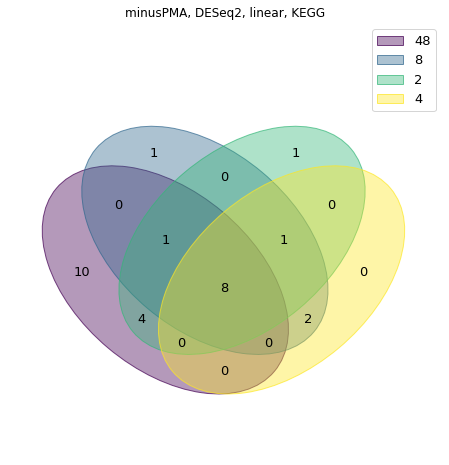

<Figure size 432x288 with 0 Axes>

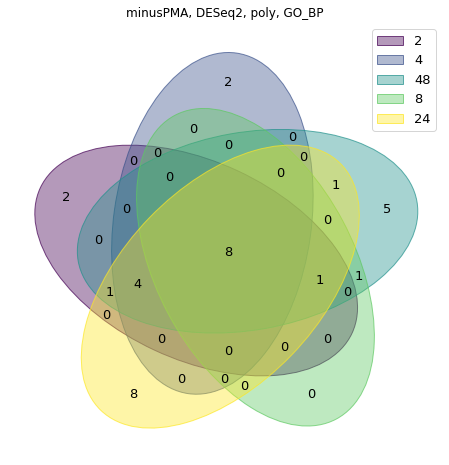

<Figure size 432x288 with 0 Axes>

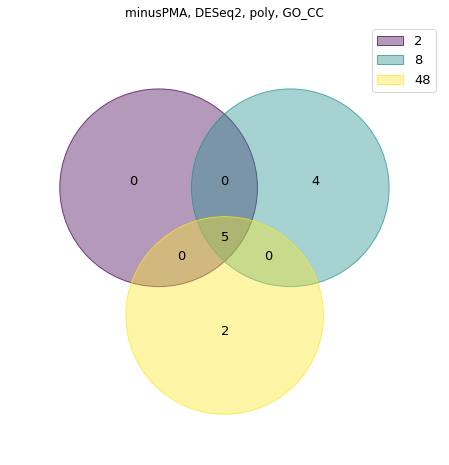

<Figure size 432x288 with 0 Axes>

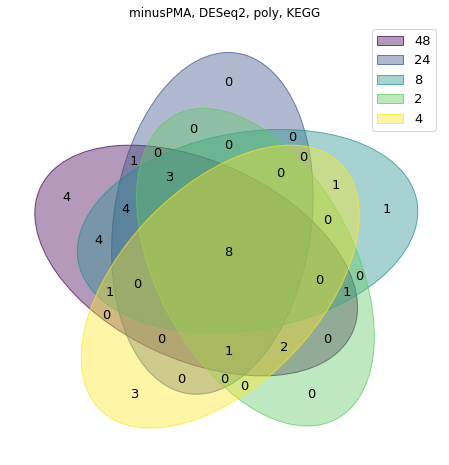

<Figure size 432x288 with 0 Axes>

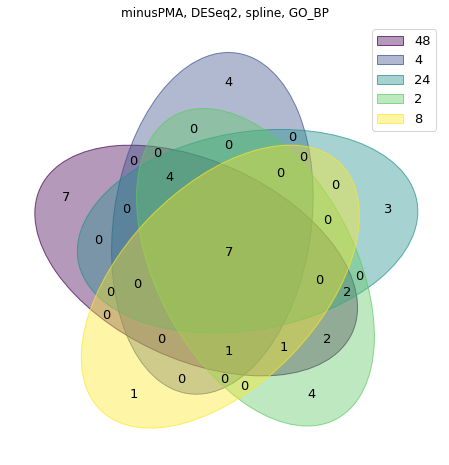

<Figure size 432x288 with 0 Axes>

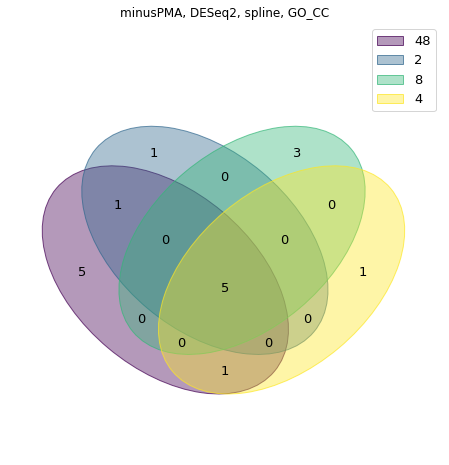

<Figure size 432x288 with 0 Axes>

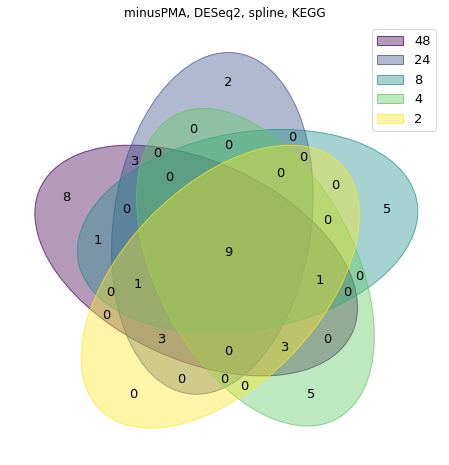

<Figure size 432x288 with 0 Axes>

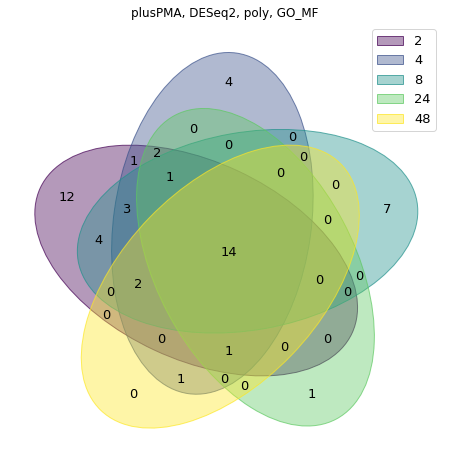

<Figure size 432x288 with 0 Axes>

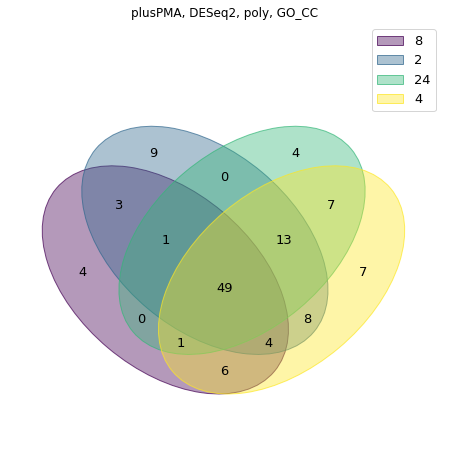

<Figure size 432x288 with 0 Axes>

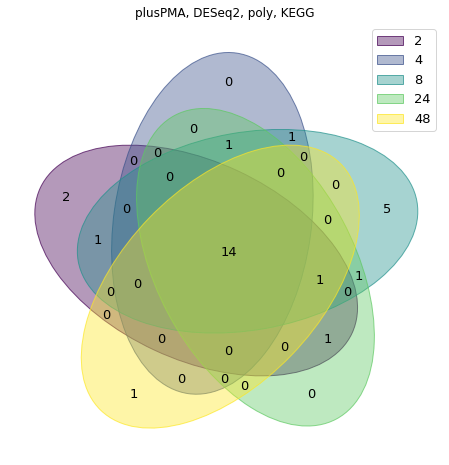

<Figure size 432x288 with 0 Axes>

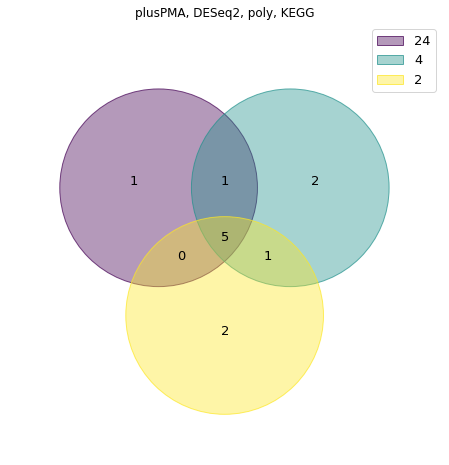

<Figure size 432x288 with 0 Axes>

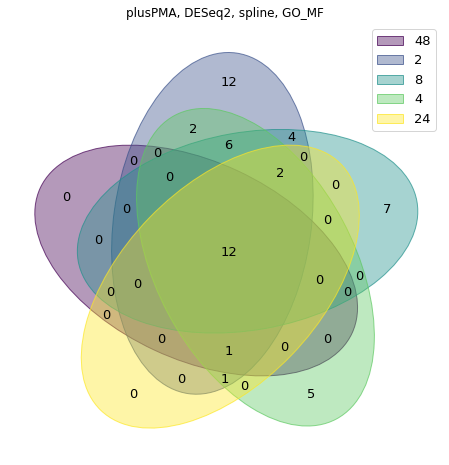

<Figure size 432x288 with 0 Axes>

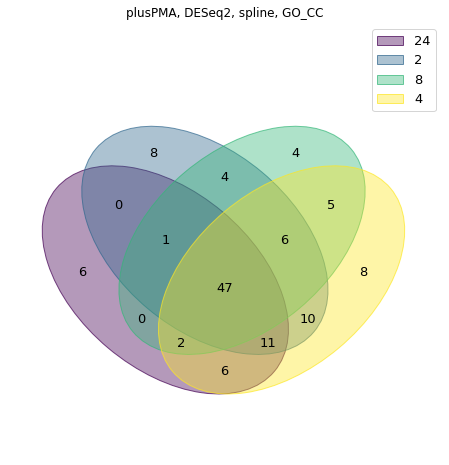

<Figure size 432x288 with 0 Axes>

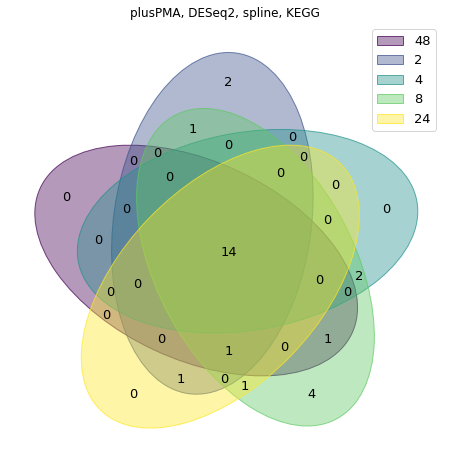

<Figure size 432x288 with 0 Axes>

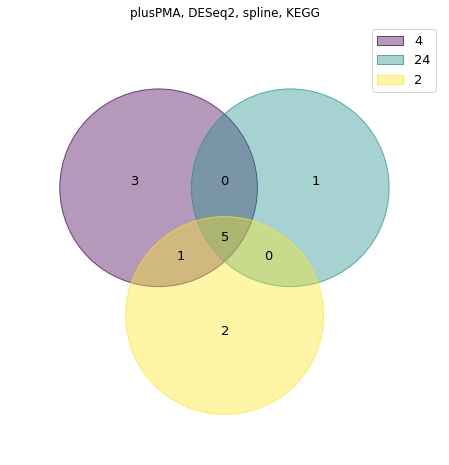

<Figure size 432x288 with 0 Axes>

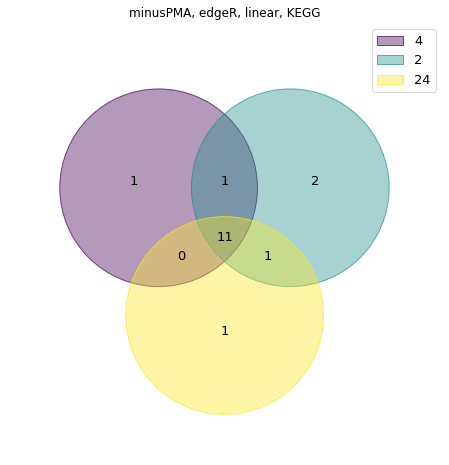

<Figure size 432x288 with 0 Axes>

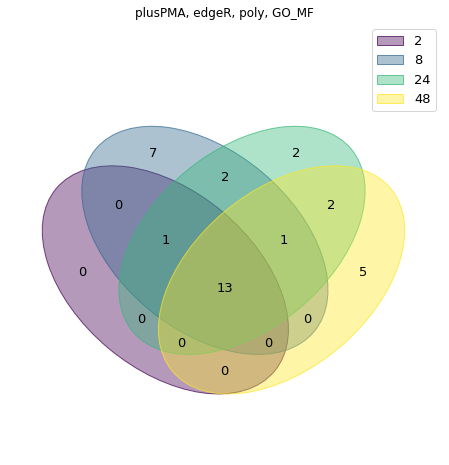

<Figure size 432x288 with 0 Axes>

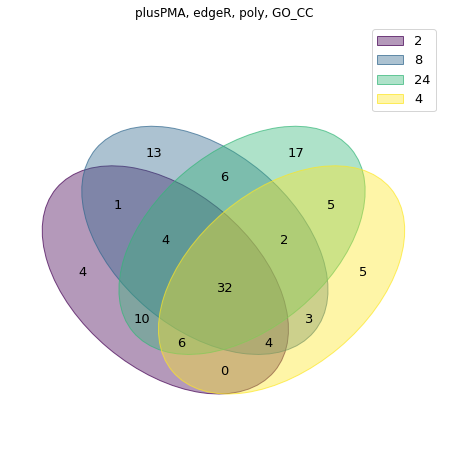

<Figure size 432x288 with 0 Axes>

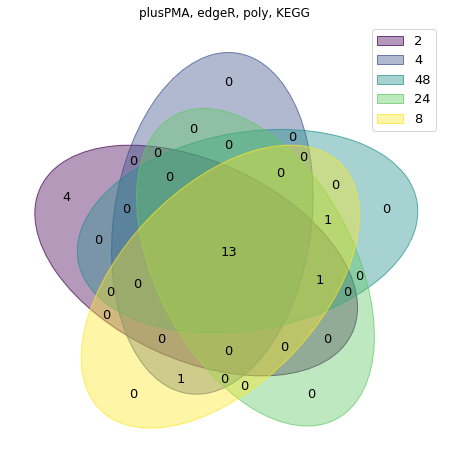

<Figure size 432x288 with 0 Axes>

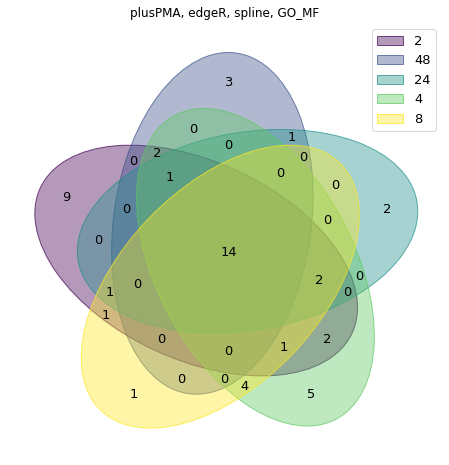

<Figure size 432x288 with 0 Axes>

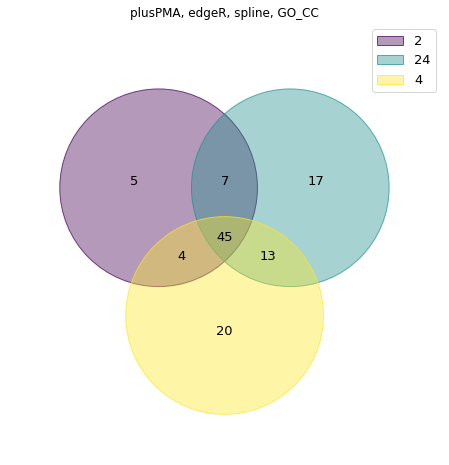

<Figure size 432x288 with 0 Axes>

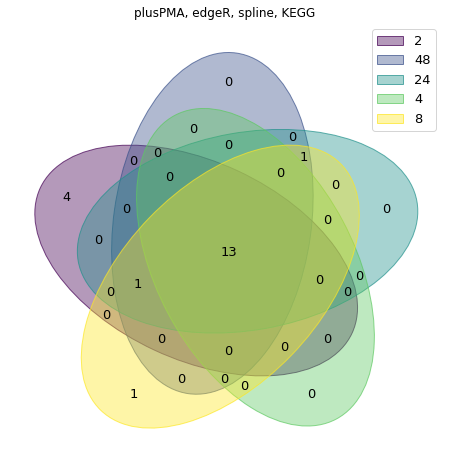

<Figure size 432x288 with 0 Axes>

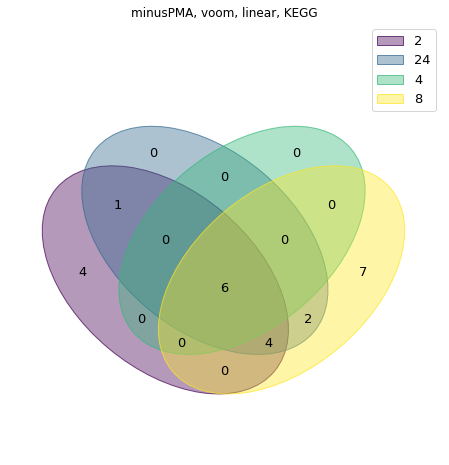

<Figure size 432x288 with 0 Axes>

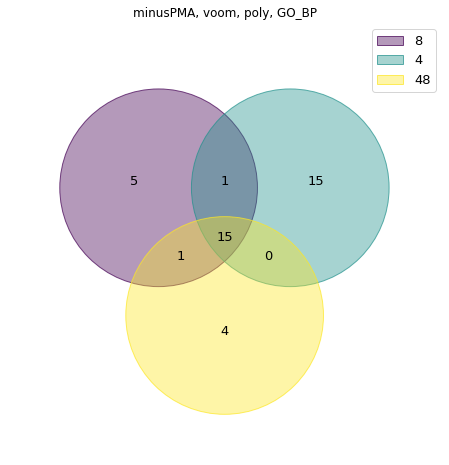

<Figure size 432x288 with 0 Axes>

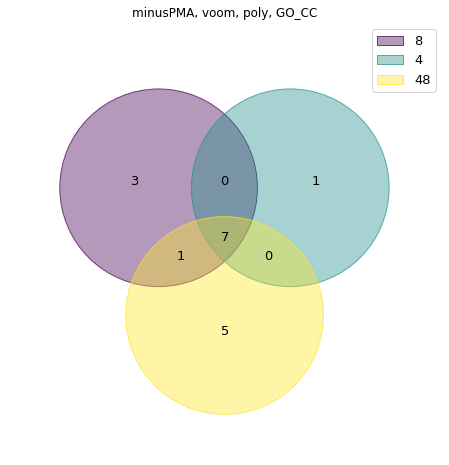

<Figure size 432x288 with 0 Axes>

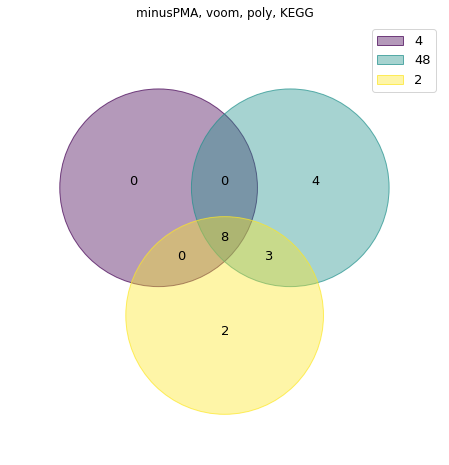

<Figure size 432x288 with 0 Axes>

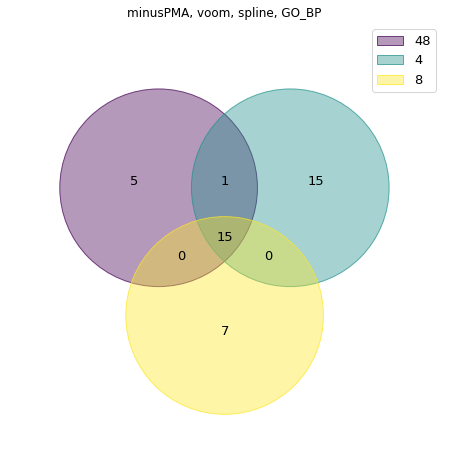

<Figure size 432x288 with 0 Axes>

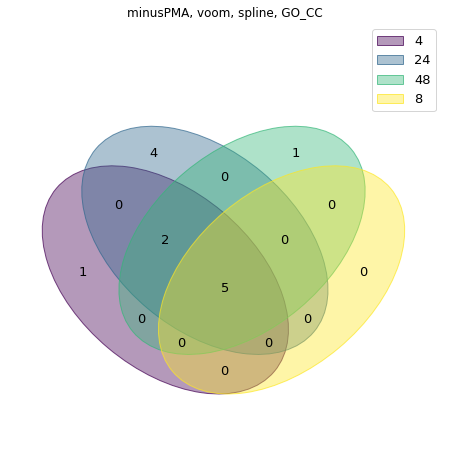

<Figure size 432x288 with 0 Axes>

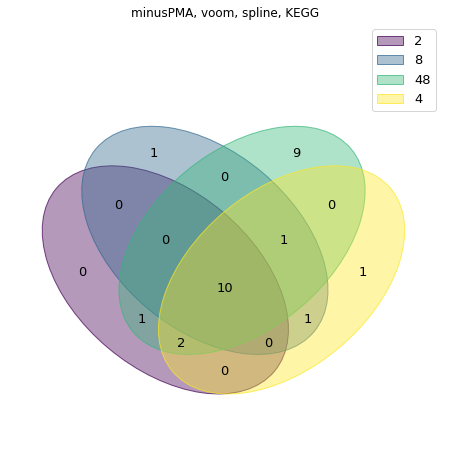

<Figure size 432x288 with 0 Axes>

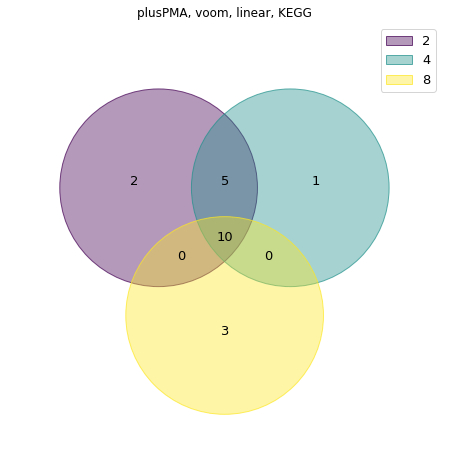

<Figure size 432x288 with 0 Axes>

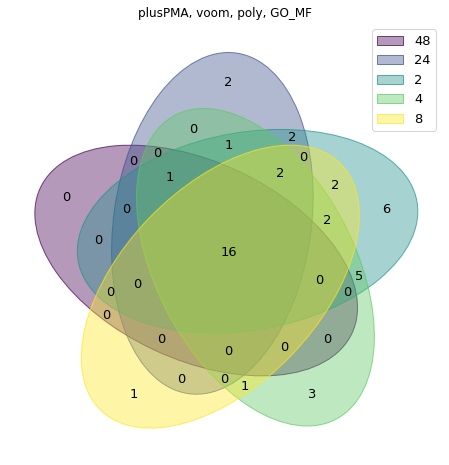

<Figure size 432x288 with 0 Axes>

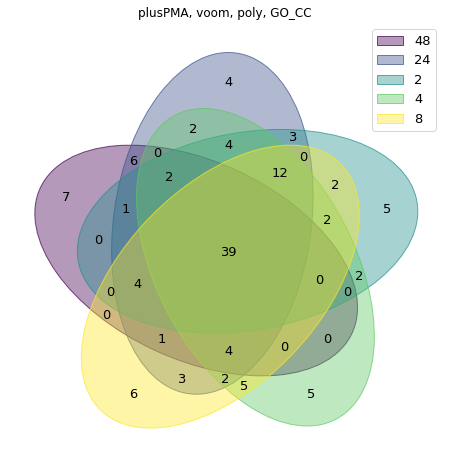

<Figure size 432x288 with 0 Axes>

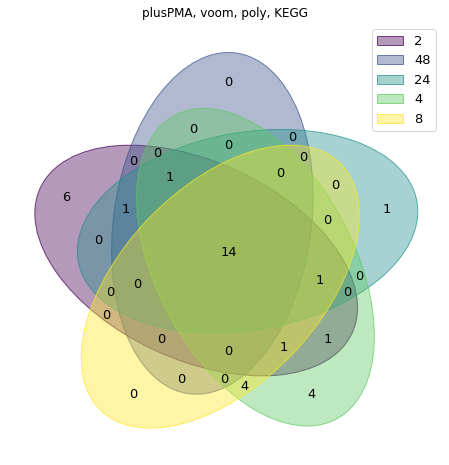

<Figure size 432x288 with 0 Axes>

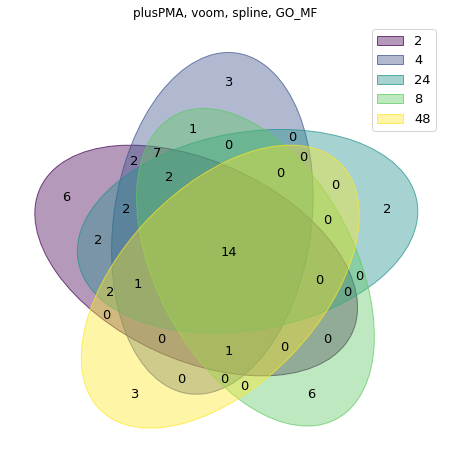

<Figure size 432x288 with 0 Axes>

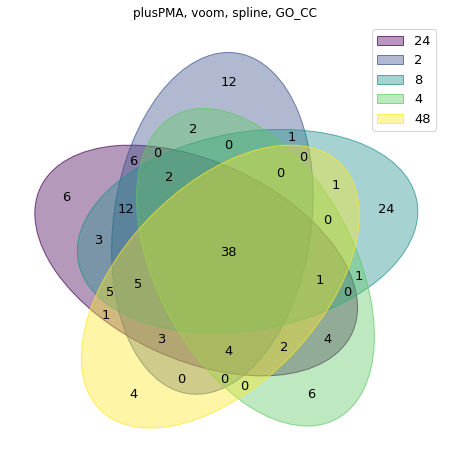

<Figure size 432x288 with 0 Axes>

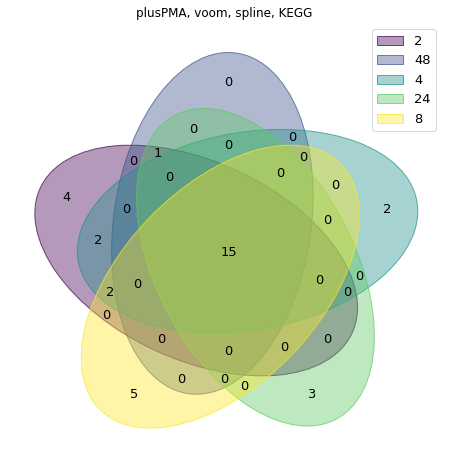

In [136]:
freq_const_time = {}
freq_const_time['GO_BP']={}
freq_const_time['GO_MF']={}
freq_const_time['GO_CC']={}
freq_const_time['KEGG']={}
minus_freq_const_time = {}
minus_freq_const_time['GO_BP']={}
minus_freq_const_time['GO_MF']={}
minus_freq_const_time['GO_CC']={}
minus_freq_const_time['KEGG']={}
plus_freq_const_time = {}
plus_freq_const_time['GO_BP']={}
plus_freq_const_time['GO_MF']={}
plus_freq_const_time['GO_CC']={}
plus_freq_const_time['KEGG']={}

path = ""
output_path = ""
component_content = {}
for cond in components_dict_filtered_const_time_2000:
    pma_type, method, regr_type, go_type = cond.split('-')
    for i, component in enumerate(components_dict_filtered_const_time_2000[cond]):
        id_genes_stat = {'cond':[], 'cluster':[], 'path_id':[], 'path':[], 'genes':[]}
        nodes = set()
        descriptions = []
        results = {}
        for edge in component:
            nodes.add(edge[0])
            nodes.add(edge[1])
        for node in nodes:
            cond, cluster = node.split('_')
            table = pd.read_csv(f"{path}\\{pma_type}_{method}_conc_{cond}_cluster{cluster}_{go_type}_{regr_type}_2000.csv", sep = '\t')
            for y,row in table.iterrows():
                id_genes_stat['cond'].append(cond)
                id_genes_stat['cluster'].append(cluster)
                id_genes_stat['path_id'].append(row['ID'])
                id_genes_stat['path'].append(row['Description'])
                id_genes_stat['genes'].append(row['geneID'])
            if cond not in results:
                results[cond] = set()
            results[cond].update(set(table['ID']))
            descriptions.append(set(table['Description']))
        plt.figure(facecolor='white').clf() #figsize=(20,20),
        inter = set.union(*descriptions)
        venn(results)
        plt.title(f"{pma_type}, {method}, {regr_type}, {go_type}")
        plt.savefig(f'{output_path}\\{pma_type}_{method}_const_time_{regr_type}_{go_type}_{i}_venn_2000.png')
        pd.DataFrame(inter).to_csv(f'{output_path}\\{pma_type}_{method}_const_time_{regr_type}_{go_type}_{i}_2000.csv',
                                   header = False,
                                   index = False)
        pd.DataFrame(id_genes_stat).to_csv(f'{output_path}\\{pma_type}_{method}_const_time_{regr_type}_{go_type}_{i}_id_genes_stat_2000.csv',
                                   sep = '\t',
                                   header = True,
                                   index = False)  
        component_content[f'{pma_type}_{method}_{regr_type}_{go_type}_{i}_2000'] = inter
        for p in inter:
            if p not in freq_const_time[go_type]:
                freq_const_time[go_type][p] = 0
            freq_const_time[go_type][p]+=1
            if pma_type =='minusPMA':
                if p not in minus_freq_const_time[go_type]:
                    minus_freq_const_time[go_type][p] = 0
                minus_freq_const_time[go_type][p]+=1
            if pma_type =='plusPMA':
                if p not in plus_freq_const_time[go_type]:
                    plus_freq_const_time[go_type][p] = 0
                plus_freq_const_time[go_type][p]+=1               

C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:110: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


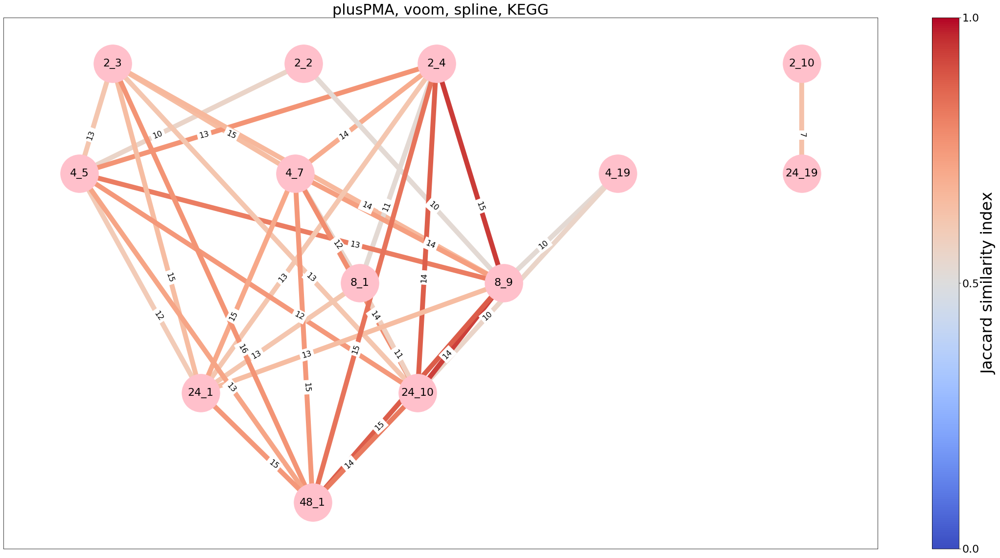

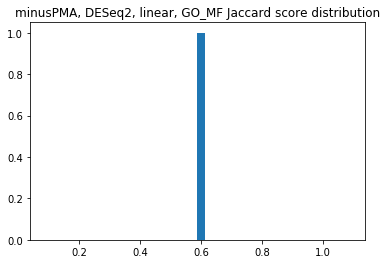

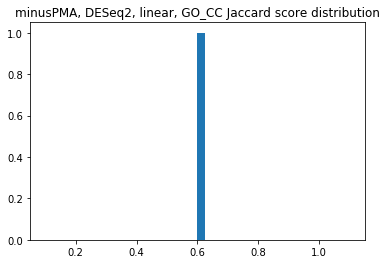

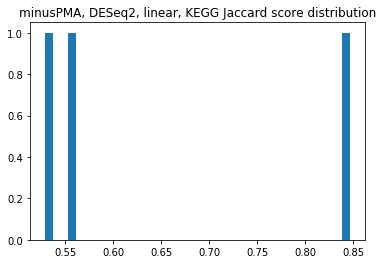

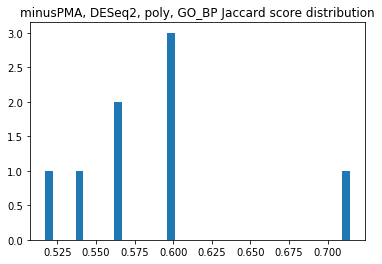

...

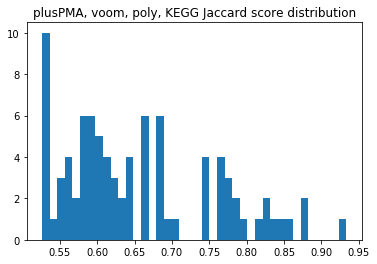

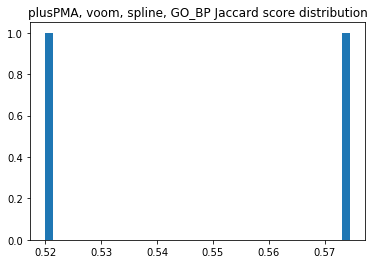

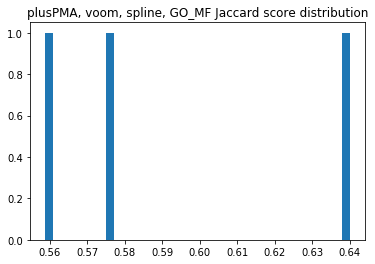

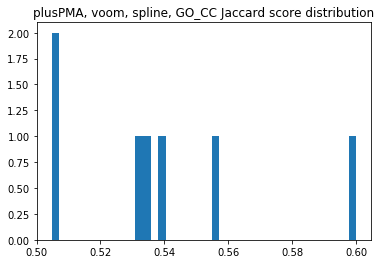

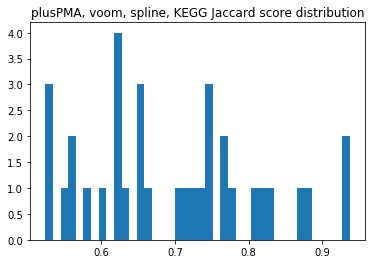

In [14]:
path = ""
path_path = ""
output_path = ""
output_path2 = ""
methods = ['DESeq2', 'edgeR', 'voom']
pma_types = ['minus','plus']
regr_types = ['linear','poly','spline']
enr_types = ['GO_BP', 'GO_MF', 'GO_CC', 'KEGG']
components_dict_time = {}
import networkx as nx
for method in methods:
    for pma_type in pma_types:
        for regr_type in regr_types:
            for enr_type in enr_types:
                G = nx.DiGraph()

                concs = ["2","4","8","24","48"]
                weights = {}
                for i in range(len(concs))[1:]:
                    current_conc = concs[i]
                    prev_concs = concs[:i]
                    if not prev_concs:
                        continue
                    for prev_conc in prev_concs:
                        prev_conc_df = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_{prev_conc}_clusters_{regr_type}.csv', sep = '\t')
                        current_conc_df = pd.read_csv(f'{path}/{pma_type}PMA_{method}_conc_{current_conc}_clusters_{regr_type}.csv', sep = '\t')
                        prev_cluster = set(prev_conc_df['cluster'])
                        current_cluster = set(current_conc_df['cluster'])
                        prev_conc_dict = {}
                        for cluster in prev_cluster:
                            #print(f"{path_path}//{pma_type}PMA_{method}_time_{prev_conc}_cluster{cluster}_{enr_type}_{regr_type}.csv")
                            go_bp = pd.read_csv(f"{path_path}//{pma_type}PMA_{method}_conc_{prev_conc}_cluster{cluster}_{enr_type}_{regr_type}.csv",sep = '\t')
                            for jj, row in go_bp.iterrows():
                                BgRatio[row['Description']] = row['BgRatio'].split('/')[0]
                            prev_conc_dict[cluster] = set(go_bp['ID'])

                        current_conc_dict = {}
                        for cluster in current_cluster:
                            #print(f"{path_path}//{pma_type}PMA_{method}_time_{current_conc}_cluster{cluster}_{enr_type}_{regr_type}.csv")
                            go_bp = pd.read_csv(f"{path_path}//{pma_type}PMA_{method}_conc_{current_conc}_cluster{cluster}_{enr_type}_{regr_type}.csv",sep = '\t')
                            for jj, row in go_bp.iterrows():
                                BgRatio[row['Description']] = row['BgRatio'].split('/')[0]
                            current_conc_dict[cluster] = set(go_bp['ID'])

                        intersection_dict = {}
                        intersection_len_dict = {}
                        for prev_cluster in prev_conc_dict:
                            for current_cluster in current_conc_dict:
                                length = len(list(set(prev_conc_dict[prev_cluster]) & set(current_conc_dict[current_cluster])))
                                if length > 2:
                                    inter_cluster = str(prev_cluster)+"_"+str(current_cluster)
                                    jaccard = compute_jaccard(set(prev_conc_dict[prev_cluster]), set(current_conc_dict[current_cluster]))
                                    if jaccard > 0.5:
                                        intersection_dict[inter_cluster] = jaccard
                                        intersection_len_dict[inter_cluster] = length
                                        jaccard_str = f"{round(jaccard,2)}"
                                        G.add_edge(f"{prev_conc}_{prev_cluster}", f"{current_conc}_{current_cluster}", label =f"{length}")
                                        weights[(f"{prev_conc}_{prev_cluster}", f"{concs[i]}_{current_cluster}")] = jaccard
                        #https://networkx.org/documentation/stable/auto_examples/drawing/plot_labels_and_colors.html
                if weights == {}:
                    continue
                    
                import matplotlib as mpl
                plt.figure(5,figsize=(40,20),facecolor='white').clf()  

                from networkx.drawing.nx_agraph import write_dot
                from networkx.drawing.nx_pydot import graphviz_layout

                pos = graphviz_layout(G, prog="dot")

                nx.draw_networkx_nodes(G, pos,  node_color="pink", node_size = 6000, fontsize=30)
                nx.draw_networkx_labels(G, pos, font_size=22)

                edges,ws = zip(*weights.items())

                #print(edges)
                # colormap
                cmap = plt.cm.coolwarm

                nx.draw_networkx_edges(G,
                                       pos,
                                       edgelist=edges,
                                       width=10.0,
                                       edge_cmap=cmap,
                                       edge_vmin = 0 ,
                                       edge_vmax = 1,
                                       edge_color=ws,
                                       arrows=True)

                labels = nx.get_edge_attributes(G,'label')

                nx.draw_networkx_edge_labels(G,pos,label_pos=0.35,edge_labels=labels, font_size=16, horizontalalignment="center", 
                                             verticalalignment="center",bbox= dict(alpha=1, color = 'w'))
                from matplotlib.pyplot import figure


                # Normalizer
                norm = mpl.colors.Normalize(vmin=0, vmax=1)

                # creating ScalarMappable
                sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
                sm.set_array([])

                cb = plt.colorbar(sm, ticks=[0,0.5,1])
                cb.set_label(label="Jaccard similarity index", size=32)
                cb.ax.tick_params(labelsize=22)

                plt.title(f"{pma_type}PMA, {method}, {regr_type}, {enr_type}", fontsize=30)
                plt.savefig(f"{output_path}//{pma_type}PMA_{method}_{regr_type}_const_time_{enr_type}.png",bbox_inches='tight')
                plt.figure().clf()
                plt.hist(ws, bins=40)  # density=False would make counts
                plt.title(f"{pma_type}PMA, {method}, {regr_type}, {enr_type} Jaccard score distribution")
                plt.savefig(f"{output_path2}//{pma_type}PMA_{method}_{regr_type}_{enr_type}_const_time_distribution.png",bbox_inches='tight')
                edges = set(G.edges)
                graph = {}

                for v1, v2 in edges:
                    if v1 not in graph:
                        graph[v1] = set()
                    graph[v1].add(v2)
                    if v2 not in graph:
                        graph[v2] = set()
                    graph[v2].add(v1)
                components = []
                for component in connected_components(graph):
                    c = set(component)
                    components.append([edge for edge in edges
                                            if c.intersection(edge)])
                components_dict_time[f'{pma_type}PMA-{method}-{regr_type}-{enr_type}'] = components
                
components_dict_filtered_const_time = {}
for cond in components_dict_time:
    for component in components_dict_time[cond]:
        nodes_set = set()
        for edge in component:
            nodes_set.add(edge[0].split('_')[0])
            nodes_set.add(edge[1].split('_')[0])
        if len(nodes_set) > 2:
            if cond not in components_dict_filtered_const_time:
                components_dict_filtered_const_time[cond] = []
            components_dict_filtered_const_time[cond].append(component)


In [15]:
name = 'minusPMA-DESeq2-poly-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')
    
name = 'minusPMA-DESeq2-spline-GO_BP'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_BP.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'minusPMA-edgeR-linear-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'minusPMA-DESeq2-linear-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')
name = 'minusPMA-edgeR-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')
name = 'minusPMA-voom-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')
name = 'minusPMA-voom-linear-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'minusPMA-DESeq2-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')
name = 'minusPMA-DESeq2-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    minus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')
    
name = 'plusPMA-voom-linear-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-edgeR-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-voom-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')
    
name = 'plusPMA-DESeq2-poly-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-DESeq2-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')
    
name = 'plusPMA-edgeR-spline-KEGG'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_KEGG.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')


name = 'plusPMA-DESeq2-poly-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-voom-poly-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][1]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')
    
name = 'plusPMA-voom-spline-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-voom-poly-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-DESeq2-poly-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')

name = 'plusPMA-DESeq2-spline-GO_MF'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_MF.add(f'{pma}_{method}_time_{cond2}_{regr}_{cluster2}.png')


name = 'plusPMA-DESeq2-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}.png')
name = 'plusPMA-DESeq2-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}.png')
name = 'plusPMA-voom-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}.png')
name = 'plusPMA-voom-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}.png')
name = 'plusPMA-edgeR-spline-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}.png')
name = 'plusPMA-edgeR-poly-GO_CC'
pma, method, regr, go_type = name.split('-')
for edge in components_dict_filtered_const_time[name][0]:
    cond1, cluster1 = edge[0].split('_')
    cond2, cluster2 = edge[1].split('_')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond1}_{regr}_{cluster1}.png')
    plus_conc_const_GO_CC.add(f'{pma}_{method}_conc_{cond2}_{regr}_{cluster2}.png')
    
    

C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:26: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<Figure size 432x288 with 0 Axes>

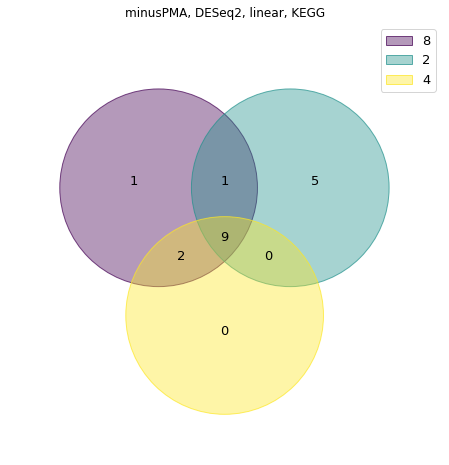

<Figure size 432x288 with 0 Axes>

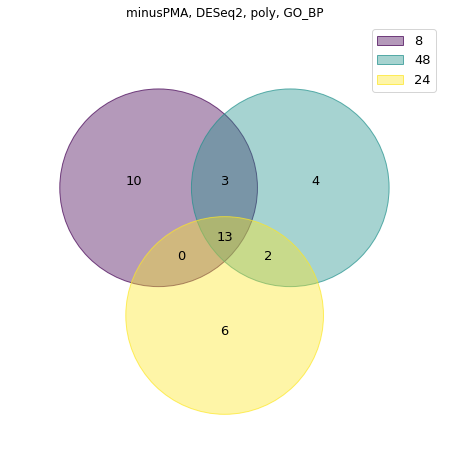

<Figure size 432x288 with 0 Axes>

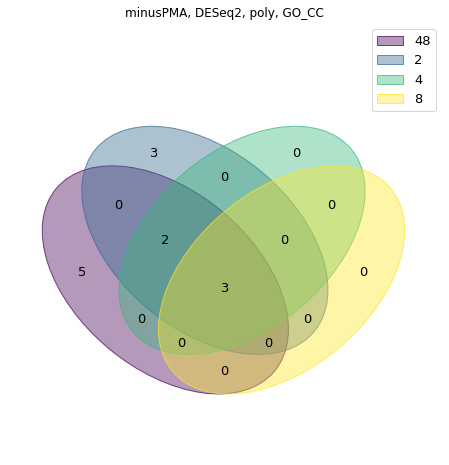

<Figure size 432x288 with 0 Axes>

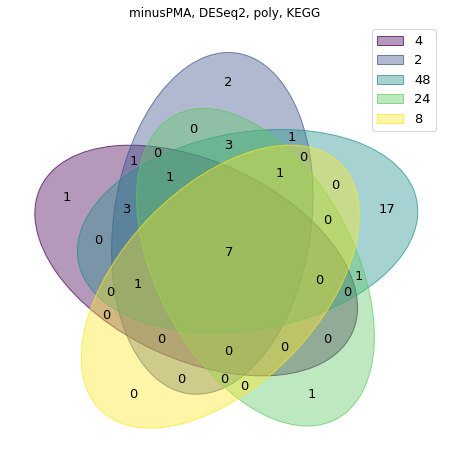

<Figure size 432x288 with 0 Axes>

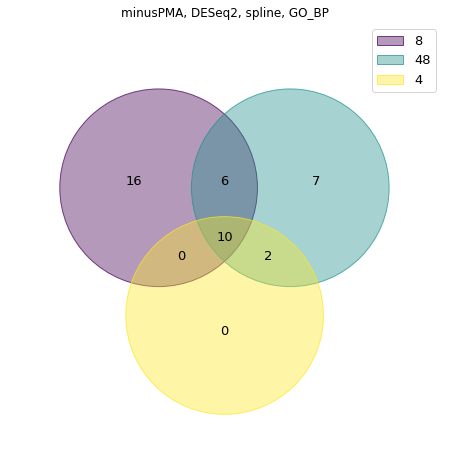

<Figure size 432x288 with 0 Axes>

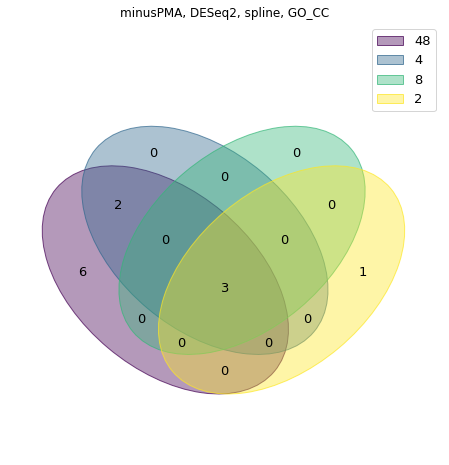

<Figure size 432x288 with 0 Axes>

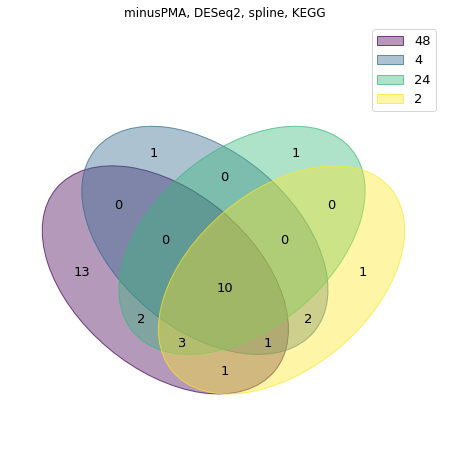

<Figure size 432x288 with 0 Axes>

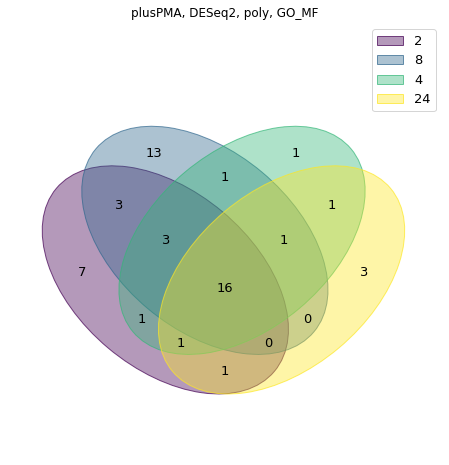

<Figure size 432x288 with 0 Axes>

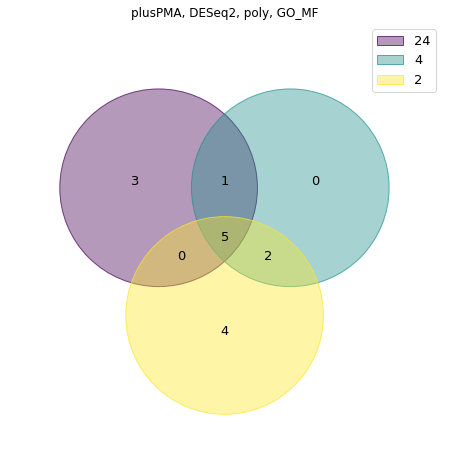

<Figure size 432x288 with 0 Axes>

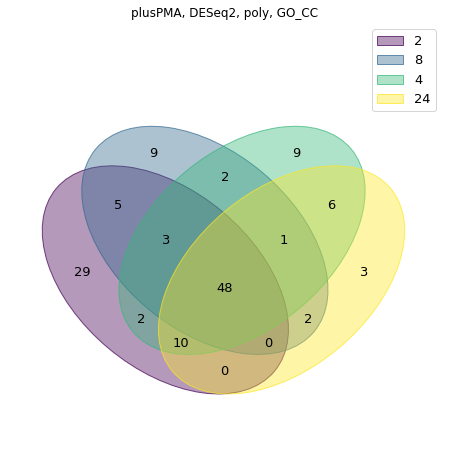

<Figure size 432x288 with 0 Axes>

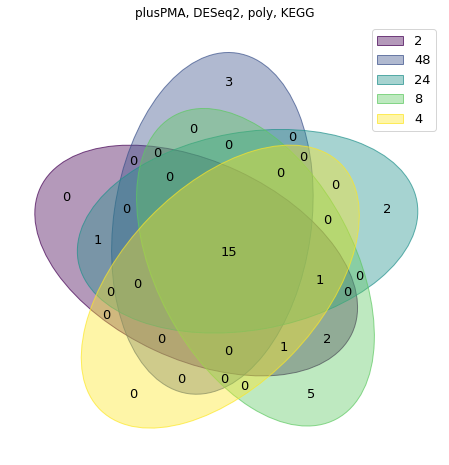

<Figure size 432x288 with 0 Axes>

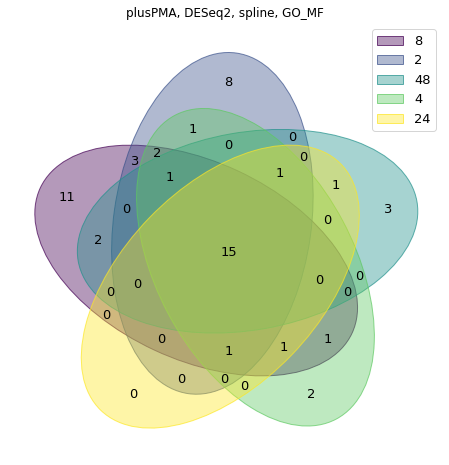

<Figure size 432x288 with 0 Axes>

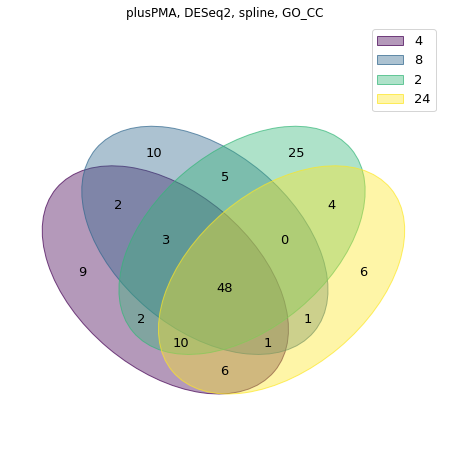

<Figure size 432x288 with 0 Axes>

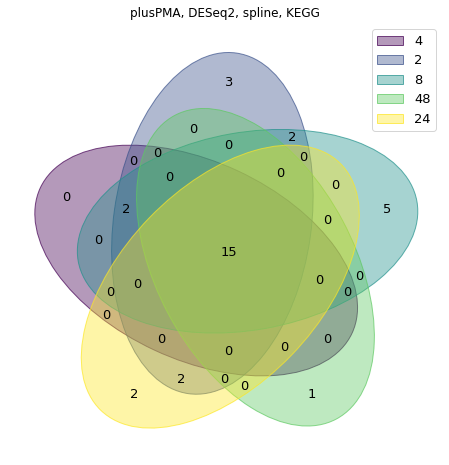

<Figure size 432x288 with 0 Axes>

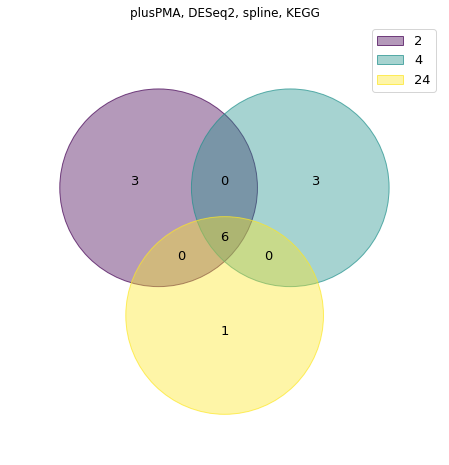

<Figure size 432x288 with 0 Axes>

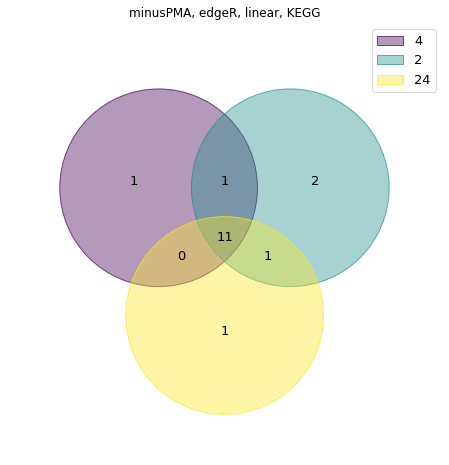

<Figure size 432x288 with 0 Axes>

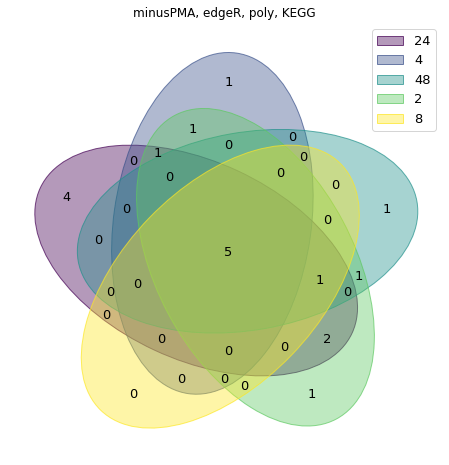

<Figure size 432x288 with 0 Axes>

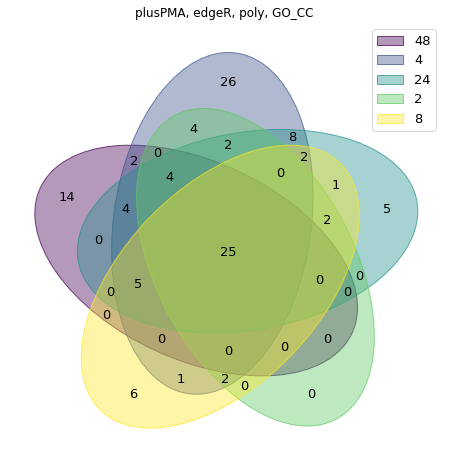

<Figure size 432x288 with 0 Axes>

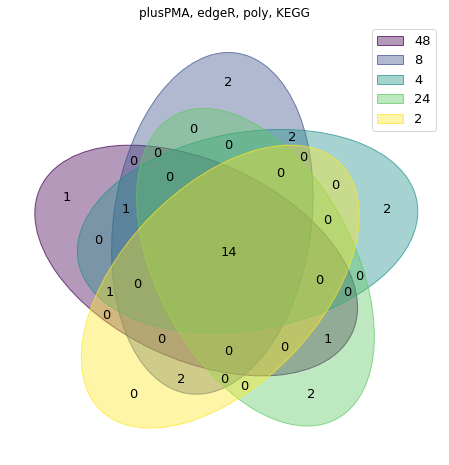

<Figure size 432x288 with 0 Axes>

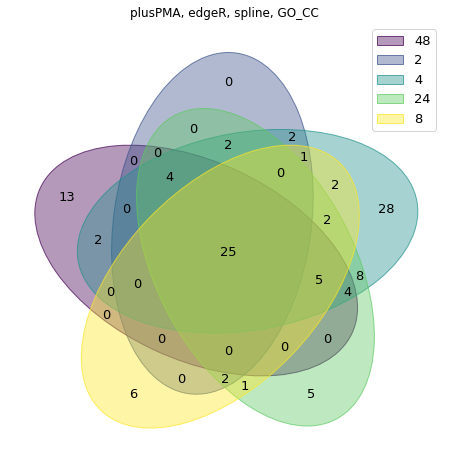

<Figure size 432x288 with 0 Axes>

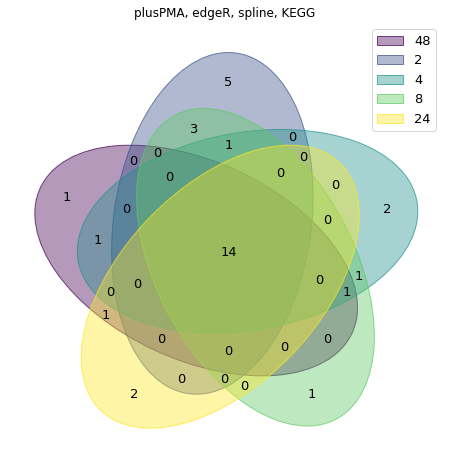

<Figure size 432x288 with 0 Axes>

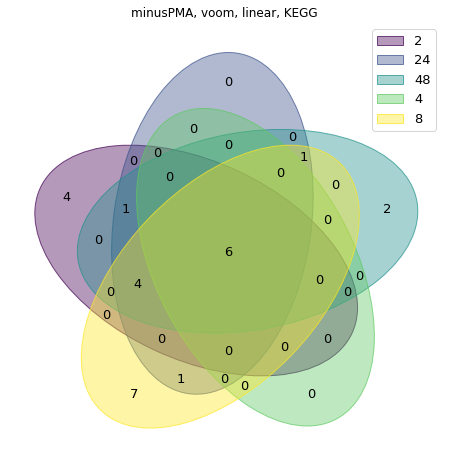

<Figure size 432x288 with 0 Axes>

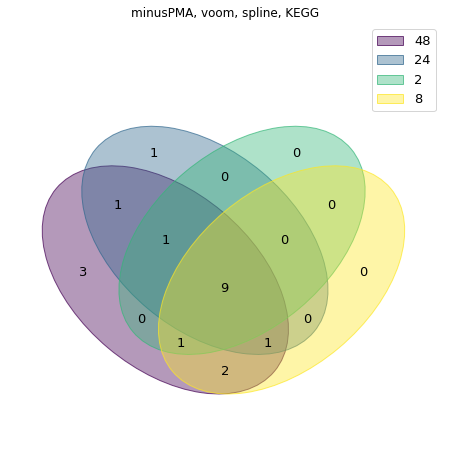

<Figure size 432x288 with 0 Axes>

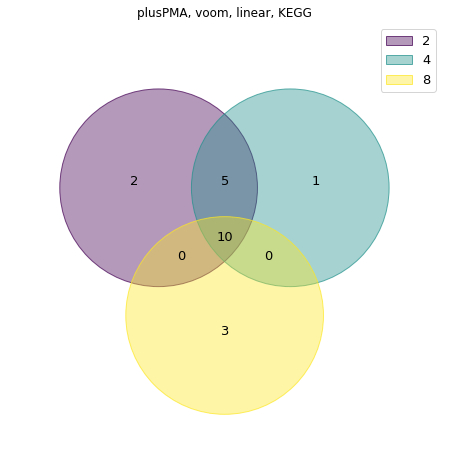

<Figure size 432x288 with 0 Axes>

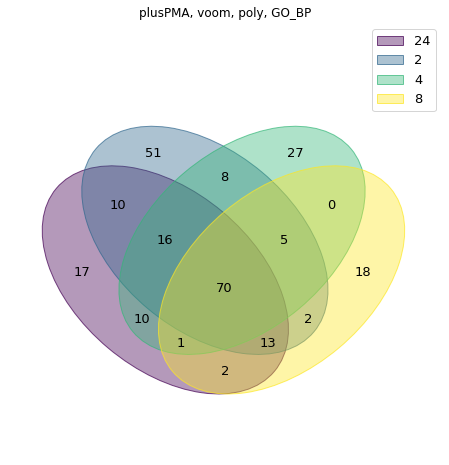

<Figure size 432x288 with 0 Axes>

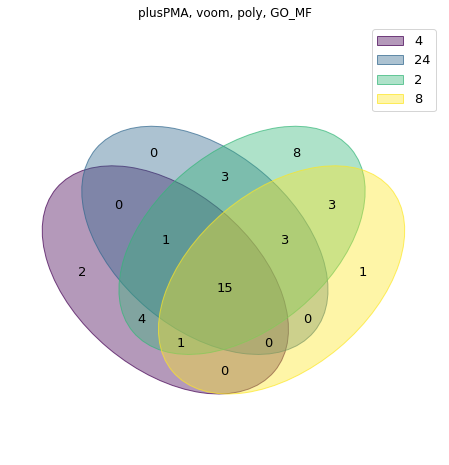

<Figure size 432x288 with 0 Axes>

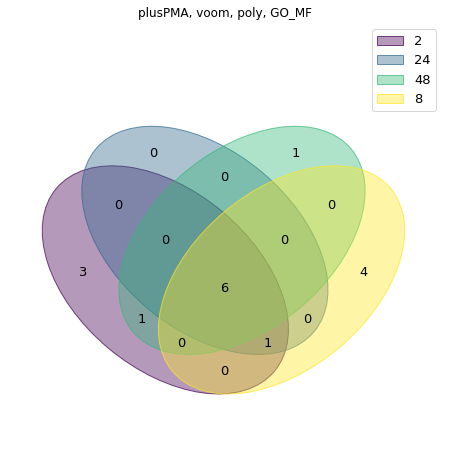

<Figure size 432x288 with 0 Axes>

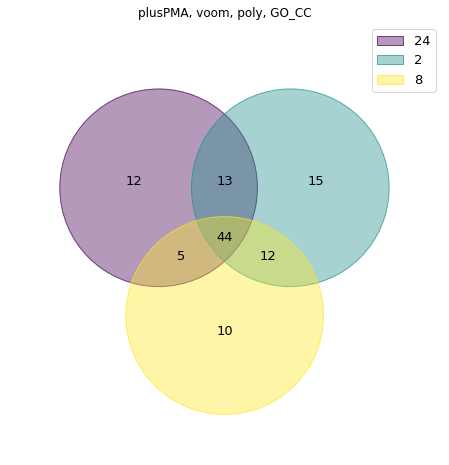

<Figure size 432x288 with 0 Axes>

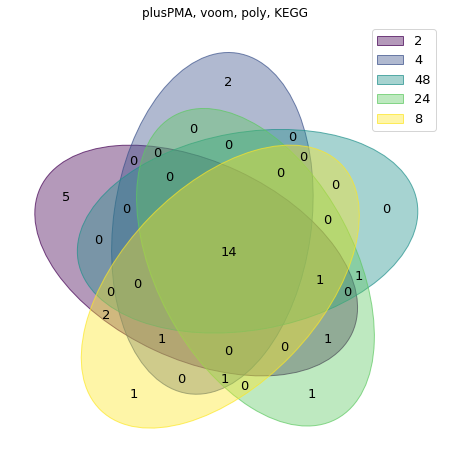

<Figure size 432x288 with 0 Axes>

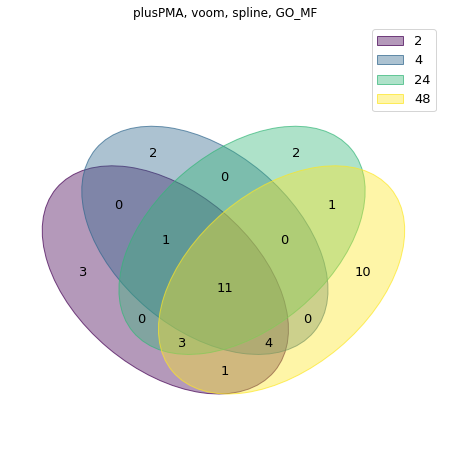

<Figure size 432x288 with 0 Axes>

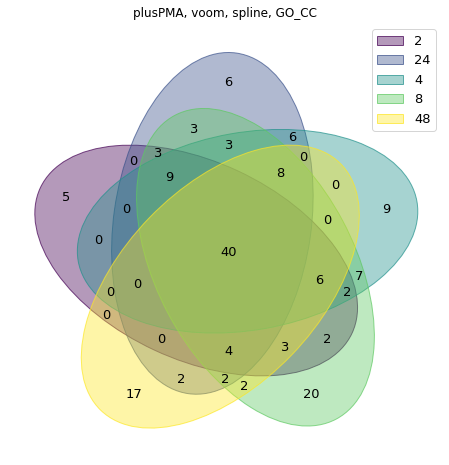

<Figure size 432x288 with 0 Axes>

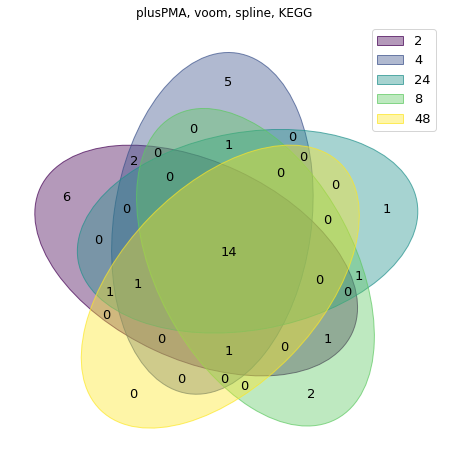

In [181]:
path = ""
output_path = ""
for cond in components_dict_filtered_const_time:
    pma_type, method, regr_type, go_type = cond.split('-')
    for i,component in enumerate(components_dict_filtered_const_time[cond]):
        id_genes_stat = {'cond':[], 'cluster':[], 'path_id':[], 'path':[], 'genes':[]}
        nodes = set()
        descriptions = []
        results = {}
        for edge in component:
            nodes.add(edge[0])
            nodes.add(edge[1])
        for node in nodes:
            cond, cluster = node.split('_')
            table = pd.read_csv(f"{path}\\{pma_type}_{method}_conc_{cond}_cluster{cluster}_{go_type}_{regr_type}.csv", sep = '\t')
            for y,row in table.iterrows():
                id_genes_stat['cond'].append(cond)
                id_genes_stat['cluster'].append(cluster)
                id_genes_stat['path_id'].append(row['ID'])
                id_genes_stat['path'].append(row['Description'])
                id_genes_stat['genes'].append(row['geneID'])
            if cond not in results:
                results[cond] = set()
            results[cond].update(set(table['ID']))
            descriptions.append(set(table['Description']))
        plt.figure(facecolor='white').clf() #figsize=(20,20),
        inter = set.union(*descriptions)
        venn(results)
        plt.title(f"{pma_type}, {method}, {regr_type}, {go_type}")
        plt.savefig(f'{output_path}\\{pma_type}_{method}_const_time_{regr_type}_{go_type}_{i}_venn.png')
        pd.DataFrame(inter).to_csv(f'{output_path}\\{pma_type}_{method}_const_time_{regr_type}_{go_type}_{i}.csv',
                                   header = False,
                                   index = False)
        pd.DataFrame(id_genes_stat).to_csv(f'{output_path}\\{pma_type}_{method}_const_time_{regr_type}_{go_type}_{i}_id_genes_stat.csv',
                                   sep = '\t',
                                   header = True,
                                   index = False)
        component_content[f'{pma_type}_{method}_{regr_type}_{go_type}_{i}'] = inter
        for p in inter:
            if go_type not in freq_const_time:
                freq_const_time[go_type] = {}
            if p not in freq_const_time[go_type]:
                freq_const_time[go_type][p] = 0
            freq_const_time[go_type][p]+=1
            if pma_type =='minusPMA':
                if go_type not in minus_freq_const_time:
                    minus_freq_const_time[go_type] = {}
                if p not in minus_freq_const_time[go_type]:
                    minus_freq_const_time[go_type][p] = 0
                minus_freq_const_time[go_type][p]+=1
            if pma_type =='plusPMA':
                if go_type not in plus_freq_const_time:
                    plus_freq_const_time[go_type] = {}
                if p not in plus_freq_const_time[go_type]:
                    plus_freq_const_time[go_type][p] = 0
                plus_freq_const_time[go_type][p]+=1     
            
component_content_jac = {}
for component1 in component_content:
    for component2 in component_content:
        component_content_jac[component1+"|"+component2] = compute_jaccard(component_content[component1],component_content[component2])

In [90]:
k_const_time = []
for j in component_content_jac:
    if component_content_jac[j] > 0.7:
        a,b = j.split('|')
        if a == b:
            continue
        found = False
        for s in k_const_time:
            if a in s or b in s:
                s.add(a)
                s.add(b)
                found = True
                break
        if not found:
            k_const_time.append({a,b})
            
freq_filtered = {}
for go_type in freq_const_time:
    freq_filtered[go_type] ={}
    num_path = 0
    for path in freq_const_time[go_type]:
        if freq_const_time[go_type][path] > 5:
            freq_filtered[go_type][path] = freq_const_time[go_type][path]
graph_picture_set = set()
for go_type in freq_filtered:
    for path in freq_filtered[go_type]:
        for component in component_content:
            if go_type in component:
                if path in component_content[component]:
                    graph_picture_set.add(component)

In [91]:
k_const_time = [{'minusPMA_DESeq2_poly_KEGG_0',
  'minusPMA_DESeq2_poly_KEGG_0_2000',
  'minusPMA_DESeq2_spline_KEGG_0',
  'minusPMA_DESeq2_spline_KEGG_0_2000',
  'minusPMA_voom_spline_KEGG_0_2000'},
 {'plusPMA_DESeq2_poly_GO_MF_0_2000',
  'plusPMA_DESeq2_spline_GO_MF_0_2000',
  'plusPMA_voom_spline_GO_MF_0_2000'},
 {'plusPMA_DESeq2_poly_KEGG_0',
  'plusPMA_DESeq2_poly_KEGG_0_2000',
  'plusPMA_DESeq2_spline_KEGG_0',
  'plusPMA_DESeq2_spline_KEGG_0_2000',
  'plusPMA_edgeR_poly_KEGG_0',
  'plusPMA_edgeR_spline_KEGG_0',
  'plusPMA_voom_poly_KEGG_0',
  'plusPMA_voom_spline_KEGG_0',
  'plusPMA_voom_spline_KEGG_0_2000'},
 {'plusPMA_DESeq2_poly_KEGG_1_2000', 'plusPMA_DESeq2_spline_KEGG_1_2000'},
 {'minusPMA_edgeR_linear_KEGG_0',
  'minusPMA_edgeR_linear_KEGG_0_2000',
  'minusPMA_edgeR_poly_KEGG_0',
  'minusPMA_voom_poly_KEGG_0_2000',
  'minusPMA_voom_spline_KEGG_0'},
 {'plusPMA_edgeR_poly_KEGG_0_2000',
  'plusPMA_edgeR_spline_KEGG_0_2000',
  'plusPMA_voom_linear_KEGG_0',
  'plusPMA_voom_linear_KEGG_0_2000'},
 {'minusPMA_voom_linear_KEGG_0', 'minusPMA_voom_linear_KEGG_0_2000'},
 {'plusPMA_voom_poly_GO_MF_0', 'plusPMA_voom_poly_GO_MF_0_2000'},
 {'plusPMA_DESeq2_poly_GO_MF_0', 'plusPMA_DESeq2_spline_GO_MF_0'}]

In [392]:
components_dict_filtered_const_time_good = {}
components_dict_filtered_const_time_good_2000 = {}

for name in components_dict_filtered_const_time:
    components_dict_filtered_const_time_good['_'.join(name.split('-'))] = components_dict_filtered_const_time[name]
    
for name in components_dict_filtered_const_time_2000:
    components_dict_filtered_const_time_good_2000['_'.join(name.split('-'))] = components_dict_filtered_const_time_2000[name]
    
for i, group in enumerate(k_const_time):
    print(f'Group {i+1}')
    test = list(group)[0]
    if '_CC' in test:
        continue
        
    for file in group:
        is_top = False
        tokens = file.split('_')
        if tokens[-1] == '2000':
            is_top = True
            tokens = tokens[:-1]
        component_id = int(tokens[-1])
        tokens = tokens[:-1]
        if is_top:
            comp = components_dict_filtered_const_time_good_2000['_'.join(tokens)][component_id]
        else:
            comp = components_dict_filtered_const_time_good['_'.join(tokens)][component_id]
        nodes = set()
        pictures_names = []
        for edge in comp:
            nodes.add(edge[0])
            nodes.add(edge[1])
        for node in nodes:
            conc, cluster = node.split('_')
            filename = f'{tokens[0]}_{tokens[1]}_conc_{conc}_{tokens[2]}_{cluster}'
            if is_top:
                filename = filename+"_2000"
                
            filename = filename+".png"
            print(filename)

Group 1
minusPMA_DESeq2_conc_4_spline_7_2000.png
minusPMA_DESeq2_conc_4_spline_4_2000.png
minusPMA_DESeq2_conc_8_spline_9_2000.png
minusPMA_DESeq2_conc_2_spline_1_2000.png
minusPMA_DESeq2_conc_48_spline_2_2000.png
minusPMA_DESeq2_conc_48_spline_1_2000.png
minusPMA_DESeq2_conc_4_spline_3_2000.png
minusPMA_DESeq2_conc_8_spline_1_2000.png
minusPMA_DESeq2_conc_24_spline_1_2000.png
minusPMA_DESeq2_conc_4_poly_4_2000.png
minusPMA_DESeq2_conc_8_poly_4_2000.png
minusPMA_DESeq2_conc_2_poly_2_2000.png
minusPMA_DESeq2_conc_2_poly_1_2000.png
minusPMA_DESeq2_conc_48_poly_2_2000.png
minusPMA_DESeq2_conc_48_poly_1_2000.png
minusPMA_DESeq2_conc_4_poly_3_2000.png
minusPMA_DESeq2_conc_8_poly_8_2000.png
minusPMA_DESeq2_conc_24_poly_1_2000.png
minusPMA_DESeq2_conc_48_spline_16.png
minusPMA_DESeq2_conc_48_spline_5.png
minusPMA_DESeq2_conc_4_spline_10.png
minusPMA_DESeq2_conc_24_spline_6.png
minusPMA_DESeq2_conc_2_spline_1.png
minusPMA_DESeq2_conc_4_spline_12.png
minusPMA_DESeq2_conc_4_spline_3.png
minusPMA

In [93]:
components_dict_filtered_const_time_good = {}
components_dict_filtered_const_time_good_2000 = {}

for name in components_dict_filtered_const_time:
    components_dict_filtered_const_time_good['_'.join(name.split('-'))] = components_dict_filtered_const_time[name]
    
for name in components_dict_filtered_const_time_2000:
    components_dict_filtered_const_time_good_2000['_'.join(name.split('-'))] = components_dict_filtered_const_time_2000[name]
        
for i, group in enumerate(k_const_time):
    test = list(group)[0]
    if '_CC' in test:
        continue
    inter_temp_minus = []
    inter_temp_plus = []
    for file in group:
        if 'minus' in file:
            inter_temp_minus.append(component_content[file])
        if 'plus' in file:
            inter_temp_plus.append(component_content[file])
    
        
    tpe = ""
    if 'KEGG' in file:
        tpe = 'KEGG'
    if 'MF' in file:
        tpe = 'GO MF'
    if 'BP' in file:
        tpe = 'GO BP'
    if 'minus' in file:
        pma_type = 'minusPMA'
    if 'plus' in file:
        pma_type = 'plusPMA'
        
    if inter_temp_minus:
        intersect_group_minus = set.intersection(*inter_temp_minus)
    else:
        intersect_group_minus = set()
    if inter_temp_plus:
        intersect_group_plus = set.intersection(*inter_temp_plus)
    else:
        intersect_group_plus = set()
        
    path = ""
    intersect_group_minus = list(intersect_group_minus)
    df = pd.DataFrame({f'Group {i+1}, {tpe}' : intersect_group_minus})
    bgs = []
    for it in intersect_group_minus:
        bgs.append(BgRatio[it])
    df['Gene_in_path'] = bgs
    df.to_csv(f'{path}\\Group {i+1}_minusPMA_const_time.txt', index=False, header = True)
    intersect_group_plus = list(intersect_group_plus)
    df = pd.DataFrame({f'Group {i+1}, {tpe}' : intersect_group_plus})
    bgs = []
    for it in intersect_group_plus:
        bgs.append(BgRatio[it])
    df['Gene_in_path'] = bgs
    df.to_csv(f'{path}\\Group {i+1}_plusPMA_const_time.txt', index=False, header = True)

In [408]:
gs ={'Group 1':
['minusPMA_DESeq2_conc_4_spline_7_2000.png',
'minusPMA_DESeq2_conc_4_spline_4_2000.png',
'minusPMA_DESeq2_conc_8_spline_9_2000.png',
'minusPMA_DESeq2_conc_2_spline_1_2000.png',
'minusPMA_DESeq2_conc_48_spline_2_2000.png',
'minusPMA_DESeq2_conc_48_spline_1_2000.png',
'minusPMA_DESeq2_conc_4_spline_3_2000.png',
'minusPMA_DESeq2_conc_8_spline_1_2000.png',
'minusPMA_DESeq2_conc_24_spline_1_2000.png',
'minusPMA_DESeq2_conc_4_poly_4_2000.png',
'minusPMA_DESeq2_conc_8_poly_4_2000.png',
'minusPMA_DESeq2_conc_2_poly_2_2000.png',
'minusPMA_DESeq2_conc_2_poly_1_2000.png',
'minusPMA_DESeq2_conc_48_poly_2_2000.png',
'minusPMA_DESeq2_conc_48_poly_1_2000.png',
'minusPMA_DESeq2_conc_4_poly_3_2000.png',
'minusPMA_DESeq2_conc_8_poly_8_2000.png',
'minusPMA_DESeq2_conc_24_poly_1_2000.png',
'minusPMA_DESeq2_conc_48_spline_16.png',
'minusPMA_DESeq2_conc_48_spline_5.png',
'minusPMA_DESeq2_conc_4_spline_10.png',
'minusPMA_DESeq2_conc_24_spline_6.png',
'minusPMA_DESeq2_conc_2_spline_1.png',
'minusPMA_DESeq2_conc_4_spline_12.png',
'minusPMA_DESeq2_conc_4_spline_3.png',
'minusPMA_DESeq2_conc_48_spline_15.png',
'minusPMA_voom_conc_2_spline_2_2000.png',
'minusPMA_voom_conc_4_spline_5_2000.png',
'minusPMA_voom_conc_8_spline_13_2000.png',
'minusPMA_voom_conc_48_spline_1_2000.png',
'minusPMA_voom_conc_8_spline_5_2000.png',
'minusPMA_voom_conc_4_spline_3_2000.png',
'minusPMA_voom_conc_48_spline_6_2000.png',
'minusPMA_DESeq2_conc_48_poly_6.png',
'minusPMA_DESeq2_conc_48_poly_12.png',
'minusPMA_DESeq2_conc_4_poly_10.png',
'minusPMA_DESeq2_conc_4_poly_8.png',
'minusPMA_DESeq2_conc_2_poly_6.png',
'minusPMA_DESeq2_conc_48_poly_2.png',
'minusPMA_DESeq2_conc_48_poly_1.png',
'minusPMA_DESeq2_conc_24_poly_8.png',
'minusPMA_DESeq2_conc_2_poly_4.png',
'minusPMA_DESeq2_conc_4_poly_14.png',
'minusPMA_DESeq2_conc_8_poly_12.png'],
'Group 2':
['plusPMA_DESeq2_conc_24_poly_5_2000.png',
'plusPMA_DESeq2_conc_8_poly_7_2000.png',
'plusPMA_DESeq2_conc_2_poly_1_2000.png',
'plusPMA_DESeq2_conc_2_poly_5_2000.png',
'plusPMA_DESeq2_conc_4_poly_1_2000.png',
'plusPMA_DESeq2_conc_48_poly_6_2000.png',
'plusPMA_voom_conc_4_spline_13_2000.png',
'plusPMA_voom_conc_4_spline_5_2000.png',
'plusPMA_voom_conc_8_spline_9_2000.png',
'plusPMA_voom_conc_2_spline_1_2000.png',
'plusPMA_voom_conc_48_spline_1_2000.png',
'plusPMA_voom_conc_2_spline_4_2000.png',
'plusPMA_voom_conc_24_spline_1_2000.png',
'plusPMA_DESeq2_conc_8_spline_7_2000.png',
'plusPMA_DESeq2_conc_2_spline_1_2000.png',
'plusPMA_DESeq2_conc_2_spline_5_2000.png',
'plusPMA_DESeq2_conc_24_spline_4_2000.png',
'plusPMA_DESeq2_conc_4_spline_1_2000.png',
'plusPMA_DESeq2_conc_48_spline_7_2000.png'],
'Group 3':
['plusPMA_edgeR_conc_8_spline_4.png',
'plusPMA_edgeR_conc_2_spline_2.png',
'plusPMA_edgeR_conc_8_spline_7.png',
'plusPMA_edgeR_conc_8_spline_9.png',
'plusPMA_edgeR_conc_2_spline_6.png',
'plusPMA_edgeR_conc_2_spline_1.png',
'plusPMA_edgeR_conc_48_spline_2.png',
'plusPMA_edgeR_conc_2_spline_5.png',
'plusPMA_edgeR_conc_24_spline_8.png',
'plusPMA_edgeR_conc_4_spline_1.png',
'plusPMA_edgeR_conc_24_spline_3.png',
'plusPMA_DESeq2_conc_24_poly_5_2000.png',
'plusPMA_DESeq2_conc_8_poly_3_2000.png',
'plusPMA_DESeq2_conc_48_poly_11_2000.png',
'plusPMA_DESeq2_conc_8_poly_7_2000.png',
'plusPMA_DESeq2_conc_2_poly_1_2000.png',
'plusPMA_DESeq2_conc_2_poly_5_2000.png',
'plusPMA_DESeq2_conc_24_poly_9_2000.png',
'plusPMA_DESeq2_conc_4_poly_1_2000.png',
'plusPMA_DESeq2_conc_48_poly_6_2000.png',
'plusPMA_voom_conc_4_spline_13_2000.png',
'plusPMA_voom_conc_8_spline_2_2000.png',
'plusPMA_voom_conc_2_spline_2_2000.png',
'plusPMA_voom_conc_4_spline_5_2000.png',
'plusPMA_voom_conc_8_spline_9_2000.png',
'plusPMA_voom_conc_24_spline_10_2000.png',
'plusPMA_voom_conc_2_spline_1_2000.png',
'plusPMA_voom_conc_4_spline_15_2000.png',
'plusPMA_voom_conc_48_spline_1_2000.png',
'plusPMA_voom_conc_8_spline_1_2000.png',
'plusPMA_voom_conc_24_spline_8_2000.png',
'plusPMA_voom_conc_4_spline_1_2000.png',
'plusPMA_voom_conc_2_spline_4_2000.png',
'plusPMA_voom_conc_24_spline_1_2000.png',
'plusPMA_voom_conc_4_spline_7.png',
'plusPMA_voom_conc_2_spline_2.png',
'plusPMA_voom_conc_4_spline_5.png',
'plusPMA_voom_conc_8_spline_9.png',
'plusPMA_voom_conc_24_spline_10.png',
'plusPMA_voom_conc_4_spline_19.png',
'plusPMA_voom_conc_2_spline_3.png',
'plusPMA_voom_conc_48_spline_1.png',
'plusPMA_voom_conc_8_spline_1.png',
'plusPMA_voom_conc_2_spline_4.png',
'plusPMA_voom_conc_24_spline_1.png',
'plusPMA_DESeq2_conc_8_poly_18.png',
'plusPMA_DESeq2_conc_4_poly_5.png',
'plusPMA_DESeq2_conc_48_poly_3.png',
'plusPMA_DESeq2_conc_24_poly_6.png',
'plusPMA_DESeq2_conc_8_poly_13.png',
'plusPMA_DESeq2_conc_24_poly_17.png',
'plusPMA_DESeq2_conc_2_poly_20.png',
'plusPMA_DESeq2_conc_2_poly_4.png',
'plusPMA_DESeq2_conc_4_poly_17.png',
'plusPMA_DESeq2_conc_2_spline_17.png',
'plusPMA_DESeq2_conc_48_spline_14.png',
'plusPMA_DESeq2_conc_4_spline_2.png',
'plusPMA_DESeq2_conc_4_spline_8.png',
'plusPMA_DESeq2_conc_8_spline_6.png',
'plusPMA_DESeq2_conc_24_spline_7.png',
'plusPMA_DESeq2_conc_2_spline_5.png',
'plusPMA_DESeq2_conc_24_spline_9.png',
'plusPMA_DESeq2_conc_48_spline_9.png',
'plusPMA_DESeq2_conc_2_spline_23.png',
'plusPMA_DESeq2_conc_8_spline_12.png',
'plusPMA_voom_conc_8_poly_2.png',
'plusPMA_voom_conc_2_poly_2.png',
'plusPMA_voom_conc_4_poly_5.png',
'plusPMA_voom_conc_8_poly_3.png',
'plusPMA_voom_conc_4_poly_8.png',
'plusPMA_voom_conc_24_poly_2.png',
'plusPMA_voom_conc_48_poly_4.png',
'plusPMA_voom_conc_48_poly_8.png',
'plusPMA_voom_conc_2_poly_1.png',
'plusPMA_voom_conc_48_poly_2.png',
'plusPMA_voom_conc_4_poly_12.png',
'plusPMA_voom_conc_8_poly_1.png',
'plusPMA_voom_conc_8_poly_16.png',
'plusPMA_voom_conc_4_poly_18.png',
'plusPMA_voom_conc_2_poly_4.png',
'plusPMA_voom_conc_24_poly_19.png',
'plusPMA_voom_conc_24_poly_1.png',
'plusPMA_DESeq2_conc_8_spline_3_2000.png',
'plusPMA_DESeq2_conc_48_spline_11_2000.png',
'plusPMA_DESeq2_conc_8_spline_7_2000.png',
'plusPMA_DESeq2_conc_2_spline_1_2000.png',
'plusPMA_DESeq2_conc_2_spline_5_2000.png',
'plusPMA_DESeq2_conc_24_spline_4_2000.png',
'plusPMA_DESeq2_conc_24_spline_8_2000.png',
'plusPMA_DESeq2_conc_4_spline_1_2000.png',
'plusPMA_DESeq2_conc_48_spline_6_2000.png',
'plusPMA_DESeq2_conc_48_spline_7_2000.png',
'plusPMA_edgeR_conc_2_poly_7.png',
'plusPMA_edgeR_conc_8_poly_4.png',
'plusPMA_edgeR_conc_8_poly_7.png',
'plusPMA_edgeR_conc_8_poly_9.png',
'plusPMA_edgeR_conc_2_poly_6.png',
'plusPMA_edgeR_conc_2_poly_3.png',
'plusPMA_edgeR_conc_48_poly_2.png',
'plusPMA_edgeR_conc_24_poly_8.png',
'plusPMA_edgeR_conc_4_poly_1.png',
'plusPMA_edgeR_conc_24_poly_3.png'],
'Group 4':
['plusPMA_DESeq2_conc_24_poly_2_2000.png',
'plusPMA_DESeq2_conc_2_poly_3_2000.png',
'plusPMA_DESeq2_conc_4_poly_2_2000.png',
'plusPMA_DESeq2_conc_24_spline_3_2000.png',
'plusPMA_DESeq2_conc_2_spline_3_2000.png',
'plusPMA_DESeq2_conc_4_spline_2_2000.png'],
'Group 5':
['minusPMA_edgeR_conc_4_linear_6.png',
'minusPMA_edgeR_conc_2_linear_5.png',
'minusPMA_edgeR_conc_24_linear_6.png',
'minusPMA_edgeR_conc_4_poly_6.png',
'minusPMA_edgeR_conc_48_poly_5.png',
'minusPMA_edgeR_conc_8_poly_9.png',
'minusPMA_edgeR_conc_2_poly_1.png',
'minusPMA_edgeR_conc_24_poly_1.png',
'minusPMA_voom_conc_2_poly_2_2000.png',
'minusPMA_voom_conc_48_poly_2_2000.png',
'minusPMA_voom_conc_4_poly_8_2000.png',
'minusPMA_edgeR_conc_4_linear_6_2000.png',
'minusPMA_edgeR_conc_2_linear_5_2000.png',
'minusPMA_edgeR_conc_24_linear_6_2000.png',
'minusPMA_voom_conc_8_spline_7.png',
'minusPMA_voom_conc_48_spline_2.png',
'minusPMA_voom_conc_8_spline_5.png',
'minusPMA_voom_conc_2_spline_5.png',
'minusPMA_voom_conc_48_spline_6.png',
'minusPMA_voom_conc_24_spline_1.png'],
'Group 6':
['plusPMA_voom_conc_8_linear_7.png',
'plusPMA_voom_conc_4_linear_3.png',
'plusPMA_voom_conc_2_linear_6.png',
'plusPMA_voom_conc_2_linear_3.png',
'plusPMA_edgeR_conc_8_spline_3_2000.png',
'plusPMA_edgeR_conc_2_spline_1_2000.png',
'plusPMA_edgeR_conc_48_spline_2_2000.png',
'plusPMA_edgeR_conc_24_spline_7_2000.png',
'plusPMA_edgeR_conc_2_spline_5_2000.png',
'plusPMA_edgeR_conc_4_spline_1_2000.png',
'plusPMA_edgeR_conc_2_spline_4_2000.png',
'plusPMA_edgeR_conc_24_spline_1_2000.png',
'plusPMA_edgeR_conc_8_poly_3_2000.png',
'plusPMA_edgeR_conc_4_poly_8_2000.png',
'plusPMA_edgeR_conc_2_poly_1_2000.png',
'plusPMA_edgeR_conc_48_poly_2_2000.png',
'plusPMA_edgeR_conc_24_poly_7_2000.png',
'plusPMA_edgeR_conc_2_poly_5_2000.png',
'plusPMA_edgeR_conc_4_poly_1_2000.png',
'plusPMA_edgeR_conc_2_poly_4_2000.png',
'plusPMA_edgeR_conc_24_poly_1_2000.png',
'plusPMA_voom_conc_8_linear_7_2000.png',
'plusPMA_voom_conc_4_linear_3_2000.png',
'plusPMA_voom_conc_2_linear_6_2000.png',
'plusPMA_voom_conc_2_linear_3_2000.png'],
'Group 7':
['minusPMA_voom_conc_8_linear_2_2000.png',
'minusPMA_voom_conc_2_linear_6_2000.png',
'minusPMA_voom_conc_4_linear_3_2000.png',
'minusPMA_voom_conc_2_linear_5_2000.png',
'minusPMA_voom_conc_24_linear_1_2000.png',
'minusPMA_voom_conc_8_linear_2.png',
'minusPMA_voom_conc_48_linear_5.png',
'minusPMA_voom_conc_2_linear_6.png',
'minusPMA_voom_conc_4_linear_3.png',
'minusPMA_voom_conc_2_linear_5.png',
'minusPMA_voom_conc_24_linear_1.png'],
'Group 8':
['plusPMA_voom_conc_8_poly_2_2000.png',
'plusPMA_voom_conc_4_poly_4_2000.png',
'plusPMA_voom_conc_24_poly_10_2000.png',
'plusPMA_voom_conc_2_poly_1_2000.png',
'plusPMA_voom_conc_48_poly_2_2000.png',
'plusPMA_voom_conc_24_poly_1_2000.png',
'plusPMA_voom_conc_8_poly_2.png',
'plusPMA_voom_conc_24_poly_2.png',
'plusPMA_voom_conc_2_poly_1.png',
'plusPMA_voom_conc_4_poly_8.png'],
'Group 9':
['plusPMA_DESeq2_conc_8_poly_13.png',
'plusPMA_DESeq2_conc_2_poly_4.png',
'plusPMA_DESeq2_conc_4_poly_5.png',
'plusPMA_DESeq2_conc_24_poly_6.png',
'plusPMA_DESeq2_conc_48_spline_14.png',
'plusPMA_DESeq2_conc_4_spline_2.png',
'plusPMA_DESeq2_conc_2_spline_5.png',
'plusPMA_DESeq2_conc_24_spline_9.png',
'plusPMA_DESeq2_conc_8_spline_6.png']}
for g in gs:
    print(g)
    print(sorted(gs[g]))

Group 1
['minusPMA_DESeq2_conc_24_poly_1_2000.png', 'minusPMA_DESeq2_conc_24_poly_8.png', 'minusPMA_DESeq2_conc_24_spline_1_2000.png', 'minusPMA_DESeq2_conc_24_spline_6.png', 'minusPMA_DESeq2_conc_2_poly_1_2000.png', 'minusPMA_DESeq2_conc_2_poly_2_2000.png', 'minusPMA_DESeq2_conc_2_poly_4.png', 'minusPMA_DESeq2_conc_2_poly_6.png', 'minusPMA_DESeq2_conc_2_spline_1.png', 'minusPMA_DESeq2_conc_2_spline_1_2000.png', 'minusPMA_DESeq2_conc_48_poly_1.png', 'minusPMA_DESeq2_conc_48_poly_12.png', 'minusPMA_DESeq2_conc_48_poly_1_2000.png', 'minusPMA_DESeq2_conc_48_poly_2.png', 'minusPMA_DESeq2_conc_48_poly_2_2000.png', 'minusPMA_DESeq2_conc_48_poly_6.png', 'minusPMA_DESeq2_conc_48_spline_15.png', 'minusPMA_DESeq2_conc_48_spline_16.png', 'minusPMA_DESeq2_conc_48_spline_1_2000.png', 'minusPMA_DESeq2_conc_48_spline_2_2000.png', 'minusPMA_DESeq2_conc_48_spline_5.png', 'minusPMA_DESeq2_conc_4_poly_10.png', 'minusPMA_DESeq2_conc_4_poly_14.png', 'minusPMA_DESeq2_conc_4_poly_3_2000.png', 'minusPMA_DESeq

In [144]:
pd.set_option('display.max_colwidth', None)

In [94]:
import os
plus_pma_pathes = {}
plus_pma_pathes['GO_BP'] = set()
plus_pma_pathes['GO_CC'] = set()
plus_pma_pathes['GO_MF'] = set()
plus_pma_pathes['KEGG'] = set()

plus_pma_pathes_unique = {}
plus_pma_pathes_unique['GO_BP'] = set()
plus_pma_pathes_unique['GO_CC'] = set()
plus_pma_pathes_unique['GO_MF'] = set()
plus_pma_pathes_unique['KEGG'] = set()


minus_pma_pathes = {}
minus_pma_pathes['GO_BP'] = set()
minus_pma_pathes['GO_CC'] = set()
minus_pma_pathes['GO_MF'] = set()
minus_pma_pathes['KEGG'] = set()


minus_pma_pathes_unique = {}
minus_pma_pathes_unique['GO_BP'] = set()
minus_pma_pathes_unique['GO_CC'] = set()
minus_pma_pathes_unique['GO_MF'] = set()
minus_pma_pathes_unique['KEGG'] = set()


plus_minus_pma_pathes = {}
plus_minus_pma_pathes['GO_BP'] = set()
plus_minus_pma_pathes['GO_CC'] = set() 
plus_minus_pma_pathes['GO_MF'] = set()
plus_minus_pma_pathes['KEGG'] = set()

path = ""
onlyfiles = [f for f in os.listdir(path) if os.path.isfile(''.join([path, f]))]
for file in onlyfiles:
    go_type = ""
    pma_type = ""
    if file.endswith('.csv'):
        if 'plus' in file:
            pma_type = 'plus'
        if 'minus' in file:
            pma_type = 'minus'
        if "GO_BP" in file:
            go_type = "GO_BP"
        if "GO_CC" in file:
            go_type = "GO_CC"
        if "GO_MF" in file:
            go_type = "GO_MF"
        if "KEGG" in file:
            go_type = "KEGG"
        df = pd.read_csv(path+file, header = None)
        if  pma_type == 'minus':
            minus_pma_pathes[go_type].update(set(df[0]))
        if  pma_type == 'plus':
            plus_pma_pathes[go_type].update(set(df[0]))

path = ""
onlyfiles = [f for f in os.listdir(path) if os.path.isfile(''.join([path, f]))]

for file in onlyfiles:
    go_type = ""
    pma_type = ""
    if file.endswith('.csv'):
        if 'plus' in file:
            pma_type = 'plus'
        if 'minus' in file:
            pma_type = 'minus'
        if "GO_BP" in file:
            go_type = "GO_BP"
        if "GO_CC" in file:
            go_type = "GO_CC"
        if "GO_MF" in file:
            go_type = "GO_MF"
        if "KEGG" in file:
            go_type = "KEGG"
        df = pd.read_csv(path+file, header = None)
        if  pma_type == 'minus':
            minus_pma_pathes[go_type].update(set(df[0]))
        if  pma_type == 'plus':
            plus_pma_pathes[go_type].update(set(df[0]))
            
            
for go_type in plus_pma_pathes:
    plus_minus_pma_pathes[go_type] = plus_pma_pathes[go_type] & minus_pma_pathes[go_type]
    minus_pma_pathes_unique[go_type] = minus_pma_pathes[go_type] - plus_pma_pathes[go_type]
    plus_pma_pathes_unique[go_type] =  plus_pma_pathes[go_type] - minus_pma_pathes[go_type]

keys = list(minus_pma_pathes_unique.keys())
for go_type in keys:
    minus_pma_pathes_unique[f'{go_type}_freq'] = []
    minus_pma_pathes_unique[f'{go_type}_genes_in_path'] = []
    for p in minus_pma_pathes_unique[go_type]:
        minus_pma_pathes_unique[f'{go_type}_freq'].append(minus_freq_const_time[go_type][p])
        minus_pma_pathes_unique[f'{go_type}_genes_in_path'].append(BgRatio[p])
keys = list(plus_pma_pathes_unique.keys())
for go_type in keys:
    plus_pma_pathes_unique[f'{go_type}_freq'] = []
    plus_pma_pathes_unique[f'{go_type}_genes_in_path'] = []
    for p in plus_pma_pathes_unique[go_type]:
        plus_pma_pathes_unique[f'{go_type}_freq'].append(plus_freq_const_time[go_type][p])
        plus_pma_pathes_unique[f'{go_type}_genes_in_path'].append(BgRatio[p])

        
keys = list(plus_minus_pma_pathes.keys())
for go_type in keys:
    plus_minus_pma_pathes[f'{go_type}_freq'] = []
    plus_minus_pma_pathes[f'{go_type}_genes_in_path'] = []
    for p in plus_minus_pma_pathes[go_type]:
        plus_minus_pma_pathes[f'{go_type}_freq'].append(minus_freq_const_time[go_type][p] + plus_freq_const_time[go_type][p])
        plus_minus_pma_pathes[f'{go_type}_genes_in_path'].append(BgRatio[p])
        
        
        
df = pd.DataFrame(dict([ (k,pd.Series(list(v))) for k,v in plus_minus_pma_pathes.items() ]))
df = df.fillna('')

path = ''
with open(f'{path}\\plus_minus_pma_latex.txt', 'w') as f:
    f.write(df.to_latex(index=False, multirow= True))

df.to_csv(f'{path}//plus_minus_pma_intersection_const_time.csv', index = False, header=True, sep = '\t')
    
df = pd.DataFrame(dict([ (k,pd.Series(list(v))) for k,v in minus_pma_pathes_unique.items() ]))
df = df.fillna('')
with open(f'{path}\\minus_pma_unique_latex.txt', 'w') as f:
    f.write(df.to_latex(index=False, multirow= True))

df.to_csv(f'{path}//minus_pma_unique_const_time.csv', index = False, header=True, sep = '\t')

df = pd.DataFrame(dict([ (k,pd.Series(list(v))) for k,v in plus_pma_pathes_unique.items() ]))
df = df.fillna('')

with open(f'{path}\\plus_pma_unique_latex.txt', 'w') as f:
    f.write(df.to_latex(index=False, multirow= True))

df.to_csv(f'{path}//plus_pma_unique_const_time.csv', index = False, header=True, sep = '\t')


C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:118: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:127: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


In [54]:
plus_freq_const_time

{'GO_BP': {'protein deubiquitination': 1,
  "nuclear-transcribed mRNA catabolic process, exonucleolytic, 3'-5'": 1,
  'kinetochore organization': 1,
  'RNA localization to nucleus': 1,
  'viral transcription': 1,
  'cellular protein complex disassembly': 1,
  'mitochondrial respiratory chain complex assembly': 1,
  'nuclear transport': 1,
  'intracellular transport of virus': 1,
  'MyD88-independent toll-like receptor signaling pathway': 1,
  'protein neddylation': 1,
  'interstrand cross-link repair': 1,
  'RNA splicing, via transesterification reactions': 1,
  'regulation of RNA splicing': 1,
  'nuclear-transcribed mRNA catabolic process, nonsense-mediated decay': 1,
  'midbrain development': 1,
  'RNA phosphodiester bond hydrolysis, exonucleolytic': 1,
  'positive regulation of translation': 1,
  'positive regulation of NF-kappaB transcription factor activity': 1,
  'cellular response to interleukin-1': 1,
  'cell cycle G2/M phase transition': 1,
  'chaperone-mediated protein transp

In [95]:
import os
plus_pma_pathes = {}
plus_pma_pathes['GO_BP'] = set()
plus_pma_pathes['GO_CC'] = set()
plus_pma_pathes['GO_MF'] = set()
plus_pma_pathes['KEGG'] = set()

plus_pma_pathes_unique = {}
plus_pma_pathes_unique['GO_BP'] = set()
plus_pma_pathes_unique['GO_CC'] = set()
plus_pma_pathes_unique['GO_MF'] = set()
plus_pma_pathes_unique['KEGG'] = set()


minus_pma_pathes = {}
minus_pma_pathes['GO_BP'] = set()
minus_pma_pathes['GO_CC'] = set()
minus_pma_pathes['GO_MF'] = set()
minus_pma_pathes['KEGG'] = set()


minus_pma_pathes_unique = {}
minus_pma_pathes_unique['GO_BP'] = set()
minus_pma_pathes_unique['GO_CC'] = set()
minus_pma_pathes_unique['GO_MF'] = set()
minus_pma_pathes_unique['KEGG'] = set()


plus_minus_pma_pathes = {}
plus_minus_pma_pathes['GO_BP'] = set()
plus_minus_pma_pathes['GO_CC'] = set() 
plus_minus_pma_pathes['GO_MF'] = set()
plus_minus_pma_pathes['KEGG'] = set()

path = ""
onlyfiles = [f for f in os.listdir(path) if os.path.isfile(''.join([path, f]))]
for file in onlyfiles:
    go_type = ""
    pma_type = ""
    if file.endswith('.csv'):
        if 'plus' in file:
            pma_type = 'plus'
        if 'minus' in file:
            pma_type = 'minus'
        if "GO_BP" in file:
            go_type = "GO_BP"
        if "GO_CC" in file:
            go_type = "GO_CC"
        if "GO_MF" in file:
            go_type = "GO_MF"
        if "KEGG" in file:
            go_type = "KEGG"
        df = pd.read_csv(path+file, header = None)
        if  pma_type == 'minus':
            minus_pma_pathes[go_type].update(set(df[0]))
        if  pma_type == 'plus':
            plus_pma_pathes[go_type].update(set(df[0]))

path = ""
onlyfiles = [f for f in os.listdir(path) if os.path.isfile(''.join([path, f]))]

for file in onlyfiles:
    go_type = ""
    pma_type = ""
    if file.endswith('.csv'):
        if 'plus' in file:
            pma_type = 'plus'
        if 'minus' in file:
            pma_type = 'minus'
        if "GO_BP" in file:
            go_type = "GO_BP"
        if "GO_CC" in file:
            go_type = "GO_CC"
        if "GO_MF" in file:
            go_type = "GO_MF"
        if "KEGG" in file:
            go_type = "KEGG"
        df = pd.read_csv(path+file, header = None)
        if  pma_type == 'minus':
            minus_pma_pathes[go_type].update(set(df[0]))
        if  pma_type == 'plus':
            plus_pma_pathes[go_type].update(set(df[0]))
            
for go_type in plus_pma_pathes:
    plus_minus_pma_pathes[go_type] = plus_pma_pathes[go_type] & minus_pma_pathes[go_type]
    minus_pma_pathes_unique[go_type] = minus_pma_pathes[go_type] - plus_pma_pathes[go_type]
    plus_pma_pathes_unique[go_type] =  plus_pma_pathes[go_type] - minus_pma_pathes[go_type]

keys = list(minus_pma_pathes_unique.keys())
for go_type in keys:
    minus_pma_pathes_unique[f'{go_type}_freq'] = []
    minus_pma_pathes_unique[f'{go_type}_genes_in_path'] = []
    for p in minus_pma_pathes_unique[go_type]:
        minus_pma_pathes_unique[f'{go_type}_freq'].append(minus_freq_const_conc[go_type][p])
        minus_pma_pathes_unique[f'{go_type}_genes_in_path'].append(BgRatio[p])

keys = list(plus_pma_pathes_unique.keys())
for go_type in keys:
    plus_pma_pathes_unique[f'{go_type}_freq'] = []
    plus_pma_pathes_unique[f'{go_type}_genes_in_path'] = []
    for p in plus_pma_pathes_unique[go_type]:
        plus_pma_pathes_unique[f'{go_type}_freq'].append(plus_freq_const_conc[go_type][p])
        plus_pma_pathes_unique[f'{go_type}_genes_in_path'].append(BgRatio[p])

        
keys = list(plus_minus_pma_pathes.keys())
for go_type in keys:
    plus_minus_pma_pathes[f'{go_type}_freq'] = []
    plus_minus_pma_pathes[f'{go_type}_genes_in_path'] = []
    for p in plus_minus_pma_pathes[go_type]:
        plus_minus_pma_pathes[f'{go_type}_freq'].append(minus_freq_const_conc[go_type][p] + plus_freq_const_conc[go_type][p])
        plus_minus_pma_pathes[f'{go_type}_genes_in_path'].append(BgRatio[p])

df = pd.DataFrame(dict([ (k,pd.Series(list(v))) for k,v in plus_minus_pma_pathes.items() ]))
df = df.fillna('')

path = ''
with open(f'{path}\\plus_minus_pma_latex.txt', 'w') as f:
    f.write(df.to_latex(index=False, multirow= True))
    
df.to_csv(f'{path}//plus_minus_pma_intersection_const_conc.csv', index = False, header=True, sep = '\t')
    
df = pd.DataFrame(dict([ (k,pd.Series(list(v))) for k,v in minus_pma_pathes_unique.items() ]))
df = df.fillna('')
with open(f'{path}\\minus_pma_unique_latex.txt', 'w') as f:
    f.write(df.to_latex(index=False, multirow= True))

df.to_csv(f'{path}//minus_pma_unique_const_conc.csv', index = False, header=True, sep = '\t')

df = pd.DataFrame(dict([ (k,pd.Series(list(v))) for k,v in plus_pma_pathes_unique.items() ]))
df = df.fillna('')
with open(f'{path}\\plus_pma_unique_latex.txt', 'w') as f:
    f.write(df.to_latex(index=False, multirow= True))

df.to_csv(f'{path}//plus_pma_unique_const_conc.csv', index = False, header=True, sep = '\t')


C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:116: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
C:\Users\Anna\anaconda3\lib\site-packages\ipykernel_launcher.py:125: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.


In [ ]:
a = pd.read_csv(f'{path}//plusPMA_edgeR_const_time_spline_GO_CC_0_2000.csv', sep = '\t', header = None)
b = pd.read_csv(f'{path}//plusPMA_edgeR_const_time_poly_GO_CC_0_2000.csv', sep = '\t', header = None)
c = pd.read_csv(f'{path}//plusPMA_DESeq2_const_time_poly_GO_CC_0_2000.csv', sep = '\t', header = None)
d = pd.read_csv(f'{path}//plusPMA_DESeq2_const_time_spline_GO_CC_0_2000.csv', sep = '\t', header = None)
e = pd.read_csv(f'{path}//plusPMA_DESeq2_const_conc_poly_KEGG_0_2000.csv', sep = '\t', header = None)
f = pd.read_csv(f'{path}//plusPMA_DESeq2_const_conc_spline_KEGG_0_2000.csv', sep = '\t', header = None)
pd.DataFrame(list(set(a[0]) & set(b[0]) & set(c[0]) & set(d[0]) & set(e[0]) & set(f[0]) )).to_csv("plusPMA_const_conc_KEGG_all1.csv", index = False, header=True, sep = '\t')

a = pd.read_csv(f'{path}//plusPMA_edgeR_const_conc_poly_KEGG_1_2000.csv', sep = '\t', header = None)
b = pd.read_csv(f'{path}//plusPMA_edgeR_const_conc_spline_KEGG_1_2000.csv', sep = '\t', header = None)
c = pd.read_csv(f'{path}//plusPMA_voom_const_conc_poly_KEGG_0_2000.csv', sep = '\t', header = None)
d = pd.read_csv(f'{path}//plusPMA_voom_const_conc_spline_KEGG_1_2000.csv', sep = '\t', header = None)
e = pd.read_csv(f'{path}//plusPMA_DESeq2_const_conc_poly_KEGG_0_2000.csv', sep = '\t', header = None)
f = pd.read_csv(f'{path}//plusPMA_DESeq2_const_conc_spline_KEGG_0_2000.csv', sep = '\t', header = None)
pd.DataFrame(list(set(a[0]) & set(b[0]) & set(c[0]) & set(d[0]) & set(e[0]) & set(f[0]) )).to_csv("plusPMA_const_conc_KEGG_all1.csv", index = False, header=True, sep = '\t')

a = pd.read_csv(f'{path}//plusPMA_edgeR_const_conc_poly_KEGG_1_2000.csv', sep = '\t', header = None)
b = pd.read_csv(f'{path}//plusPMA_edgeR_const_conc_spline_KEGG_1_2000.csv', sep = '\t', header = None)
c = pd.read_csv(f'{path}//plusPMA_voom_const_conc_poly_KEGG_0_2000.csv', sep = '\t', header = None)
d = pd.read_csv(f'{path}//plusPMA_voom_const_conc_spline_KEGG_0_2000.csv', sep = '\t', header = None)
e = pd.read_csv(f'{path}//plusPMA_DESeq2_const_conc_poly_KEGG_0_2000.csv', sep = '\t', header = None)
f = pd.read_csv(f'{path}//plusPMA_DESeq2_const_conc_spline_KEGG_0_2000.csv', sep = '\t', header = None)
pd.DataFrame(list(set(a[0]) & set(b[0]) & set(c[0]) & set(d[0]) & set(e[0]) & set(f[0]) )).to_csv("plusPMA_const_conc_KEGG_all2.csv", index = False, header=True, sep = '\t')
